# Load Libraries and Resources

In [1]:
library('readr')
library('blabr')
library('plyr')
library('dplyr')
library('ggplot2')
library('rjson')
library('parallel')
library("readxl")
library('dotwhisker')
source('PLEARN_analysis_helper.R')
source('texvars.R')
library('broom')
library('lme4')
library('tuneR')
library('ggExtra')
library('brms')
library('ggstance')


Attaching package: ‘dplyr’


The following objects are masked from ‘package:plyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: Matrix

Loading required package: Rcpp

Loading 'brms' package (version 2.17.0). Useful instructions
can be found by typing help('brms'). A more detailed introduction
to the package is available through vignette('brms_overview').


Attaching package: ‘brms’


The following object is masked from ‘package:lme4’:

    ngrps


The following object is masked from ‘package:stats’:

    ar



Attaching package: ‘ggstance’


The following objects are masked from ‘package:ggplot2’:

    geom_errorbarh, GeomErrorbarh




In [2]:
tvc = initialize_texvar_cache()

In [3]:
item_properties = read.csv('../PLEARN_experiments/csv/plearn_receptiveTask_datasource.csv')
item_properties$AudioTarget = sapply(item_properties$AudioTarget, trimws)
length(unique(item_properties$AudioTarget))
item_properties$AudioTarget[duplicated(item_properties$AudioTarget)] #64 test items + 4 practice

[1] 68

[1] "65.wav" "71.wav" "66.wav" "72.wav"

In [4]:
# audio timings for the version with the background ("bg_")
bg_audio_timings = getAudioTimingsFromGlob("../PLEARN_experiments/stimuli/raw_audio2/*.cut")
bg_audio_timings_with_metadata = merge(item_properties, bg_audio_timings, by.x='AudioTarget', 
    by.y='audiotarget')
bg_audio_timings_with_metadata$plural_duration = (bg_audio_timings_with_metadata$target_noun_end_time -
    bg_audio_timings_with_metadata$begin_disambig_region) * 1000 
print(nrow(bg_audio_timings_with_metadata))

[1] 72


In [5]:
print(bg_audio_timings_with_metadata[1,])

  AudioTarget s_form novel_id background_context vowel_carrier
1       1.wav    mip 2001-600              house  in the house
                    full_carrier         s_carrier s_punct s_wav_index
1 Can you find the  in the house Can you find the        ?           1
                                    s_sentence pl_form        pl_carrier
1 1. mip... Can you find the mip in the house?    mips Can you find the 
  pl_punct pl_wav_index                                    pl_sentence novelty
1        ?            9 9. mips... Can you find the mips in the house?   novel
    voicing          simple_pl_stim          simple_s_stim animacyStatus Trial
1 voiceless Can you find the  mips? Can you find the  mip?     inanimate    23
  target Practice test_index TargetSide trial_index NovelColor order expt_index
1      s        n         29          l          15       blue     1         27
  TargetLoc DistractorLoc              TargetImage       DistractorImage
1 (320,512)     (960,512) 1_mip_singu

In [6]:
# audio timings for the red/blue version ("rb_")
rb_audio_timings = getAudioTimingsFromGlob("../PLEARN_experiments/stimuli/raw_audio_simplified/*.cut")
rb_audio_timings_with_metadata = merge(item_properties, rb_audio_timings, by.x='AudioTarget', 
    by.y='audiotarget') 
rb_audio_timings_with_metadata$plural_duration = (rb_audio_timings_with_metadata$target_noun_end_time -
    rb_audio_timings_with_metadata$begin_disambig_region) * 1000 
print(nrow(rb_audio_timings_with_metadata))

[1] 72


In [7]:
# Get audio timings for the agreement version in lookit
glob = "../PLEARN_experiments/stimuli/raw_audio_agreement2/s1-s72.cut"
json_paths = Sys.glob(glob)
lookit_agreement_audio_timings = data.frame(do.call('rbind', lapply(json_paths, function(path){
    as.data.frame(do.call('rbind', fromJSON(file = path)))
})))
for (colname in names(lookit_agreement_audio_timings)){ 
	    lookit_agreement_audio_timings[[colname]] = unlist(lookit_agreement_audio_timings[[colname]])
}
time_cols = setdiff(names(lookit_agreement_audio_timings), 'filename') 
for (colname in time_cols){ 
	    lookit_agreement_audio_timings[[colname]] = strptime(lookit_agreement_audio_timings[[colname]], format="%M:%OS")
}
# 2000 blank, 2500 with items onscreen, ~1100 with audio til is/are 
lookit_agreement_audio_timings$disambig_time = 2000+2500+(1000*(lookit_agreement_audio_timings$begin_disambig_region - lookit_agreement_audio_timings$start_time))
lookit_agreement_audio_timings$audiotarget = lookit_agreement_audio_timings$filename

In [8]:
# Get audio timings for the agreement version in lookit
glob = "../PLEARN_experiments/stimuli/raw_audio_agreement2/s1-s72.cut"
json_paths = Sys.glob(glob)
inlab_agreement_audio_timings = data.frame(do.call('rbind', lapply(json_paths, function(path){
    as.data.frame(do.call('rbind', fromJSON(file = path)))
})))
for (colname in names(inlab_agreement_audio_timings)){ 
	    inlab_agreement_audio_timings[[colname]] = unlist(inlab_agreement_audio_timings[[colname]])
}
time_cols = setdiff(names(inlab_agreement_audio_timings), 'filename') 
for (colname in time_cols){ 
	    inlab_agreement_audio_timings[[colname]] = strptime(inlab_agreement_audio_timings[[colname]], format="%M:%OS")
}
# 2000 blank, 2500 with items onscreen, ~1100 with audio til is/are 
inlab_agreement_audio_timings$disambig_time = 2000+ (1000*(inlab_agreement_audio_timings$begin_disambig_region - inlab_agreement_audio_timings$start_time))
inlab_agreement_audio_timings$audiotarget = inlab_agreement_audio_timings$filename

In [9]:
inlab_agreement_audio_timings

start_time,stop_time,target_noun_start_time,begin_disambig_region,target_noun_end_time,filename,disambig_time,audiotarget
<dttm>,<dttm>,<dttm>,<dttm>,<dttm>,<chr>,<drtn>,<chr>
2022-06-21 00:00:05,2022-06-21 00:00:08,2022-06-21 00:00:07,2022-06-21 00:00:07,2022-06-21 00:00:08,1.wav,3190 secs,1.wav
2022-06-21 00:00:12,2022-06-21 00:00:15,2022-06-21 00:00:14,2022-06-21 00:00:14,2022-06-21 00:00:15,2.wav,3393 secs,2.wav
2022-06-21 00:00:19,2022-06-21 00:00:22,2022-06-21 00:00:21,2022-06-21 00:00:21,2022-06-21 00:00:22,3.wav,3260 secs,3.wav
2022-06-21 00:00:38,2022-06-21 00:00:40,2022-06-21 00:00:40,2022-06-21 00:00:39,2022-06-21 00:00:40,4.wav,3184 secs,4.wav
2022-06-21 00:00:45,2022-06-21 00:00:48,2022-06-21 00:00:47,2022-06-21 00:00:46,2022-06-21 00:00:48,5.wav,3358 secs,5.wav
2022-06-21 00:00:53,2022-06-21 00:00:56,2022-06-21 00:00:55,2022-06-21 00:00:54,2022-06-21 00:00:56,6.wav,3045 secs,6.wav
2022-06-21 00:01:00,2022-06-21 00:01:03,2022-06-21 00:01:02,2022-06-21 00:01:02,2022-06-21 00:01:03,7.wav,3143 secs,7.wav
2022-06-21 00:01:18,2022-06-21 00:01:20,2022-06-21 00:01:20,2022-06-21 00:01:19,2022-06-21 00:01:20,8.wav,3161 secs,8.wav
2022-06-21 00:01:25,2022-06-21 00:01:28,2022-06-21 00:01:27,2022-06-21 00:01:26,2022-06-21 00:01:27,9.wav,3248 secs,9.wav


In [10]:
subject_info = read.csv('subject_info.csv', stringsAsFactors=F) #No PII
subject_info$participant_name = sapply(strsplit(subject_info$filename,'_' ), function(x){x[1]})

# children without eyetracking files
for (participant in c('2pl04','pl05','pl35','pl58')){
    subject_info[subject_info$id == participant,'participant_name'] = participant
}  
# if (nrow(subset(subject_info, is.na(participant_name) & type == 'child')) > 0){
#     stop('some children do not have participant name populated')
# }



In [11]:
nrow(subject_info)

[1] 119

In [12]:
# add the lookit participants
lookit_subject_info = read.csv('lookit_subject_info.csv', stringsAsFactors=F)
lookit_subject_info$filename = lookit_subject_info$id
lookit_subject_info$participant_name = lookit_subject_info$id
lookit_subject_info$type = 'child'



# need to merge in the age in months
child_ages = read.csv('csv/lookit_child_ages.csv')[,c('id', 'age_in_days')]
lookit_subject_info = merge(lookit_subject_info,child_ages[,c('id','age_in_days')])



In [13]:
subject_info = rbind.fill(subject_info, lookit_subject_info)

subject_info$age_in_months = subject_info$age_in_days / 30.5

subject_info$ran_participant = subject_info$expt_version %in% c('redblue', 
    'scene', 'agreement','agreement-lookit') &
(subject_info$type == 'adult' | (
    subject_info$age_in_months > 23 & 
    subject_info$age_in_months < 37 &
    subject_info$type == 'child'
))

In [14]:
unique(subject_info$type)

[1] "adult" "child" ""

In [15]:
subset(subject_info, type == 'child' & ran_participant & !include_eyetracking 
      &!include_storybook)

,id,include_eyetracking,include_storybook,filename,age_in_days,gender,type,expt_version,group,order,comment,participant_name,main_coder,main_validated,double_coder,double_validated,comments,trial_order,age_in_months,ran_participant
,<chr>,<dbl>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<chr>,<int>,<dbl>,<lgl>
70,pl53,0,0,pl53_fixations.xlsx,836,FIX,child,redblue,NA,NA,eyetracker problem; fussiness in production,pl53,NA,NA,NA,NA,NA,NA,27.40984,TRUE
74,pl58,0,0,,909,F,child,agreement,NA,NA,piloted agreement fussiness in eyetracking; no production test,pl58,NA,NA,NA,NA,NA,NA,29.80328,TRUE
81,pl56,0,0,pl56_fixations.xlsx,976,F,child,scene,NA,NA,fussiness in both tasks,pl56,NA,NA,NA,NA,NA,NA,32.00000,TRUE


In [16]:
ranN = nrow(subset(subject_info, type == 'child' & ran_participant)) 
tvc = update_texvar_cache(tvc, 'ranN', ranN)
ranN

[1] 118

In [17]:
ranNScene = nrow(subset(subject_info, type == 'child' & ran_participant & expt_version == 'scene')) 
ranNScene
tvc = update_texvar_cache(tvc, 'ranNScene', ranNScene)
ranNRedBlue = nrow(subset(subject_info, type == 'child' & ran_participant & expt_version == 'redblue')) 
ranNRedBlue
tvc = update_texvar_cache(tvc, 'ranNRedBlue', ranNRedBlue)

ranNAgreement = nrow(subset(subject_info, type == 'child' & ran_participant & expt_version == 'agreement')) 
ranNAgreement
tvc = update_texvar_cache(tvc, 'ranNAgreement', ranNAgreement)


ranNAgreementLookit = nrow(subset(subject_info, type == 'child' & ran_participant & expt_version == 'agreement-lookit')) 
ranNAgreement
tvc = update_texvar_cache(tvc, 'ranNAgreementLookit', ranNAgreementLookit)



[1] 35

[1] 29

[1] 27

[1] 27

In [18]:
subject_info$in_study = subject_info$expt_version %in% c('redblue', 'scene','agreement', 'agreement-lookit') &
(subject_info$type == 'adult' | (
    subject_info$age_in_months > 23 & 
    subject_info$age_in_months < 37 &
    subject_info$type == 'child' &
    (subject_info$include_storybook | subject_info$include_eyetracking)
))
subject_info = subset(subject_info, 
    type == 'adult' | (
    age_in_months > 23 & 
    age_in_months < 37 &
    type == 'child')
)
nrow(subject_info)

[1] 142

In [19]:
if (length(subset(subject_info, filename != '')$filename) !=
length(unique(subset(subject_info, filename != '')$filename))){
    stop('Repeated filenames in the subject info file; look for repeats')
}

In [20]:
table(subject_info$filename)


                                     019e5595-bffa-4ab1-935c-a501119f1380 
                                   4                                    1 
051d85eb-5513-4d58-b2b9-0a16d27a64d8 0b51e58f-72dc-4f65-aea9-c36eddf418df 
                                   1                                    1 
13badd8d-0051-49d4-80a7-1d61a1ec2cce 151aafac-e33a-439b-9af3-b6349946d18a 
                                   1                                    1 
19d76457-671f-4ac5-8e21-4c3544285262 1e04539d-c09d-4f71-96a4-5e01bb073d67 
                                   1                                    1 
1e8ae9b0-6b68-4636-a983-4e53b2522fce 1ecda138-4c67-4fc6-b771-b227aa216456 
                                   1                                    1 
217a8227-5356-4860-80ff-8c6dac5bbce3 222b347f-417e-450b-b108-6f871872f9e8 
                                   1                                    1 
4244c305-6ade-4b01-8bef-c2ae98524cf6 47b41e86-dc92-4042-942c-a1aca67cee7b 
                        

In [21]:
#number of total kids tested, before exclusions 
totalN = nrow(subset(subject_info, type == 'child' & ran_participant))
tvc = update_texvar_cache(tvc, 'totalN', totalN)
totalN

[1] 118

In [22]:
#number of total kids tested, before exclusions 
studyN = nrow(subset(subject_info, type == 'child' & in_study))
tvc = update_texvar_cache(tvc, 'studyN', studyN)
studyN

[1] 115

In [23]:
# number of kids in study 1
sceneN = nrow(subset(subject_info, expt_version == 'scene' & type == 'child'))
sceneN
tvc = update_texvar_cache(tvc, 'sceneN', sceneN)

[1] 35

In [24]:
# of kids in study 2
redblueN =  nrow(subset(subject_info, expt_version == 'redblue' & type == 'child'))
redblueN
tvc = update_texvar_cache(tvc, 'redblueN', redblueN)

[1] 29

In [25]:
# of kids in study 3
agreementN =  nrow(subset(subject_info, expt_version == 'agreement' & type == 'child'))
agreementN
tvc = update_texvar_cache(tvc, 'agreementN', agreementN)

[1] 27

In [26]:
# of kids in study 3
agreementLookitN =  nrow(subset(subject_info, expt_version == 'agreement-lookit' & type == 'child'))
agreementLookitN
tvc = update_texvar_cache(tvc, 'agreementLookitN', agreementLookitN)

[1] 27

In [27]:
# usable eyetracking
redblue_eyetracking_exclusions = subset(subject_info, type == 'child' & 
        expt_version == 'redblue' & !include_eyetracking & in_study)
redblueNExclusions = nrow(redblue_eyetracking_exclusions)
tvc = update_texvar_cache(tvc, 'redblueNExclusions', redblueNExclusions)
redblue_eyetracking_exclusions$comment

[1] "Fussiness; production task but no receptive task"  
[2] "fussiness; production task but no receptive task"  
[3] "fussiness; Production task but no receptive task"  
[4] "eyetracker problem"                                
[5] "Squirminess; Production task but no receptive task"
[6] "eyetracking problem"

In [28]:
redblue_eyetracking_exclusions

,id,include_eyetracking,include_storybook,filename,age_in_days,gender,type,expt_version,group,order,⋯,participant_name,main_coder,main_validated,double_coder,double_validated,comments,trial_order,age_in_months,ran_participant,in_study
,<chr>,<dbl>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<int>,⋯,<chr>,<chr>,<chr>,<lgl>,<lgl>,<chr>,<int>,<dbl>,<lgl>,<lgl>
26,pl21,0,1,pl21_fixations.xlsx,1100,F,child,redblue,NA,NA,⋯,pl21,NA,NA,NA,NA,NA,NA,36.06557,TRUE,TRUE
37,pl35,0,1,,944,F,child,redblue,NA,NA,⋯,pl35,NA,NA,NA,NA,NA,NA,30.95082,TRUE,TRUE
42,pl40,0,1,pl40_fixations.xlsx,725,M,child,redblue,NA,NA,⋯,pl40,NA,NA,NA,NA,NA,NA,23.77049,TRUE,TRUE
71,pl54,0,1,pl54_fixations.xlsx,976,F,child,redblue,NA,NA,⋯,pl54,NA,NA,NA,NA,NA,NA,32.00000,TRUE,TRUE
76,pl61,0,1,pl61_fixations.xlsx,728,M,child,redblue,NA,NA,⋯,pl61,NA,NA,NA,NA,NA,NA,23.86885,TRUE,TRUE
77,pl62,0,1,pl62_fixations.xlsx,1038,M,child,redblue,NA,NA,⋯,pl62,NA,NA,NA,NA,NA,NA,34.03279,TRUE,TRUE


In [29]:
scene_eyetracking_exclusions = subset(subject_info, type == 'child' & expt_version == 'scene'
                                      & !include_eyetracking)
sceneNExclusions = nrow(scene_eyetracking_exclusions)
tvc = update_texvar_cache(tvc, 'sceneNExclusions', sceneNExclusions)
scene_eyetracking_exclusions$comment

[1] "Fussiness; Production task but no receptive task"  
[2] "Fussiness; Production task but no receptive task"  
[3] "Fussiness; Production task but no receptive task"  
[4] "Squirminess; Production task but no receptive task"
[5] "fussiness in both tasks"                           
[6] ""

In [30]:
agreement_eyetracking_exclusions = subset(subject_info, type == 'child' & expt_version == 'agreement'
                                      & !include_eyetracking)
agreementNExclusions = nrow(agreement_eyetracking_exclusions)
tvc = update_texvar_cache(tvc, 'agreementNExclusions', agreementNExclusions)
agreement_eyetracking_exclusions$comment

[1] "piloted agreement fussiness in eyetracking; no production test"

In [31]:
agreementLookit_eyetracking_exclusions = subset(subject_info, type == 'child' & expt_version == 'agreement-lookit'
                                      & !include_eyetracking)
agreementLookitNExclusions = nrow(agreementLookit_eyetracking_exclusions)
tvc = update_texvar_cache(tvc, 'agreementLookitNExclusions', agreementLookitNExclusions)
agreementLookit_eyetracking_exclusions$comment

[1] NA NA NA NA NA

In [32]:
# these are because of coding 

In [33]:
redBlueAdultN = nrow(subset(subject_info, type == 'adult' & expt_version == 'redblue'))
tvc = update_texvar_cache(tvc, 'redBlueAdultN', redBlueAdultN)

sceneAdultN = nrow(subset(subject_info, type == 'adult' & expt_version == 'scene'))
tvc = update_texvar_cache(tvc, 'sceneAdultN', sceneAdultN)
# there are no adults in the agreement version

In [34]:
redblue_storybook_exclusions = subset(subject_info, type == 'child' & expt_version %in% 
                                      c('redblue') & !include_storybook & in_study)
redblue_storybook_exclusionN = nrow(redblue_storybook_exclusions)
redblue_storybook_exclusionN
tvc = update_texvar_cache(tvc, 'nRedBlueStorybookExclusions', redblue_storybook_exclusionN)
redblue_storybook_exclusions$comment

[1] 1

[1] "fussiness in production"

In [35]:
scene_storybook_exclusions = subset(subject_info, type == 'child' & expt_version %in% 
                                      c('scene') & !include_storybook & in_study)
scene_storybook_exclusionN = nrow(scene_storybook_exclusions)
scene_storybook_exclusionN
tvc = update_texvar_cache(tvc, 'nSceneStorybookExclusions', scene_storybook_exclusionN)
scene_storybook_exclusions$comment

[1] 2

[1] "Fussiness; Receptive but not productive task"                         
[2] "too quiet in the production task; increased the gain but hard to hear"

In [36]:
agreement_storybook_exclusions = subset(subject_info, type == 'child' & expt_version %in% 
                                      c('agreement') & !include_storybook & in_study)
agreement_storybook_exclusionN = nrow(agreement_storybook_exclusions)
agreement_storybook_exclusionN
tvc = update_texvar_cache(tvc, 'nAgreementStorybookExclusions', agreement_storybook_exclusionN)
agreement_storybook_exclusions$comment

[1] 0

character(0)

In [37]:
#tvc = initialize_texvar_cache()
percentFem = 100 * mean(subset(subject_info, !is.na(gender) & gender != ''
        & type == 'child' & expt_version %in% c('redblue','scene','agreement','agreement-lookit')
)$gender == 'F', na.rm=T)
tvc = update_texvar_cache(tvc, 'percentFem', percentFem)
numFem = sum(subset(subject_info, !is.na(gender) & gender != ''
        & type == 'child' & expt_version %in% c('redblue','scene')
        )$gender == 'F')
tvc = update_texvar_cache(tvc, 'numFem', numFem)
meanAge = mean(subset(subject_info, type == 'child' & type == 'child' &
                      expt_version %in% c('redblue','scene'))$age_in_months, na.rm=T)
tvc = update_texvar_cache(tvc, 'meanAge', meanAge)
sdAge = sd(subset(subject_info, type == 'child' & type == 'child' &
                      expt_version %in% c('redblue','scene'))$age_in_months, na.rm=T)
tvc = update_texvar_cache(tvc, 'sdAge', sdAge)

In [38]:
numFem
percentFem
meanAge
sdAge

[1] 32

[1] 56.04396

[1] 30.24385

[1] 3.819422

In [39]:
nrow(subset(subject_info, include_eyetracking & include_storybook))

[1] 96

In [40]:
tvc

$ranN
[1] 118

$ranNScene
[1] 35

$ranNRedBlue
[1] 29

$ranNAgreement
[1] 27

$ranNAgreementLookit
[1] 27

$totalN
[1] 118

$studyN
[1] 115

$sceneN
[1] 35

$redblueN
[1] 29

$agreementN
[1] 27

$agreementLookitN
[1] 27

$redblueNExclusions
[1] 6

$sceneNExclusions
[1] 6

$agreementNExclusions
[1] 1

$agreementLookitNExclusions
[1] 5

$redBlueAdultN
[1] 15

$sceneAdultN
[1] 9

$nRedBlueStorybookExclusions
[1] 1

$nSceneStorybookExclusions
[1] 2

$nAgreementStorybookExclusions
[1] 0

$percentFem
[1] 56.04

$numFem
[1] 32

$meanAge
[1] 30.24

$sdAge
[1] 3.82

In [41]:
writeout_texvar_cache(tvc, 'texvars/plearn_analysis.tex',appendDate=T)

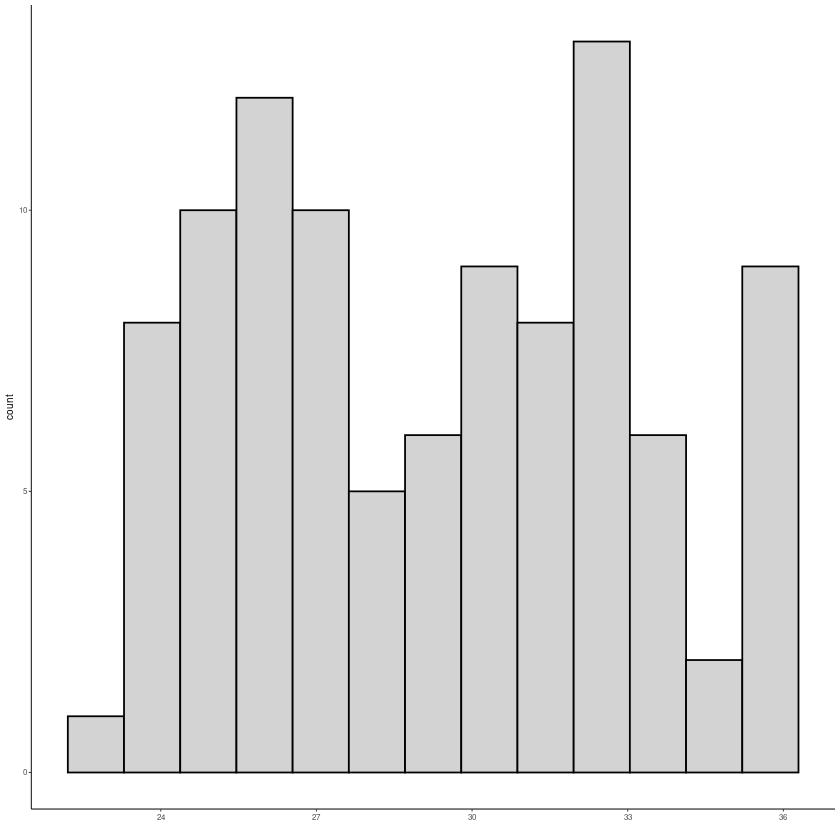

In [42]:
#histogram for age in months for eyetracking
ggplot(subset(subject_info, include_eyetracking & type == 'child')
) + geom_histogram(aes(x=round(age_in_months)), fill="lightgray", 
        color='black', bins =13) + theme_classic(base_size=6) + scale_x_continuous(name='',
breaks=seq(24,36,3), labels=seq(24,36,3))
ggsave('figures/marginal_eyetracking.pdf', width=3, height=1)

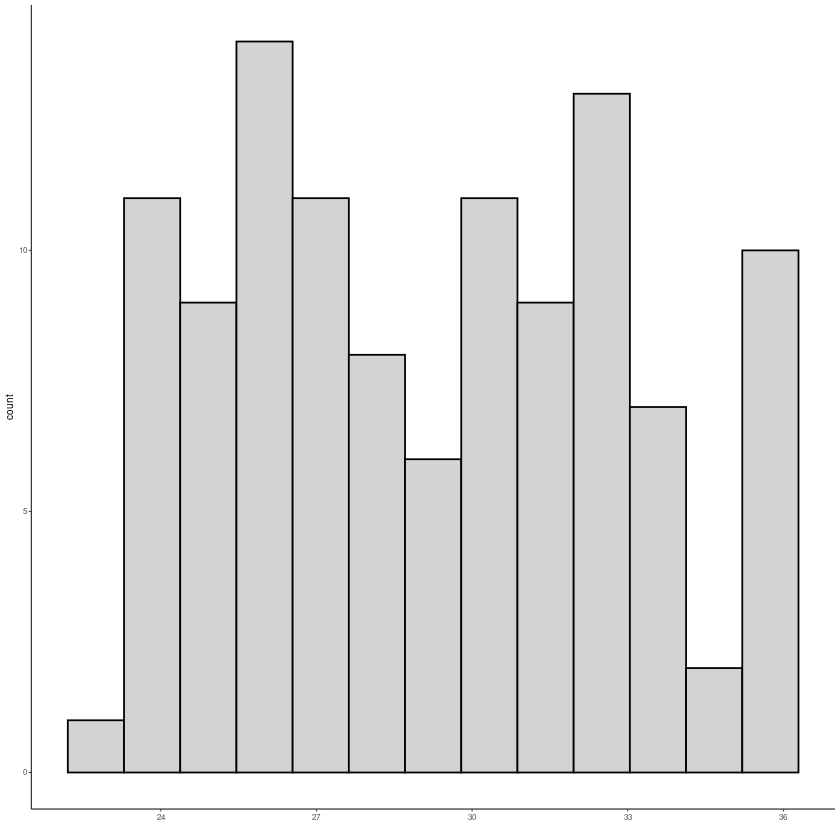

In [43]:
#histogram for age in months for eyetracking
ggplot(subset(subject_info, include_storybook & type == 'child')
) + geom_histogram(aes(round(x=age_in_months)), fill="lightgray", color='black',
                   bins =13) + theme_classic(base_size=6) + scale_x_continuous(name='',
breaks=seq(24,36,3), labels=seq(24,36,3))
ggsave('figures/marginal_storybook.pdf', width=3, height=1)

# Choose Storybook Participants for Recoding

In [44]:
# storbybook_kids = subset(subject_info, type == 'child' & include_storybook & in_study)

In [45]:
# recode_df = data.frame(sample(storbybook_kids$participant_name, length(storbybook_kids$participant_name),
#       replace = F))
# names(recode_df) = 'participant_name'
# write.csv(recode_df, 'storybook_participants_for_recoding.csv', row.names=F)

In [46]:
# file_len <- function(fil) {
#   if (file.info(fil)$size != 0) {
#     wavHeader <- readWave(fil, header = TRUE)
#     wavHeader$samples / wavHeader$sample.rate
#   } else {
#     0
#   }
# }

# file_len('audio/pl52.wav')

In [47]:
# storybook_df = data.frame(file = list.files('audio'))
# storybook_df$duration = sapply(storybook_df$file,
#                                function(x){
#                                    file_len(paste('audio',x, sep='/'))
#                                    })
# storybook_df$duration_in_minutes = storybook_df$duration / 60

In [48]:
# storybook_df[order(storybook_df$duration_in_minutes),]

In [49]:
# sum(storybook_df$duration_in_minutes) / 60

# Audio Stimuli Properties

## Plural  Segment Duration (Background version)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



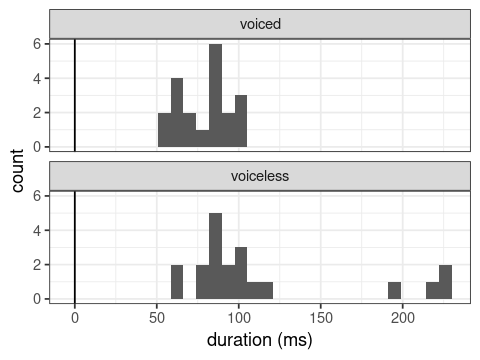

In [50]:
options(repr.plot.width=4, repr.plot.height=3)
ggplot(subset(bg_audio_timings_with_metadata, plural_duration != 0)) + geom_histogram(aes(x=plural_duration)
) + facet_wrap(~voicing, ncol=1) + theme_bw() + geom_vline(xintercept=0) +xlab('duration (ms)')

Instances of the voiceless allomorph have a longer duration than those of the voiced allomorph

## Prepositional Phrase Duration (Background version)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



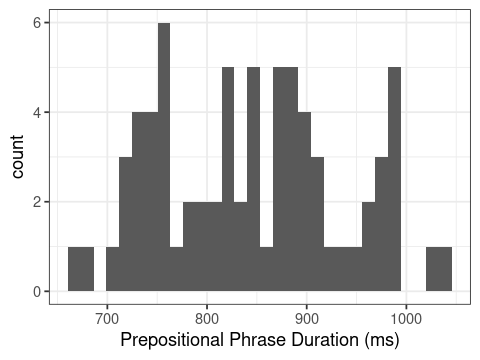

In [51]:
mean_pp_duration= mean(bg_audio_timings$pp_duration, na.rm=T) * 1000
options(repr.plot.width=4, repr.plot.height=3)
ggplot(bg_audio_timings) + geom_histogram(aes(x=pp_duration * 1000)) + theme_bw() + xlab('Prepositional Phrase Duration (ms)')

In [52]:
### Intro Phrase Durations (Background Version)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



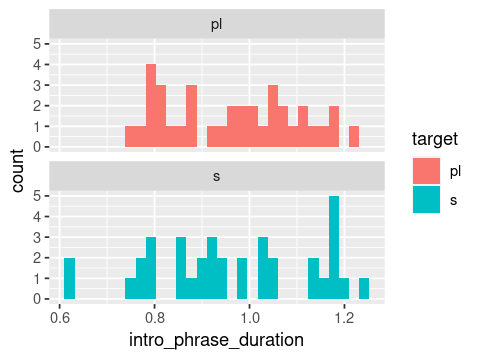

In [53]:
bg_audio_timings_with_metadata$intro_phrase_duration = bg_audio_timings_with_metadata$begin_disambig_region- bg_audio_timings_with_metadata$start_time
ggplot(bg_audio_timings_with_metadata) + geom_histogram(
    aes(x=intro_phrase_duration, fill=target)) + facet_wrap(~target, ncol=1)

In [54]:
subset(bg_audio_timings_with_metadata, intro_phrase_duration < .7)

,AudioTarget,s_form,novel_id,background_context,vowel_carrier,full_carrier,s_carrier,s_punct,s_wav_index,s_sentence,⋯,start_time,stop_time,target_noun_start_time,begin_disambig_region,target_noun_end_time,filename,disambig_time,pp_duration,plural_duration,intro_phrase_duration
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
56,6.wav,dup,2028-600,hill,on the hill,Look at the on the hill,Look at the,!,6,6. dup... Look at the dup on the hill!,⋯,30.937,32.578,31.565,31.565,31.791,6.wav,3128,0.787,226,0.628
66,7.wav,fip,2030-600,couch,on the couch,Look at the on the couch,Look at the,!,7,7. fip... Look at the fip on the couch!,⋯,36.590,38.367,37.204,37.204,37.400,7.wav,3114,0.967,196,0.614


Followed up on these (left edge of the singulars); they are relatively high speech rate

In [55]:
wilcox.test(subset(bg_audio_timings_with_metadata, target == 's')$intro_phrase_duration,
                 subset(bg_audio_timings_with_metadata, target == 'pl')$intro_phrase_duration)

Warning message in wilcox.test.default(subset(bg_audio_timings_with_metadata, target == :
“cannot compute exact p-value with ties”



	Wilcoxon rank sum test with continuity correction

data:  subset(bg_audio_timings_with_metadata, target == "s")$intro_phrase_duration and subset(bg_audio_timings_with_metadata, target == "pl")$intro_phrase_duration
W = 655.5, p-value = 0.9372
alternative hypothesis: true location shift is not equal to 0


Duration of intro phrases is not distinguished in the background version

## Plural  Segment Duration (Simplified version)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



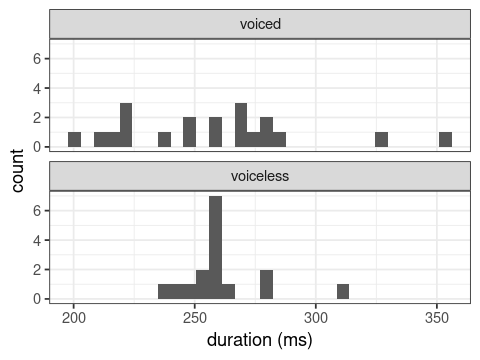

In [56]:
options(repr.plot.width=4, repr.plot.height=3)
ggplot(subset(rb_audio_timings_with_metadata, plural_duration > 0)) + geom_histogram(aes(x=plural_duration)
) + facet_wrap(~voicing, ncol=1) + theme_bw() +xlab('duration (ms)')

In [57]:
subset(rb_audio_timings_with_metadata, plural_duration > 325)

,AudioTarget,s_form,novel_id,background_context,vowel_carrier,full_carrier,s_carrier,s_punct,s_wav_index,s_sentence,⋯,DistractorImage,start_time,stop_time,target_noun_start_time,begin_disambig_region,target_noun_end_time,filename,disambig_time,pp_duration,plural_duration
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
18,25.wav,kib,2039-600,house,in the house,Can you find the in the house,Can you find the,?,17,17. kib... Can you find the kib in the house?,⋯,1_kib_singular_left.png,4.649,6.500,5.780,6.175,6.500,25.wav,4026,0,325
55,59.wav,frog,!,tree,in the tree,Look at the in the tree,Look at the,!,51,51. frog... Look at the frog in the tree!,⋯,1_frog_singular_right.png,14.737,16.106,15.232,15.752,16.106,59.wav,3515,0,354


[ ] Some of the voiced items are very long durations, requiring followup

### Intro Phrase Durations (Simplified Version)

In [58]:
rb_audio_timings_with_metadata$intro_phrase_duration = rb_audio_timings_with_metadata$begin_disambig_region- rb_audio_timings_with_metadata$start_time

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



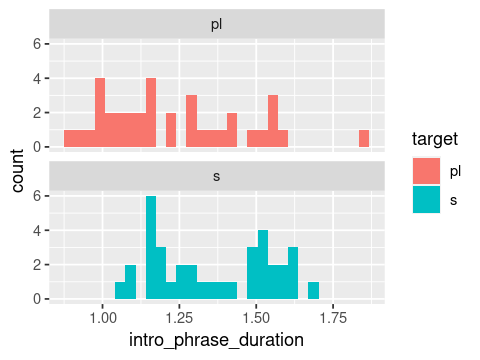

In [59]:
ggplot(rb_audio_timings_with_metadata) + geom_histogram(
    aes(x=intro_phrase_duration, fill=target)) + facet_wrap(~target, ncol=1)

In [60]:
# Plural phrase durations are substantively shorter than the singular phrase durations 

In [61]:
wilcox.test(subset(rb_audio_timings_with_metadata, target == 's')$intro_phrase_duration,
                 subset(rb_audio_timings_with_metadata, target == 'pl')$intro_phrase_duration)

Warning message in wilcox.test.default(subset(rb_audio_timings_with_metadata, target == :
“cannot compute exact p-value with ties”



	Wilcoxon rank sum test with continuity correction

data:  subset(rb_audio_timings_with_metadata, target == "s")$intro_phrase_duration and subset(rb_audio_timings_with_metadata, target == "pl")$intro_phrase_duration
W = 890.5, p-value = 0.006419
alternative hypothesis: true location shift is not equal to 0


[ ] Plural intro durations are longer than the singular intro durations, necessitating followup

# Preprocess Eyetracking Data

In [62]:
source('PLEARN_analysis_helper.R')
eyetracking_participants = subset(subject_info, expt_version 
    %in% c('agreement', 'scene','redblue') & include_eyetracking == 1)  
options(readr.show_col_types = FALSE)

ed = lapply(1:nrow(eyetracking_participants), function(i){
#ed = mclapply(1:nrow(eyetracking_participants), function(i){
    
    participant = eyetracking_participants[i,]
    print(participant)
    if (!participant$in_study |
        participant$filename == '' | is.null(participant$filename) |
        is.na(participant$filename) | participant$include_eyetracking == 0){
        print(paste0('No eyetracking data for ', participant$id,' (or excluded), skipping...'))
        return(NULL)
    } else {
        if (participant$expt_version == 'scene'){
            audio_timings = bg_audio_timings
        } else if (participant$expt_version == 'redblue') {
            audio_timings = rb_audio_timings
         } else if (participant$expt_version == 'agreement') {
            audio_timings = inlab_agreement_audio_timings                
        } else {
            stop('expt_version not recognized')
        }        
        return(analyzeEyetrackingParticipant(
            'results/', 
            participant, 
            audio_timings))
    }
#}, mc.cores=48)
})

    id include_eyetracking include_storybook              filename age_in_days
1 plsm                   1                NA smflip3_fixreport.txt          NA
  gender  type expt_version group order                  comment
1      M adult        scene    NA    NA eyetracking only (adult)
  participant_name main_coder main_validated double_coder double_validated
1          smflip3       <NA>           <NA>           NA               NA
  comments trial_order age_in_months ran_participant in_study
1     <NA>          NA            NA            TRUE     TRUE
[1] "processing results/smflip3_fixreport.txt..."
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 579 269
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`


[1] "Dimensions of excel file read in:"
[1] 520
[1] "will write to:"
[1] "results/pl14_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 477 272
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`


[1] "Dimensions of excel file read in:"
[1] 725
[1] "will write to:"
[1] "results/pl15_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 676 272
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`


[1] "Dimensions of excel file read in:"
[1] 681
[1] "will write to:"
[1] "results/pl16_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 617 272
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`


[1] "Dimensions of excel file read in:"
[1] 748
[1] "will write to:"
[1] "results/pl18_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 672 271
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`


[1] "Dimensions of excel file read in:"
[1] 546
[1] "will write to:"
[1] "results/pl19_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 505 271
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`
• `__trial_index__1` -> `__trial_index__1...240`


[1] "Dimensions of excel file read in:"
[1] 735
[1] "will write to:"
[1] "results/pl20_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 693 273
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`
• `__trial_index__1` -> `__trial_index__1...240`


[1] "Dimensions of excel file read in:"
[1] 703
[1] "will write to:"
[1] "results/pl24_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 645 273
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`
• `__trial_index__1` -> `__trial_index__1...240`


[1] "Dimensions of excel file read in:"
[1] 545
[1] "will write to:"
[1] "results/pl25_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 499 273
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`
• `__trial_index__1` -> `__trial_index__1...240`
• `__trial_index__1` -> `__trial_index__1...241`
• `__trial_index__1` -> `__trial_index__1...242`
• `__trial_index__1` -> `__trial_index__1...243`
• `__trial_index__1` -> `__trial_index__1...244`
• `__trial_index__1` -> `__trial_index__1...245`


[1] "Dimensions of excel file read in:"
[1] 597
[1] "will write to:"
[1] "results/pl46_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 552 278
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`
• `__trial_index__1` -> `__trial_index__1...240`
• `__trial_index__1` -> `__trial_index__1...241`
• `__trial_index__1` -> `__trial_index__1...242`
• `__trial_index__1` -> `__trial_index__1...243`
• `__trial_index__1` -> `__trial_index__1...244`
• `__trial_index__1` -> `__trial_index__1...245`


[1] "Dimensions of excel file read in:"
[1] 721
[1] "will write to:"
[1] "results/pl47_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 680 278
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`
• `__trial_index__1` -> `__trial_index__1...240`
• `__trial_index__1` -> `__trial_index__1...241`
• `__trial_index__1` -> `__trial_index__1...242`
• `__trial_index__1` -> `__trial_index__1...243`
• `__trial_index__1` -> `__trial_index__1...244`
• `__trial_index__1` -> `__trial_index__1...245`


[1] "Dimensions of excel file read in:"
[1] 619
[1] "will write to:"
[1] "results/pl48_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 569 278
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`
• `__trial_index__1` -> `__trial_index__1...240`
• `__trial_index__1` -> `__trial_index__1...241`
• `__trial_index__1` -> `__trial_index__1...242`
• `__trial_index__1` -> `__trial_index__1...243`
• `__trial_index__1` -> `__trial_index__1...244`
• `__trial_index__1` -> `__trial_index__1...245`


[1] "Dimensions of excel file read in:"
[1] 514
[1] "will write to:"
[1] "results/pl49_fixations.txt"
[1] "Missing trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 471 278
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_version"       

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`
• `__trial_index__1` -> `__trial_index__1...240`
• `__trial_index__1` -> `__trial_index__1...241`
• `__trial_index__1` -> `__trial_index__1...242`
• `__trial_index__1` -> `__trial_index__1...243`
• `__trial_index__1` -> `__trial_index__1...244`
• `__trial_index__1` -> `__trial_index__1...245`


[1] "Dimensions of excel file read in:"
[1] 569
[1] "will write to:"
[1] "results/pl50_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 531 278
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`
• `__trial_index__1` -> `__trial_index__1...240`
• `__trial_index__1` -> `__trial_index__1...241`
• `__trial_index__1` -> `__trial_index__1...242`
• `__trial_index__1` -> `__trial_index__1...243`
• `__trial_index__1` -> `__trial_index__1...244`
• `__trial_index__1` -> `__trial_index__1...245`


[1] "Dimensions of excel file read in:"
[1] 718
[1] "will write to:"
[1] "results/pl51_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 686 278
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`
• `__trial_index__1` -> `__trial_index__1...240`
• `__trial_index__1` -> `__trial_index__1...241`
• `__trial_index__1` -> `__trial_index__1...242`
• `__trial_index__1` -> `__trial_index__1...243`
• `__trial_index__1` -> `__trial_index__1...244`
• `__trial_index__1` -> `__trial_index__1...245`


[1] "Dimensions of excel file read in:"
[1] 579
[1] "will write to:"
[1] "results/pl52_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 542 278
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`
• `__trial_index__1` -> `__trial_index__1...240`
• `__trial_index__1` -> `__trial_index__1...241`
• `__trial_index__1` -> `__trial_index__1...242`
• `__trial_index__1` -> `__trial_index__1...243`
• `__trial_index__1` -> `__trial_index__1...244`
• `__trial_index__1` -> `__trial_index__1...245`


[1] "Dimensions of excel file read in:"
[1] 671
[1] "will write to:"
[1] "results/pl55_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 637 278
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`
• `__trial_index__1` -> `__trial_index__1...240`
• `__trial_index__1` -> `__trial_index__1...241`
• `__trial_index__1` -> `__trial_index__1...242`
• `__trial_index__1` -> `__trial_index__1...243`
• `__trial_index__1` -> `__trial_index__1...244`
• `__trial_index__1` -> `__trial_index__1...245`


[1] "Dimensions of excel file read in:"
[1] 515
[1] "will write to:"
[1] "results/pl57_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 469 278
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`


[1] "Dimensions of excel file read in:"
[1] 678
[1] "will write to:"
[1] "results/pl59_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 633 272
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`


[1] "Dimensions of excel file read in:"
[1] 833
[1] "will write to:"
[1] "results/pl63_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 776 271
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`


[1] "Dimensions of excel file read in:"
[1] 629
[1] "will write to:"
[1] "results/pl64_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 582 271
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`
• `__trial_index__1` -> `__trial_index__1...239`


[1] "Dimensions of excel file read in:"
[1] 718
[1] "will write to:"
[1] "results/pl66_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 634 272
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

New names:
• `__trial_index__1` -> `__trial_index__1...236`
• `__trial_index__1` -> `__trial_index__1...237`
• `__trial_index__1` -> `__trial_index__1...238`


[1] "Dimensions of excel file read in:"
[1] 668
[1] "will write to:"
[1] "results/pl67_fixations.txt"
[1] "Correct number of trials in the original data"
[1] "Correct number of trials in merging with audio timings"
[1] "Dims of gaze before binify"
[1] 612 271
[1] "Finished binning fixations"
 [1] "timeBin"                         "FixationID"                     
 [3] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [5] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [7] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
 [9] "RT"                              "expt_index"                     
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_versi

In [63]:
ed_df = do.call('rbind.fill', ed)
ed_df$session_id = ed_df$filename

In [64]:
lookit_participants = subset(subject_info, expt_version 
                                 %in% c('agreement-lookit') & include_eyetracking == 1)

#ed_lookit = lapply(1:nrow(lookit_participants), function(i){
ed_lookit = mclapply(1:nrow(lookit_participants), function(i){
        participant = lookit_participants[i,]
        return(analyzeLookItParticipant(
            '/home/stephan/dropbox/Documents/MIT/research/PLEARN/lookit_data/', 
            participant$id, 
            trimws(strsplit(participant$main_coder,',')[[1]][1]),
            item_properties,
            lookit_agreement_audio_timings, 
            halt_on_missing=F,
            target_order = participant$trial_order,
            participant_type = 'child',
            plot=F,
            legacy = participant$id %in% c('jonahpilotlegacy')))
#    })
}, mc.cores=24)
ed_lookit_df = do.call('rbind.fill', ed_lookit)
ed_lookit_df$type = 'child'
ed_lookit_df$expt_version = "agreement-lookit"


In [65]:
ed_df_combined = rbind.fill(ed_df, ed_lookit_df)

In [66]:
nrow(ed_df_combined)

[1] 1529767

In [67]:
names(ed_df)

[1] "expt_index"                      "timeBin"                        
 [3] "FixationID"                      "CURRENT_FIX_START"              
 [5] "CURRENT_FIX_END"                 "TRIAL_INDEX"                    
 [7] "CURRENT_FIX_INDEX"               "RECORDING_SESSION_LABEL"        
 [9] "CURRENT_FIX_INTEREST_AREA_LABEL" "RT"                             
[11] "target"                          "s_form"                         
[13] "novelty"                         "animacystatus"                  
[15] "voicing"                         "practice"                       
[17] "Time"                            "Nonset"                         
[19] "type"                            "expt_version"                   
[21] "looks_to_t"                      "looks_to_d"                     
[23] "looks_to_td"                     "exclude_trial"                  
[25] "exclude_subject"                 "label_at_onset"                 
[27] "time_to_last_nonna"              "track_loss_at_0"                
[29] "filename"                        "session_id"

In [68]:
# figure out why type is not defined above

In [69]:
if (length(unique(subset(ed_df_combined, type == 'child')$session_id)) !=
    nrow(subset(subject_info, type == 'child' & include_eyetracking))){
    stop('Missing child data')
}

In [70]:
ed_df = ed_df_combined

In [71]:
ed_df = merge(ed_df_combined, subject_info, by=c('filename', 'expt_version','type'))
nrow(ed_df)
names(ed_df)

[1] 1529767

[1] "filename"                        "expt_version"                   
 [3] "type"                            "expt_index"                     
 [5] "timeBin"                         "FixationID"                     
 [7] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [9] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
[11] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
[13] "RT"                              "target"                         
[15] "s_form"                          "novelty"                        
[17] "animacystatus"                   "voicing"                        
[19] "practice"                        "Time"                           
[21] "Nonset"                          "looks_to_t"                     
[23] "looks_to_d"                      "looks_to_td"                    
[25] "exclude_trial"                   "exclude_subject"                
[27] "label_at_onset"                  "time_to_last_nonna"             
[29] "track_loss_at_0"                 "session_id"                     
[31] "AudioTarget"                     "ms"                             
[33] "original_frame_index"            "frame_index"                    
[35] "label"                           "trial"                          
[37] "start_time_ms"                   "normalized_ms"                  
[39] "frame_id"                        "seconds_recording_before_stim"  
[41] "order.x"                         "normal_or_calibration"          
[43] "novel_id"                        "background_context"             
[45] "vowel_carrier"                   "full_carrier"                   
[47] "s_carrier"                       "s_punct"                        
[49] "s_wav_index"                     "s_sentence"                     
[51] "pl_form"                         "pl_carrier"                     
[53] "pl_punct"                        "pl_wav_index"                   
[55] "pl_sentence"                     "simple_pl_stim"                 
[57] "simple_s_stim"                   "animacyStatus"                  
[59] "Trial"                           "Practice"                       
[61] "test_index"                      "TargetSide"                     
[63] "trial_index"                     "NovelColor"                     
[65] "order.y"                         "TargetLoc"                      
[67] "DistractorLoc"                   "TargetImage"                    
[69] "DistractorImage"                 "disambig_time"                  
[71] "TimeBin"                         "cfial_bin"                      
[73] "index"                           "id"                             
[75] "include_eyetracking"             "include_storybook"              
[77] "age_in_days"                     "gender"                         
[79] "group"                           "order"                          
[81] "comment"                         "participant_name"               
[83] "main_coder"                      "main_validated"                 
[85] "double_coder"                    "double_validated"               
[87] "comments"                        "trial_order"                    
[89] "age_in_months"                   "ran_participant"                
[91] "in_study"

In [72]:
#write.csv(ed_df, 'csv/inlab_and_lookit_ed_df.csv', row.names=F)

In [73]:
table(subset(ed_df, expt_version == 'agreement')$participant_name)


pl100 pl101 pl103 pl104 pl106 pl107  pl79  pl81  pl82  pl83  pl84  pl85  pl86 
 8919 10917  9597 12586 11463  9891 12561 14989 10046 15375  8024 13660 15049 
 pl87  pl88  pl89  pl90  pl91  pl92  pl93  pl94  pl95  pl96  pl97  pl98  pl99 
15116 11654 14079  3179 12237  1769  4541 10558 10260 14857  8402 13009 10544 

### Get the properties of the eyetracking participant population after data exclusion

In [74]:
# participants before exclusion
num_eyetracking_participants = aggregate(session_id ~ expt_version + type, ed_df, function(x){length(unique(x))} )
print(num_eyetracking_participants)

      expt_version  type session_id
1          redblue adult         15
2            scene adult          9
3        agreement child         26
4 agreement-lookit child         22
5          redblue child         22
6            scene child         29


In [75]:
# participants after exclusion
num_eyetracking_participants_after_exclusion =  aggregate(participant_name ~ expt_version + type, 
          subset(ed_df, exclude_subject == F), function(x){length(unique(x))} )
print(num_eyetracking_participants_after_exclusion)

      expt_version  type participant_name
1          redblue adult               15
2            scene adult                9
3        agreement child               25
4 agreement-lookit child               22
5          redblue child               22
6            scene child               29


In [76]:
# many are getting exexcluded

No additional exclusions after this filter

# Preprocess / Plot Production Data

We preprocess the production data at this point because we want to be able to use production scores as a grouping variable in the eyetracking analysis

In [77]:
p_coded = subset(rbind.fill(
    read.csv('productions_coded.csv', stringsAsFactors=F),
    read.csv('lookit_productions_coded.csv', stringsAsFactors=F)),
    !(itemId %in% c('p1','p2','p3','p4')))
# itemId is not to be trusted

p_coded$itemId = as.numeric(as.factor(as.character(p_coded$Lemma)))
print(names(p_coded))
print(nrow(p_coded))

[1] "child"                "itemId"               "Lemma"               
[4] "Singular.description" "Singular.Code"        "Plural.Description"  
[7] "Plural.Code"          "Comments"             "X"                   
[1] 1648


In [78]:
# if (length(setdiff(
#     subset(subject_info, expt_version %in% c('redblue',
#     'scene','agreement') & type == 'child' & include_storybook)$participant_name,
#     unique(p_coded$child))) > 0){
#     stop('Missing child codes')
# } 

In [79]:
numTrialsPerChild = aggregate(itemId ~ child, p_coded, length)
numTrialsPerChild = numTrialsPerChild[order(numTrialsPerChild$itemId, decreasing=T),]
if (nrow(subset(numTrialsPerChild, itemId != 16)) > 0){
    stop('Coded child data is missing trials')
}

In [80]:
num_production_items = length(unique(p_coded$itemId)) #16 test x 2 + 4 shared practice
if (num_production_items != 32){
    stop('There should be 32 test production items')
}

In [81]:
codebook = c(
    'No data (0)',
    'No verbal response (1)',
    'Not identifiable/babble (2)',
    'Other word (not noun) (3)',
    'Noun from context (4)',
    'Singular form (5)',
    'Non-conventional plural form (6)',
    'Plural form, approximate articulation (7)',
    'Plural form, adult-like articulation (8)' 
)

codes = data.frame(code = seq(0,8), description = codebook)
codes$description = factor(codes$description, levels = codebook)

In [82]:
pt_ds = read.csv('../PLEARN_experiments/plearn_productiveTask_datasource.csv')
p_coded = merge(p_coded, pt_ds, by.x='Lemma', by.y='s_form')
nrow(p_coded) # the decrease is because the remainder are practice

[1] 1648

In [83]:
names(p_coded)

[1] "Lemma"                "child"                "itemId"              
 [4] "Singular.description" "Singular.Code"        "Plural.Description"  
 [7] "Plural.Code"          "Comments"             "X"                   
[10] "novel_id"             "background_context"   "vowel_carrier"       
[13] "full_carrier"         "s_carrier"            "s_punct"             
[16] "s_wav_index"          "s_sentence"           "pl_form"             
[19] "pl_carrier"           "pl_punct"             "pl_wav_index"        
[22] "pl_sentence"          "novelty"              "voicing"             
[25] "simple_pl_stim"       "simple_s_stim"        "animacyStatus"       
[28] "test_index"           "trial_index"          "Trial"               
[31] "Practice"             "NovelColor"           "book"

In [84]:
s_codes = aggregate(itemId ~ Singular.Code + child, p_coded, length)
names(s_codes) = c('code', 'child', 'count')
s_codes = merge(s_codes, codes, all = T)
s_codes$s_pl ='singular'
subset(s_codes, code == '')

code,child,count,description,s_pl
<int>,<chr>,<int>,<fct>,<chr>


In [85]:
p_codes = aggregate(itemId ~ Plural.Code + child, p_coded, length)
names(p_codes) = c('code', 'child','count')
p_codes = merge(p_codes, codes, all = T)
p_codes$s_pl = 'plural'
subset(p_codes, code == '')

code,child,count,description,s_pl
<chr>,<chr>,<int>,<fct>,<chr>


In [86]:
code_counts = rbind.fill(s_codes, p_codes)
code_counts$s_pl = factor(code_counts$s_pl, levels =c('singular','plural'))
head(code_counts)

,code,child,count,description,s_pl
,<chr>,<chr>,<int>,<fct>,<fct>
1,0,1e04539d-c09d-4f71-96a4-5e01bb073d67,8,No data (0),singular
2,0,pl01,1,No data (0),singular
3,0,765d8cc5-efaf-4599-aa55-c48e43f46dc5,1,No data (0),singular
4,1,019e5595-bffa-4ab1-935c-a501119f1380,1,No verbal response (1),singular
5,1,pl84,2,No verbal response (1),singular
6,1,pl79,1,No verbal response (1),singular


In [87]:
excluded_storybook_trials = subset(code_counts, description == 'No data (0)')
numStorybookTrialsExcluded = sum(excluded_storybook_trials$count)
numStorybookTrialsExcluded
numChildrenWithTrialsExcludedFromStorybook =length(unique(excluded_storybook_trials$child))
tvc = update_texvar_cache(tvc, 'numStorybookTrialsExcluded', numStorybookTrialsExcluded)
tvc = update_texvar_cache(tvc, 'numChildrenWithTrialsExcludedFromStorybook', numChildrenWithTrialsExcludedFromStorybook)
writeout_texvar_cache(tvc, 'texvars/three_analyses.tex',appendDate=T)

[1] 36

# Compute Production Scores

In [88]:
# note that both of these are subset to singular succeses
computeProductionScores = function(codes, method = 'narrow'){    
    if (method == 'narrow'){
        # if they marked the plural in some way,was it adult-like? (i.e. the question in
        # Clark and Nikitina (2009))
        sum(codes %in% c(7,8)) / sum(codes %in% seq(6,8))
    } else if (method == 'broad') {
        # did they mark the plural?
        sum(codes %in% c(7,8)) / sum(codes %in% seq(2,8))
    }
}

In [89]:
narrow_production_scores = aggregate(Plural.Code ~ child, subset(p_coded, Singular.Code == 5), computeProductionScores)
names(narrow_production_scores) = c('participant_name', 'narrow_score')
broad_production_scores = aggregate(Plural.Code ~ child, subset(p_coded, Singular.Code == 5), function(x){computeProductionScores(x,'broad')})
names(broad_production_scores) = c('participant_name','broad_score')

In [90]:
# add the production scores to subject info
subject_info = merge(merge(subject_info, broad_production_scores, all=T), 
                     narrow_production_scores, all=T)

In [91]:
subject_info

participant_name,id,include_eyetracking,include_storybook,filename,age_in_days,gender,type,expt_version,group,⋯,main_validated,double_coder,double_validated,comments,trial_order,age_in_months,ran_participant,in_study,broad_score,narrow_score
<chr>,<chr>,<dbl>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,⋯,<chr>,<lgl>,<lgl>,<chr>,<int>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>
019e5595-bffa-4ab1-935c-a501119f1380,019e5595-bffa-4ab1-935c-a501119f1380,1,1,019e5595-bffa-4ab1-935c-a501119f1380,732,NA,child,agreement-lookit,NA,⋯,y,NA,NA,98.5% coverage,1,24.00000,TRUE,TRUE,0.0000000,NaN
051d85eb-5513-4d58-b2b9-0a16d27a64d8,051d85eb-5513-4d58-b2b9-0a16d27a64d8,1,1,051d85eb-5513-4d58-b2b9-0a16d27a64d8,731,NA,child,agreement-lookit,NA,⋯,,NA,NA,passes,1,23.96721,TRUE,TRUE,NA,NA
0b51e58f-72dc-4f65-aea9-c36eddf418df,0b51e58f-72dc-4f65-aea9-c36eddf418df,1,1,0b51e58f-72dc-4f65-aea9-c36eddf418df,977,NA,child,agreement-lookit,NA,⋯,y,NA,NA,99.53% coverage,1,32.03279,TRUE,TRUE,0.0000000,0.00
13badd8d-0051-49d4-80a7-1d61a1ec2cce,13badd8d-0051-49d4-80a7-1d61a1ec2cce,1,1,13badd8d-0051-49d4-80a7-1d61a1ec2cce,871,NA,child,agreement-lookit,NA,⋯,y,NA,NA,passes,2,28.55738,TRUE,TRUE,0.1428571,1.00
151aafac-e33a-439b-9af3-b6349946d18a,151aafac-e33a-439b-9af3-b6349946d18a,0,1,151aafac-e33a-439b-9af3-b6349946d18a,731,NA,child,agreement-lookit,NA,⋯,,NA,NA,,1,23.96721,TRUE,TRUE,0.0625000,1.00
19d76457-671f-4ac5-8e21-4c3544285262,19d76457-671f-4ac5-8e21-4c3544285262,0,1,19d76457-671f-4ac5-8e21-4c3544285262,787,NA,child,agreement-lookit,NA,⋯,,NA,NA,Can't include because there is no frame information,1,25.80328,TRUE,TRUE,0.0000000,0.00
1e04539d-c09d-4f71-96a4-5e01bb073d67,1e04539d-c09d-4f71-96a4-5e01bb073d67,1,1,1e04539d-c09d-4f71-96a4-5e01bb073d67,1052,NA,child,agreement-lookit,NA,⋯,y,NA,NA,98.33% coverage,1,34.49180,TRUE,TRUE,0.4000000,0.40
1e8ae9b0-6b68-4636-a983-4e53b2522fce,1e8ae9b0-6b68-4636-a983-4e53b2522fce,1,1,1e8ae9b0-6b68-4636-a983-4e53b2522fce,749,NA,child,agreement-lookit,NA,⋯,y,NA,NA,99.34% coverage,1,24.55738,TRUE,TRUE,0.0000000,NaN
1ecda138-4c67-4fc6-b771-b227aa216456,1ecda138-4c67-4fc6-b771-b227aa216456,1,1,1ecda138-4c67-4fc6-b771-b227aa216456,928,NA,child,agreement-lookit,NA,⋯,,NA,NA,passes,1,30.42623,TRUE,TRUE,1.0000000,1.00


In [92]:
broad_production_scores[1,]

,participant_name,broad_score
,<chr>,<dbl>
1,019e5595-bffa-4ab1-935c-a501119f1380,0


In [93]:
nrow(subset(subject_info, type == 'child' & expt_version %in% c('scene','redblue','agreement','agreement-lookit')))
nrow(subset(broad_production_scores, !is.nan(broad_score)))

[1] 118

[1] 100

In [94]:
nrow(subset(subject_info, type == 'child' & expt_version %in% c('scene','redblue','agreement','agreement-lookit') & in_study))
nrow(subset(broad_production_scores, !is.nan(broad_score)))

[1] 115

[1] 100

In [95]:
# shapiro.test(subset(subject_info, type == 'child' & 
#                     expt_version %in% c('scene') & in_study)$broad_score)
# shapiro.test(subset(subject_info, type == 'child' & 
#                     expt_version %in% c('redblue') & in_study)$broad_score)

In [96]:
# can we combine the two?
production_wt = wilcox.test(subset(subject_info, in_study & expt_version == 'redblue')$broad_score,
             subset(subject_info, in_study & expt_version == 'scene')$broad_score)
production_wt

Warning message in wilcox.test.default(subset(subject_info, in_study & expt_version == :
“cannot compute exact p-value with ties”



	Wilcoxon rank sum test with continuity correction

data:  subset(subject_info, in_study & expt_version == "redblue")$broad_score and subset(subject_info, in_study & expt_version == "scene")$broad_score
W = 222.5, p-value = 0.3921
alternative hypothesis: true location shift is not equal to 0


In [97]:
production_wt2 = wilcox.test(subset(subject_info, in_study & expt_version == 'redblue')$broad_score,
             subset(subject_info, in_study & expt_version == 'agreement')$broad_score)
production_wt2

Warning message in wilcox.test.default(subset(subject_info, in_study & expt_version == :
“cannot compute exact p-value with ties”



	Wilcoxon rank sum test with continuity correction

data:  subset(subject_info, in_study & expt_version == "redblue")$broad_score and subset(subject_info, in_study & expt_version == "agreement")$broad_score
W = 321.5, p-value = 0.6327
alternative hypothesis: true location shift is not equal to 0


In [98]:
production_wt3 = wilcox.test(subset(subject_info, in_study & expt_version == 'scene')$broad_score,
             subset(subject_info, in_study & expt_version == 'agreement')$broad_score)
production_wt3

Warning message in wilcox.test.default(subset(subject_info, in_study & expt_version == :
“cannot compute exact p-value with ties”



	Wilcoxon rank sum test with continuity correction

data:  subset(subject_info, in_study & expt_version == "scene")$broad_score and subset(subject_info, in_study & expt_version == "agreement")$broad_score
W = 289.5, p-value = 0.1354
alternative hypothesis: true location shift is not equal to 0


In [99]:
productionWilcoxonStat = unname(production_wt$statistic)[1]
tvc = update_texvar_cache(tvc, 'productionWilcoxonStat', productionWilcoxonStat)
productionWilcoxonP = unname(production_wt$p.value)[1]
tvc = update_texvar_cache(tvc, 'productionWilcoxonP', productionWilcoxonP)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [100]:
# add the production scores to ed_df
ed_df = merge(
    merge(ed_df, broad_production_scores, by='participant_name', all=T),
    narrow_production_scores, by='participant_name', all=T)

In [101]:
names(ed_df)
nrow(ed_df)

[1] "participant_name"                "filename"                       
 [3] "expt_version"                    "type"                           
 [5] "expt_index"                      "timeBin"                        
 [7] "FixationID"                      "CURRENT_FIX_START"              
 [9] "CURRENT_FIX_END"                 "TRIAL_INDEX"                    
[11] "CURRENT_FIX_INDEX"               "RECORDING_SESSION_LABEL"        
[13] "CURRENT_FIX_INTEREST_AREA_LABEL" "RT"                             
[15] "target"                          "s_form"                         
[17] "novelty"                         "animacystatus"                  
[19] "voicing"                         "practice"                       
[21] "Time"                            "Nonset"                         
[23] "looks_to_t"                      "looks_to_d"                     
[25] "looks_to_td"                     "exclude_trial"                  
[27] "exclude_subject"                 "label_at_onset"                 
[29] "time_to_last_nonna"              "track_loss_at_0"                
[31] "session_id"                      "AudioTarget"                    
[33] "ms"                              "original_frame_index"           
[35] "frame_index"                     "label"                          
[37] "trial"                           "start_time_ms"                  
[39] "normalized_ms"                   "frame_id"                       
[41] "seconds_recording_before_stim"   "order.x"                        
[43] "normal_or_calibration"           "novel_id"                       
[45] "background_context"              "vowel_carrier"                  
[47] "full_carrier"                    "s_carrier"                      
[49] "s_punct"                         "s_wav_index"                    
[51] "s_sentence"                      "pl_form"                        
[53] "pl_carrier"                      "pl_punct"                       
[55] "pl_wav_index"                    "pl_sentence"                    
[57] "simple_pl_stim"                  "simple_s_stim"                  
[59] "animacyStatus"                   "Trial"                          
[61] "Practice"                        "test_index"                     
[63] "TargetSide"                      "trial_index"                    
[65] "NovelColor"                      "order.y"                        
[67] "TargetLoc"                       "DistractorLoc"                  
[69] "TargetImage"                     "DistractorImage"                
[71] "disambig_time"                   "TimeBin"                        
[73] "cfial_bin"                       "index"                          
[75] "id"                              "include_eyetracking"            
[77] "include_storybook"               "age_in_days"                    
[79] "gender"                          "group"                          
[81] "order"                           "comment"                        
[83] "main_coder"                      "main_validated"                 
[85] "double_coder"                    "double_validated"               
[87] "comments"                        "trial_order"                    
[89] "age_in_months"                   "ran_participant"                
[91] "in_study"                        "broad_score"                    
[93] "narrow_score"

[1] 1529788

# Associate Participant Information With All Records

In [102]:
num_trials_per_subj = aggregate(TRIAL_INDEX ~ participant_name + exclude_trial, ed_df, function(x){length(unique(x))})

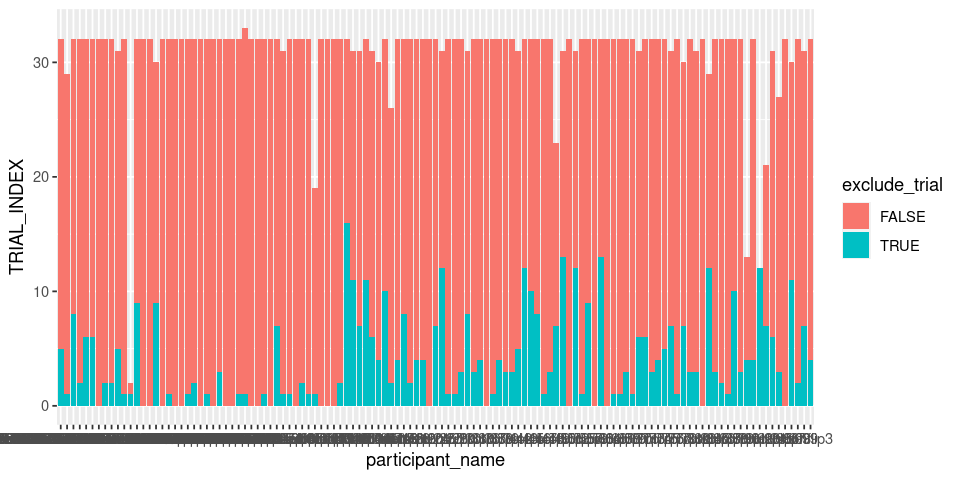

In [103]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(num_trials_per_subj) + geom_bar(aes(x=participant_name, fill=exclude_trial, 
                                           y=TRIAL_INDEX), stat='identity', position="stack")

In [104]:
# whole participants who were excluded
nChildrenWithExcludedTrials = 
length(unique(subset(ed_df, type == 'child' & exclude_trial == T )$participant_name))
nChildrenWithExcludedTrials
tvc = update_texvar_cache(tvc, 'nChildrenWithExcludedTrials', 
    nChildrenWithExcludedTrials)

[1] 87

In [105]:
ed_df$name_trial = paste0(ed_df$participant_name,'_',ed_df$expt_index)

In [106]:
# whole participants who were excluded
nTrialsExcludedByFilter = 
length(unique(subset(ed_df, type == 'child' & exclude_trial == T )$name_trial))
nTrialsExcludedByFilter
tvc = update_texvar_cache(tvc, 'nTrialsExcludedByFilter', 
    nTrialsExcludedByFilter)

[1] 444

In [107]:
percentExcludedEyetrackingTrials = 100 * length(unique(subset(ed_df, type == 'child' & exclude_trial == T )$name_trial)) / length(unique(subset(ed_df, type == 'child')$name_trial))
percentExcludedEyetrackingTrials
tvc = update_texvar_cache(tvc, 'percentExcludedEyetrackingTrials', 
    percentExcludedEyetrackingTrials, digits=0)

[1] 14.67284

In [108]:
# whole participants who were excluded
n_eyetracking_subj_excluded_by_data_filter = length(unique(subset(ed_df, exclude_subject ==T )$participant_name))
n_eyetracking_subj_excluded_by_data_filter
tvc = update_texvar_cache(tvc, 'nEyetrackingSubjExcludedByDataFilter', 
    n_eyetracking_subj_excluded_by_data_filter)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

[1] 1

In [109]:
# add the trial order as a grouping variable
ed_df$first3 = 'remainder'
ed_df$first3[ed_df$TRIAL_INDEX <= 7] = 'first 3 test trials'

# Plot Aggregate Eyetracking Timecourses

## Background / PP Version

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='adult'&expt_version=='scene'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='adult'&expt_version=='scene'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


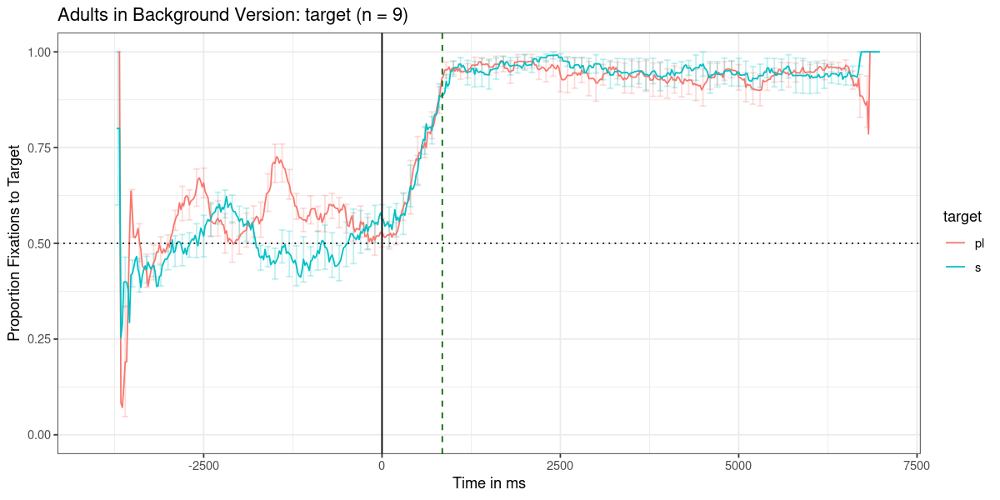

[1] "figures/type=='adult'&expt_version=='scene'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


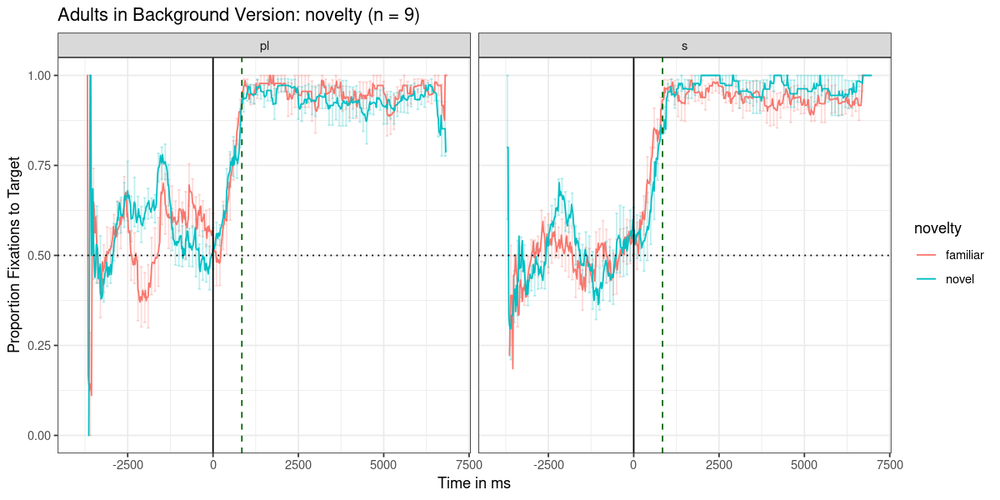

[1] "figures/type=='adult'&expt_version=='scene'_animacystatus_~target.pdf"


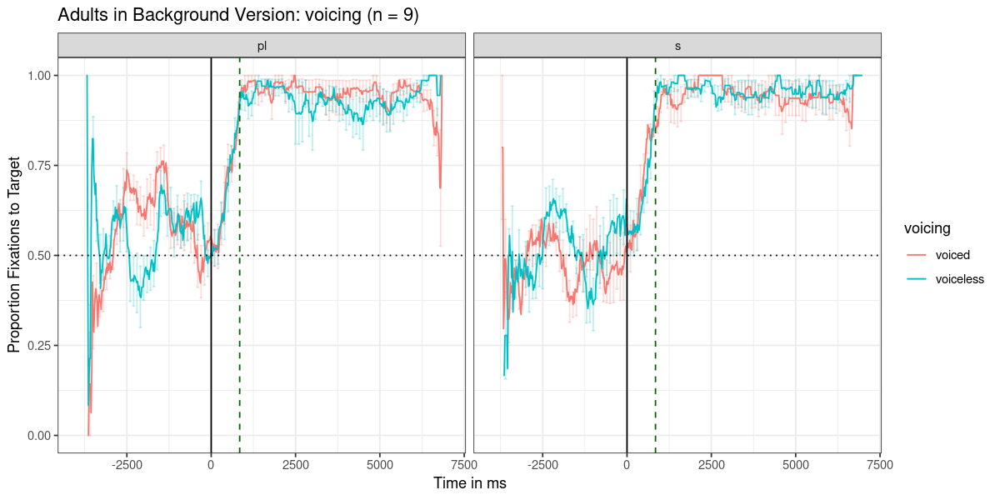

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='adult'&expt_version=='scene'_nullgroup_~label_at_onset.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


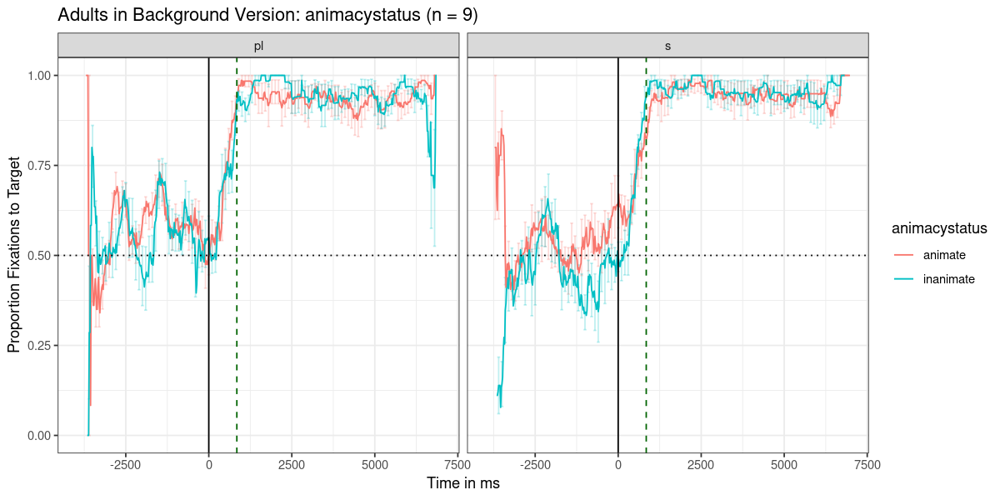

[1] "figures/type=='adult'&expt_version=='scene'_target_~novelty.pdf"


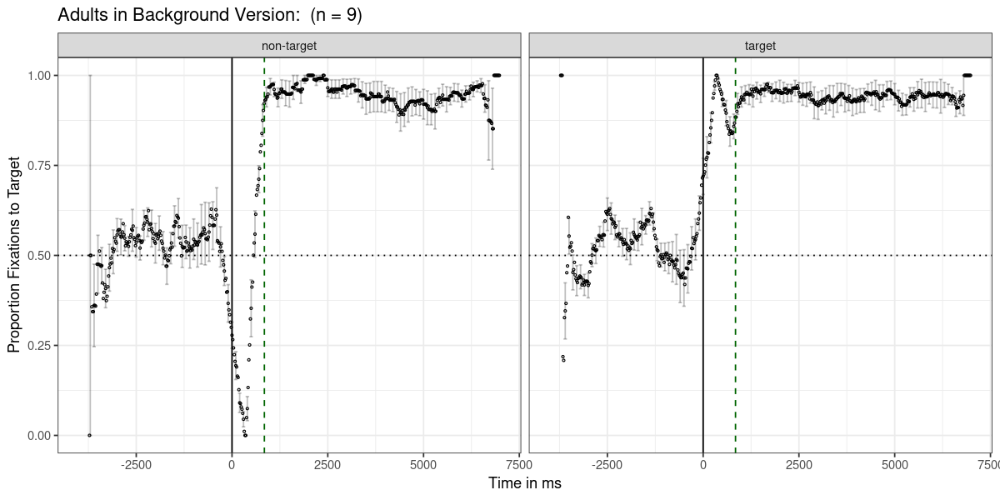

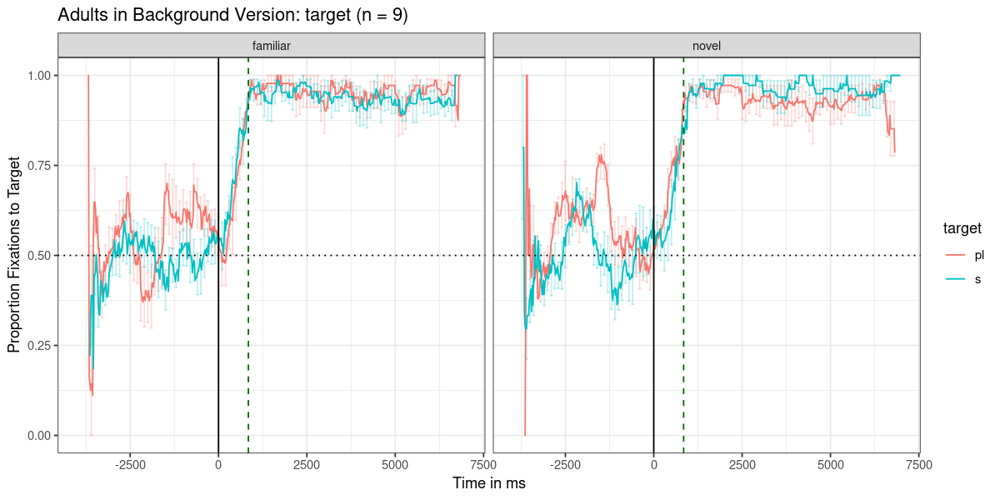

In [110]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'adult' & expt_version == 'scene'",
    mean_pp_duration = mean_pp_duration, group_title = 'Adults in Background Version',
    save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='scene'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='scene'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


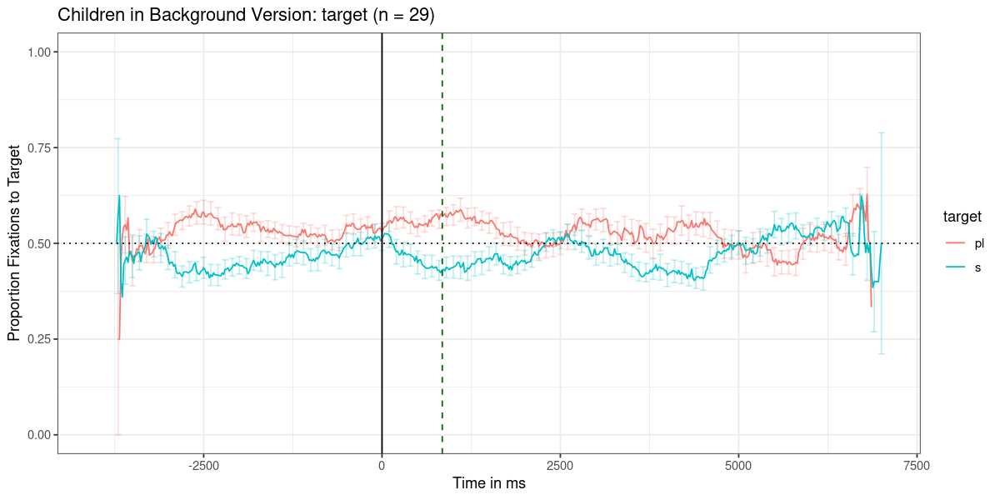

[1] "figures/type=='child'&expt_version=='scene'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


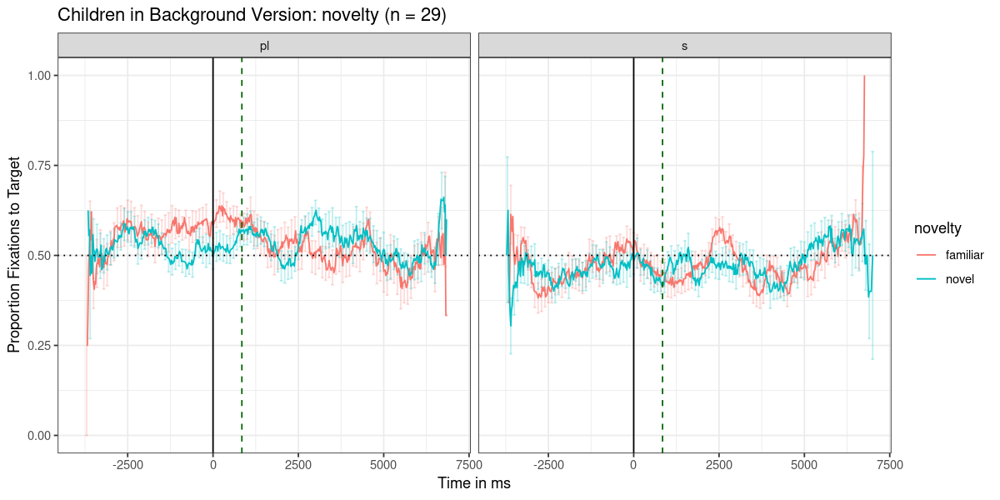

[1] "figures/type=='child'&expt_version=='scene'_animacystatus_~target.pdf"


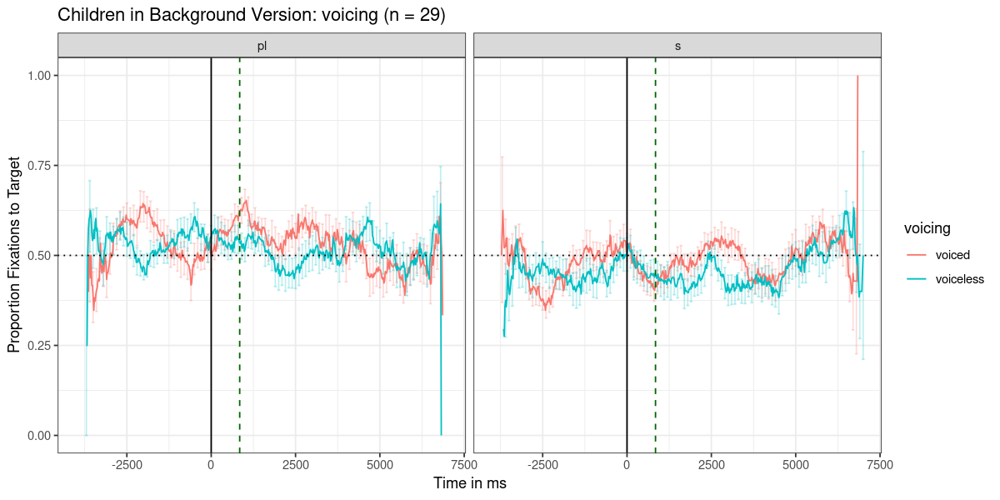

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&expt_version=='scene'_nullgroup_~label_at_onset.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


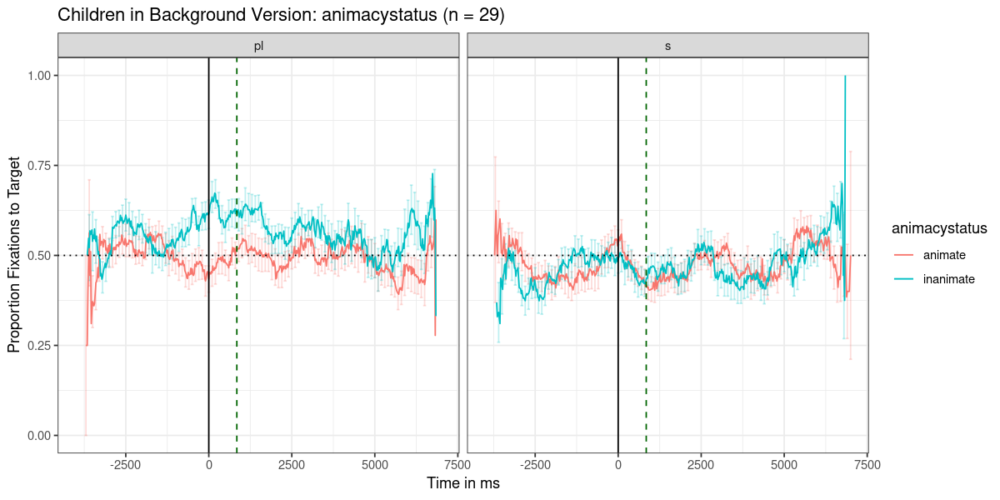

[1] "figures/type=='child'&expt_version=='scene'_target_~novelty.pdf"


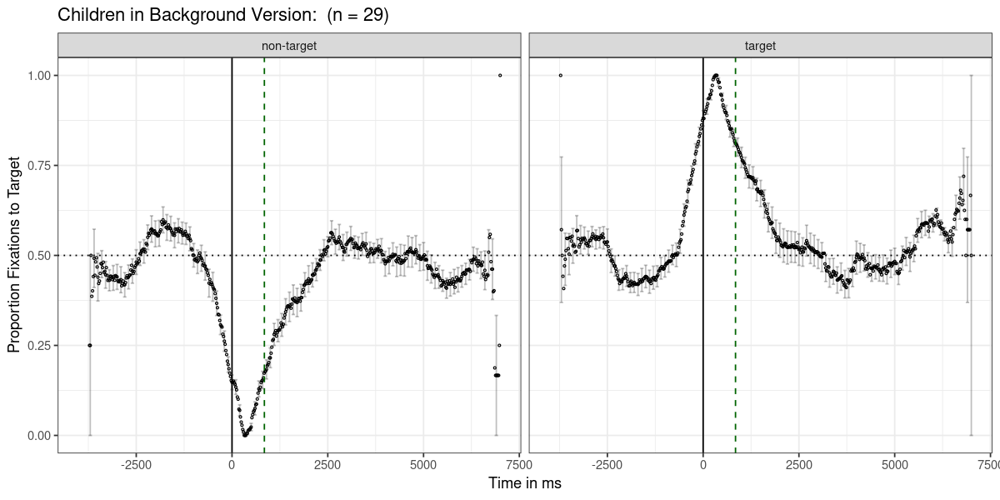

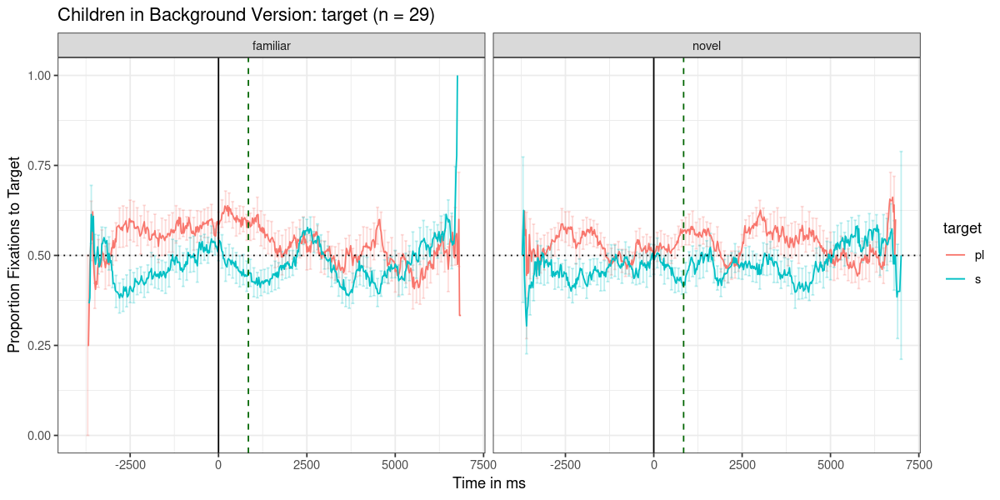

In [111]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'child'& expt_version == 'scene'",
    mean_pp_duration = mean_pp_duration, group_title = 'Children in Background Version',
    save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


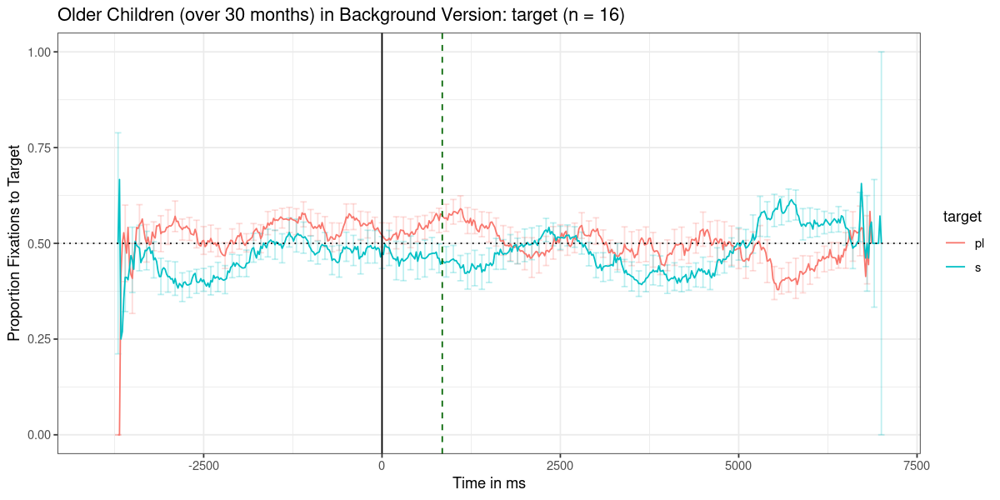

[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


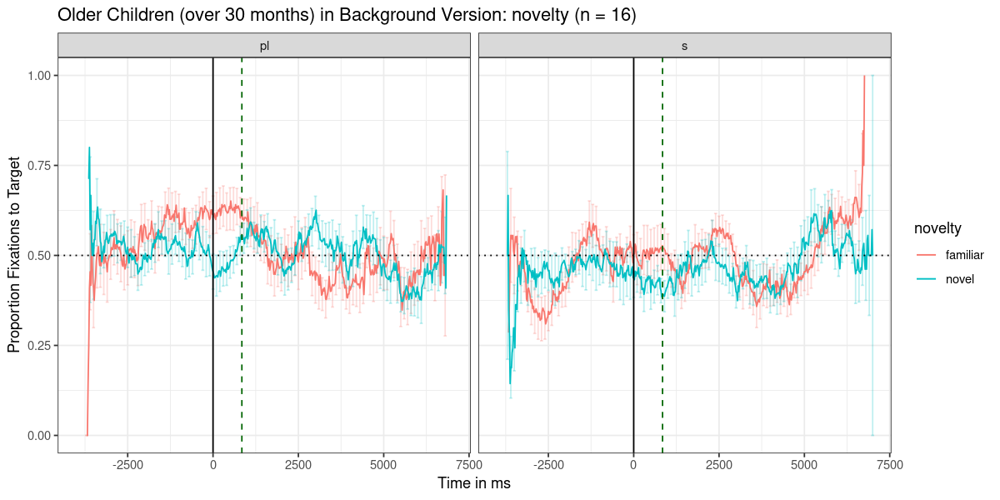

[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_animacystatus_~target.pdf"


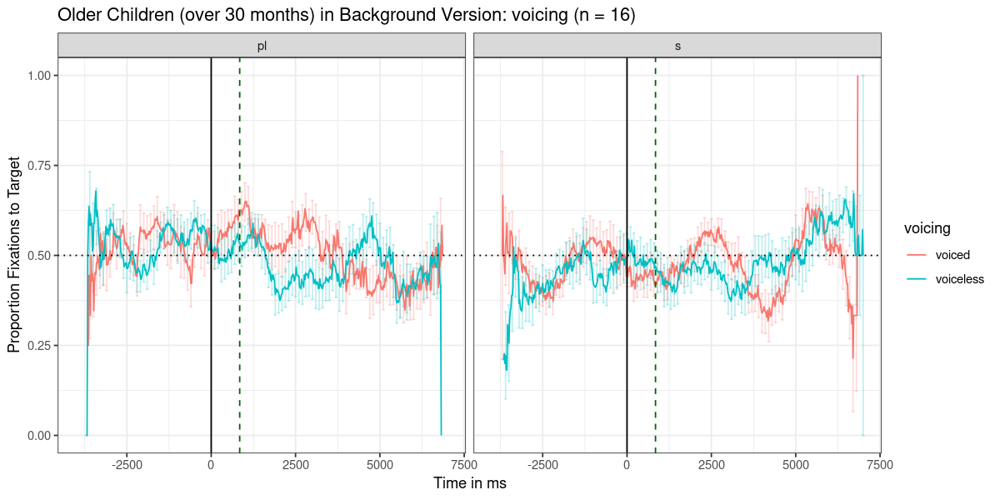

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_nullgroup_~label_at_onset.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


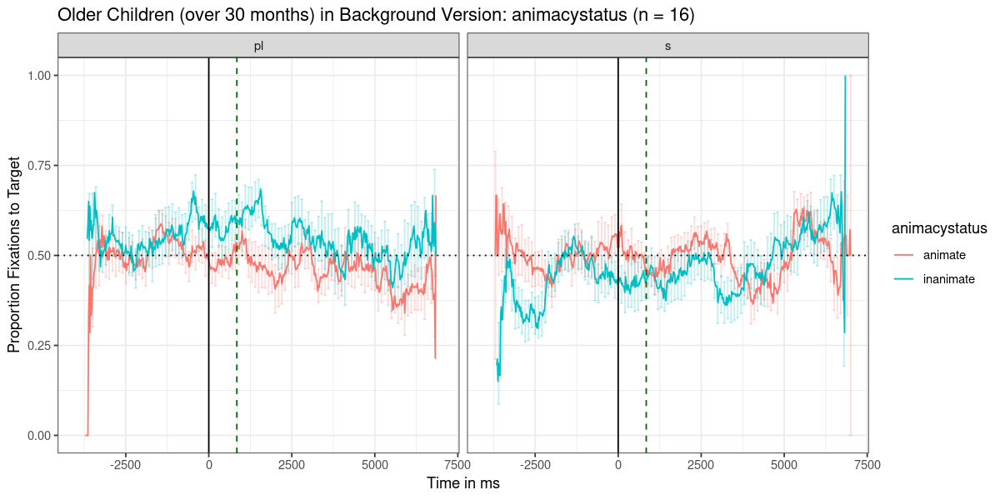

[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_target_~novelty.pdf"


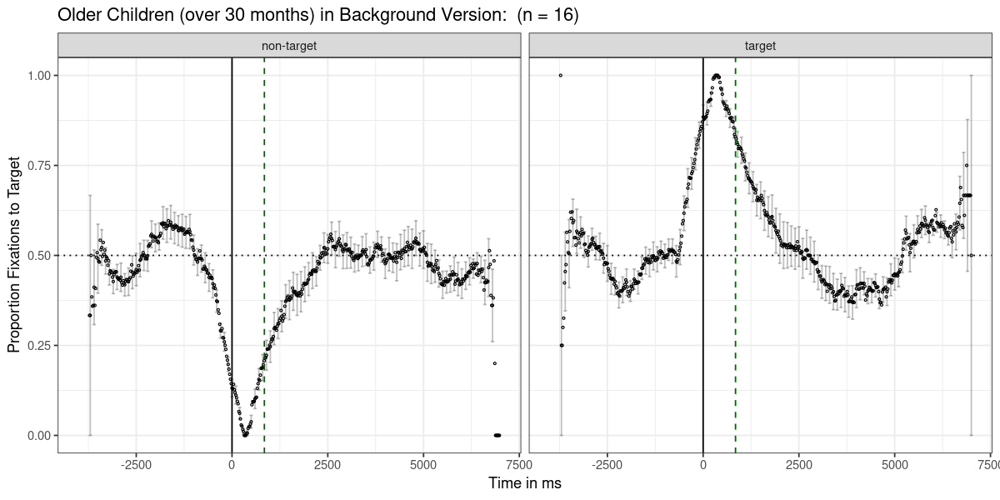

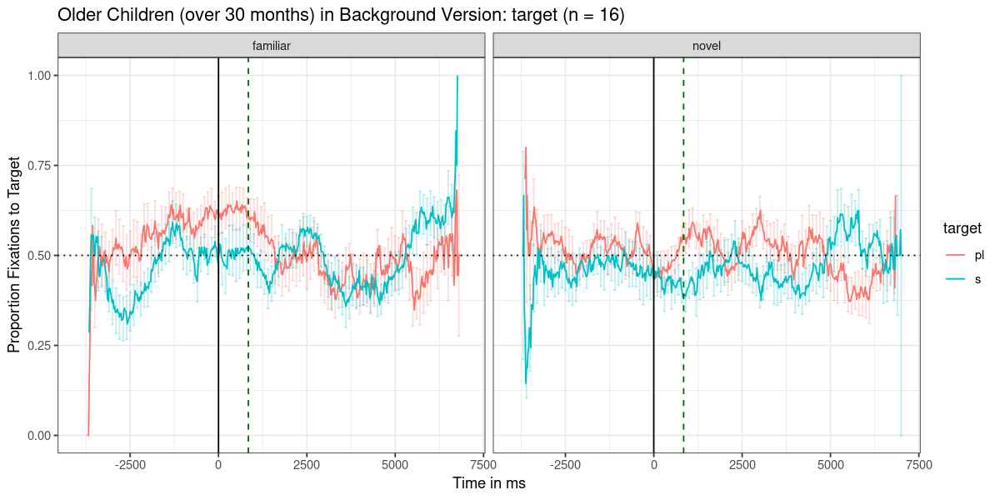

In [112]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'child' & age_in_days >= 915 & expt_version == 'scene'",
    mean_pp_duration = mean_pp_duration, 
    group_title = 'Older Children (over 30 months) in Background Version', save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


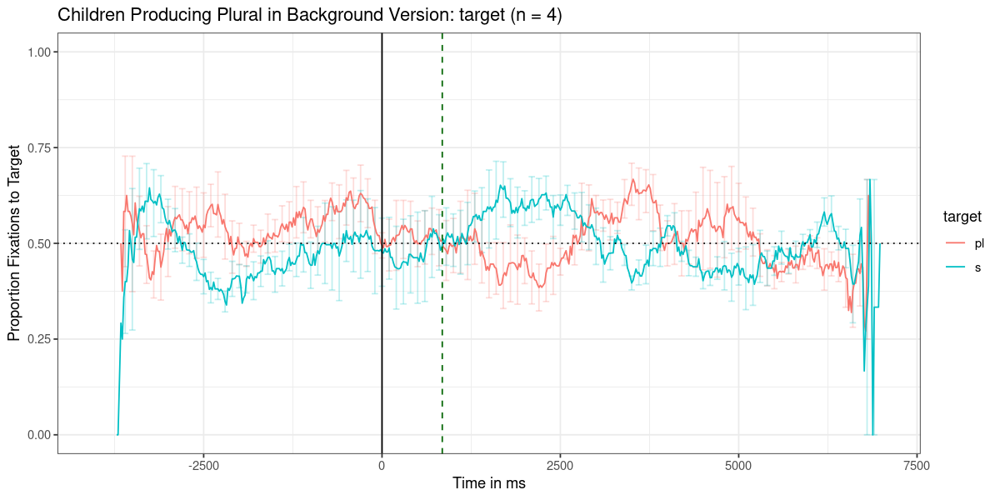

[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


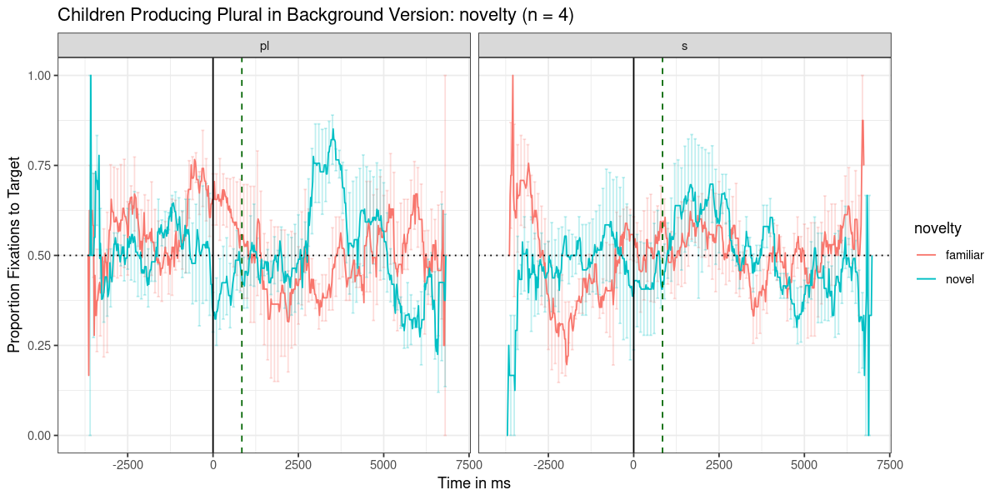

[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_animacystatus_~target.pdf"


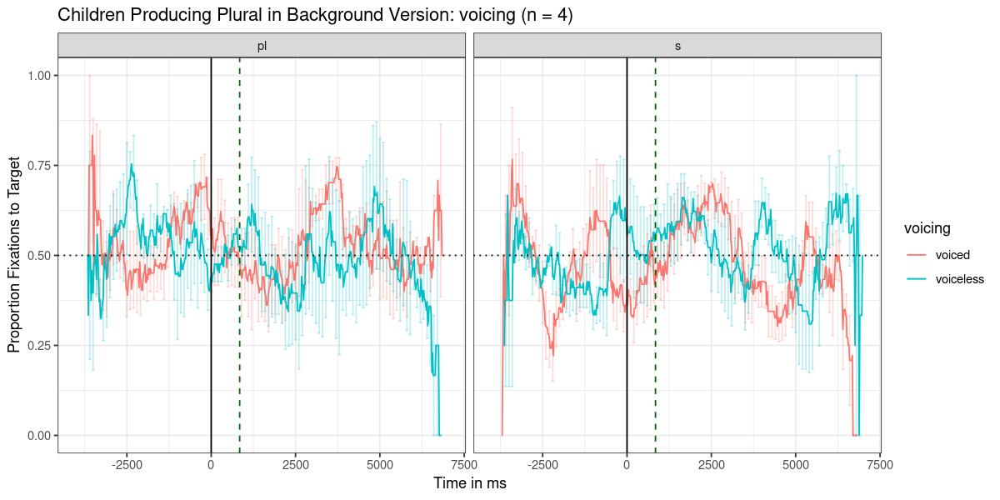

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_nullgroup_~label_at_onset.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


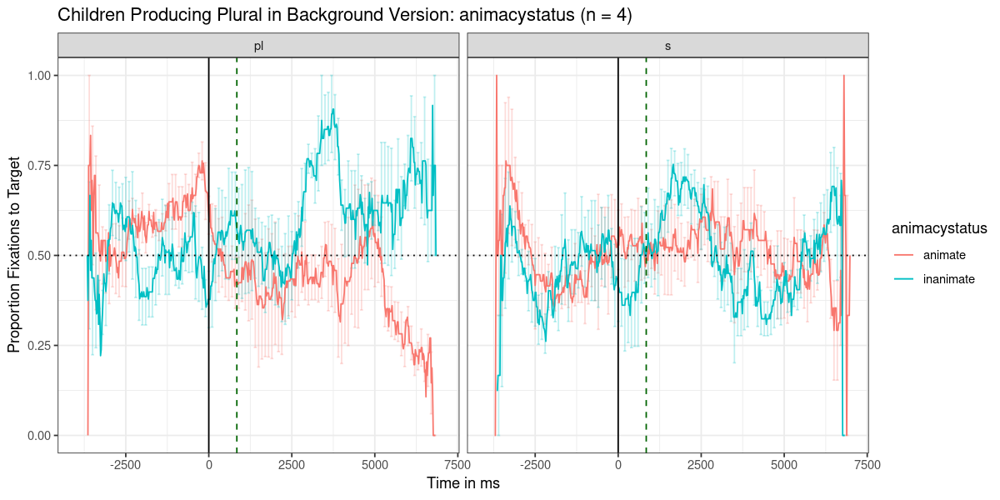

[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_target_~novelty.pdf"


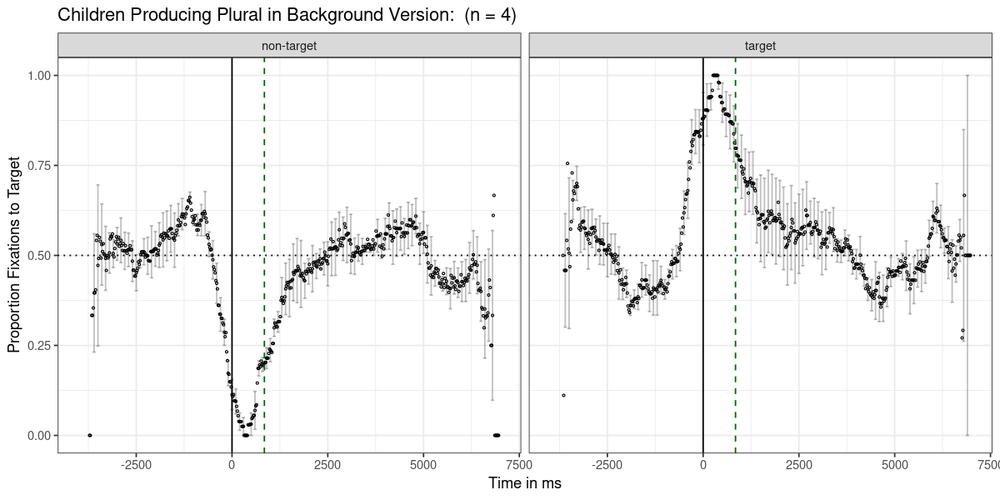

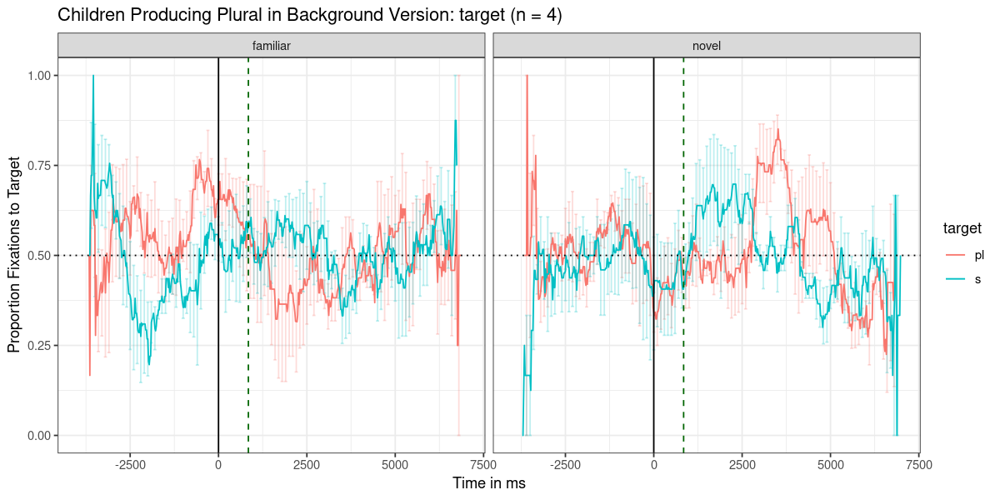

In [113]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'child' & broad_score > .5 & expt_version == 'scene' ",
    mean_pp_duration = mean_pp_duration, 
    group_title = 'Children Producing Plural in Background Version', save_plot=T)

## Red/Blue (Simplified) Version

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='adult'&expt_version=='redblue'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='adult'&expt_version=='redblue'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


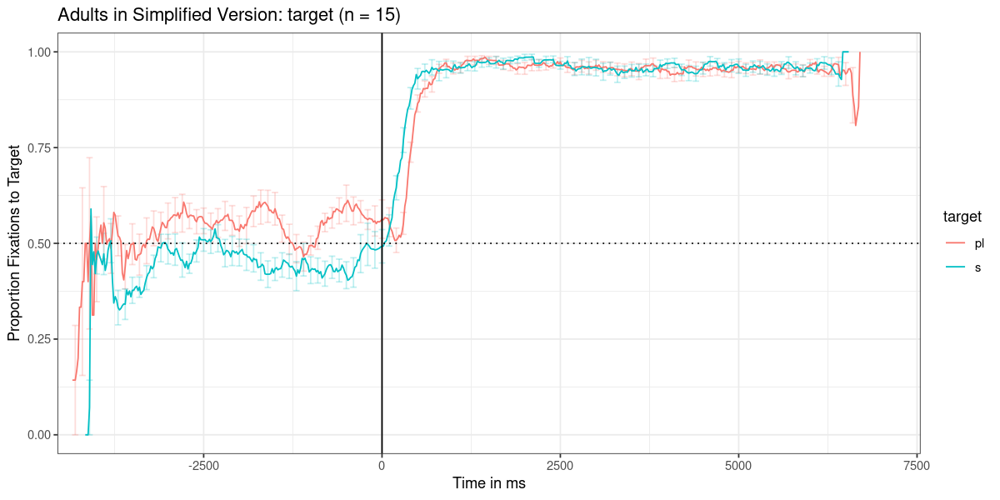

[1] "figures/type=='adult'&expt_version=='redblue'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


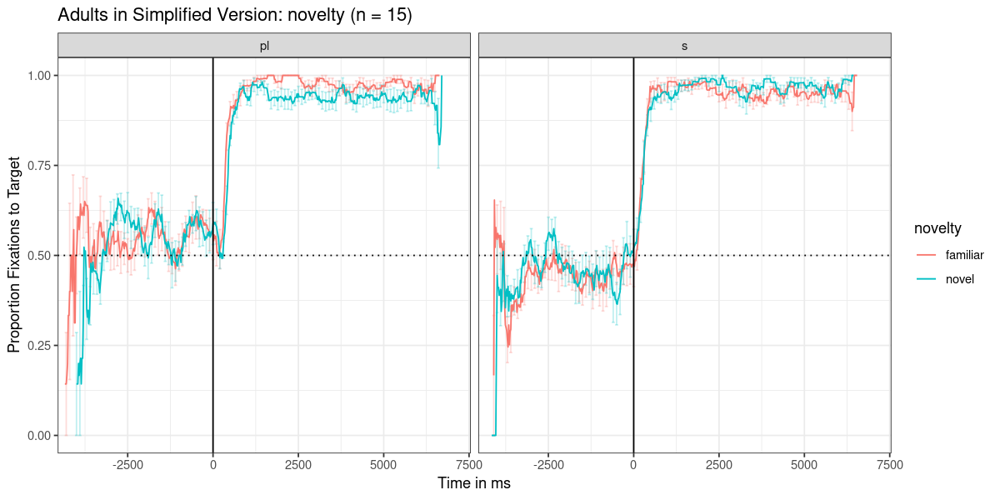

[1] "figures/type=='adult'&expt_version=='redblue'_animacystatus_~target.pdf"


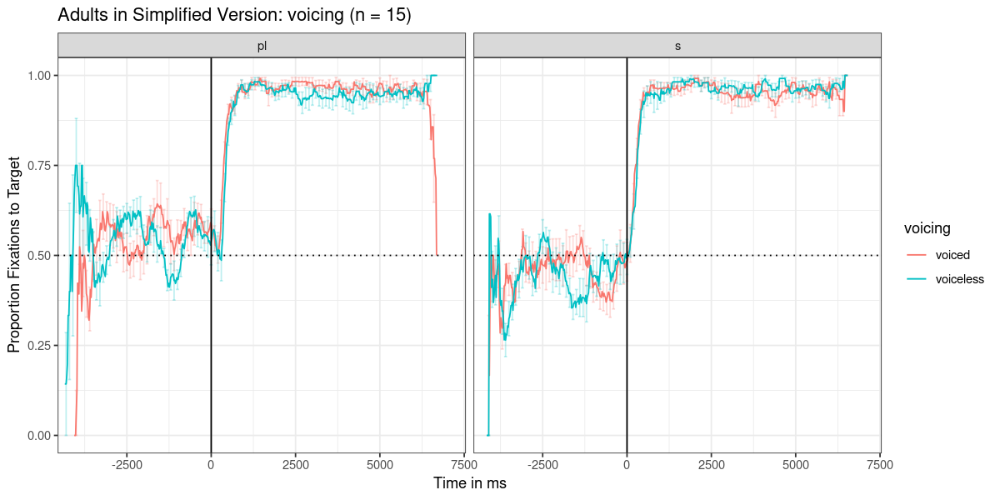

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='adult'&expt_version=='redblue'_nullgroup_~label_at_onset.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


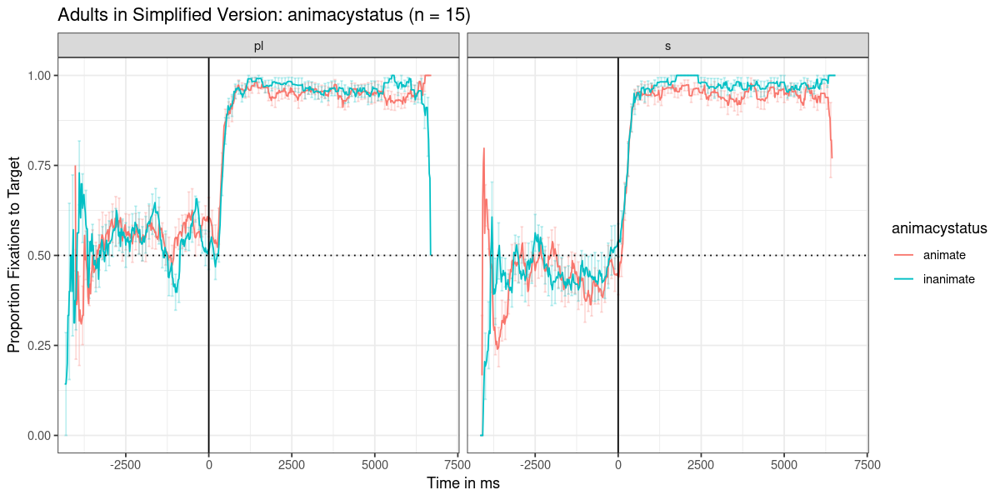

[1] "figures/type=='adult'&expt_version=='redblue'_target_~novelty.pdf"


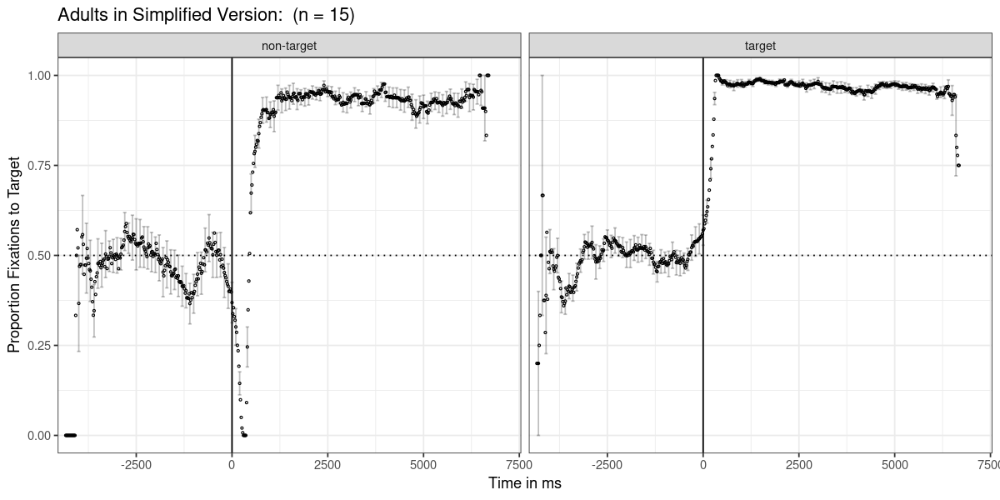

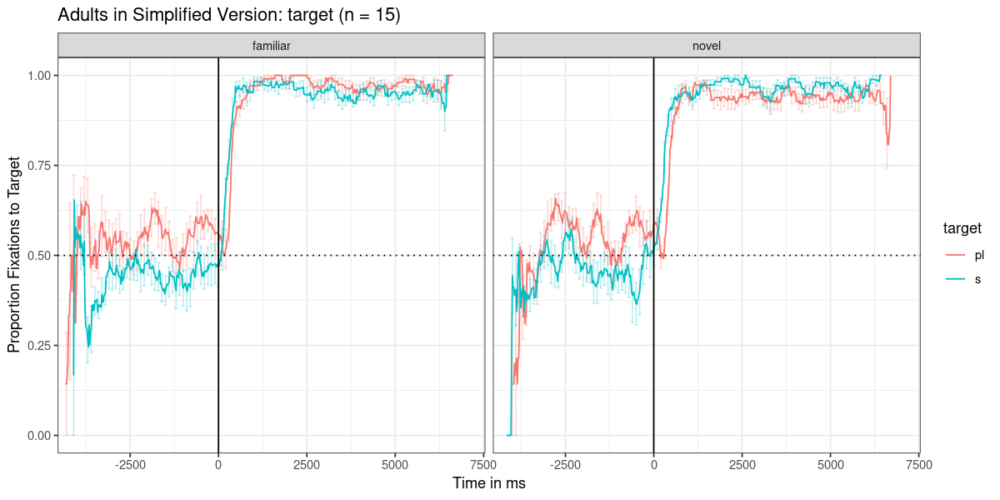

In [114]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'adult' & expt_version == 'redblue'",
    mean_pp_duration = NULL, group_title = 'Adults in Simplified Version', save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='redblue'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='redblue'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


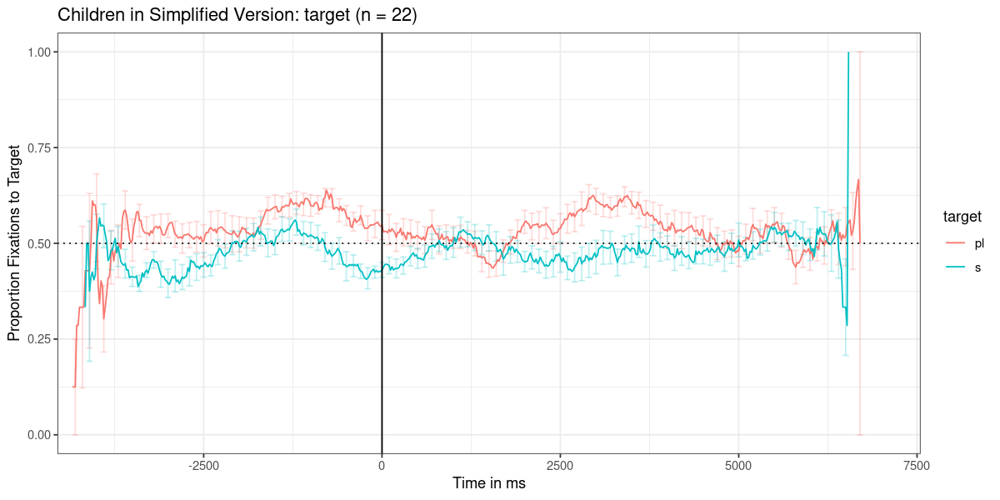

[1] "figures/type=='child'&expt_version=='redblue'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


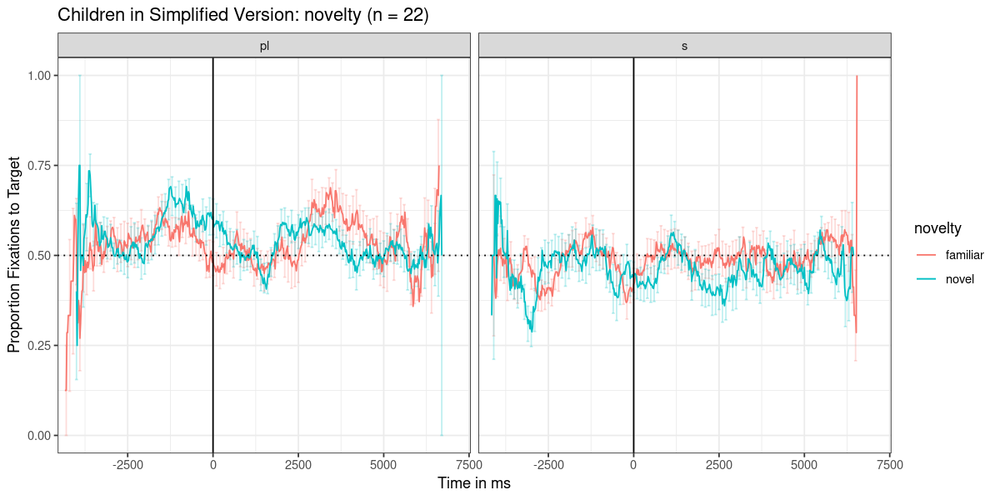

[1] "figures/type=='child'&expt_version=='redblue'_animacystatus_~target.pdf"


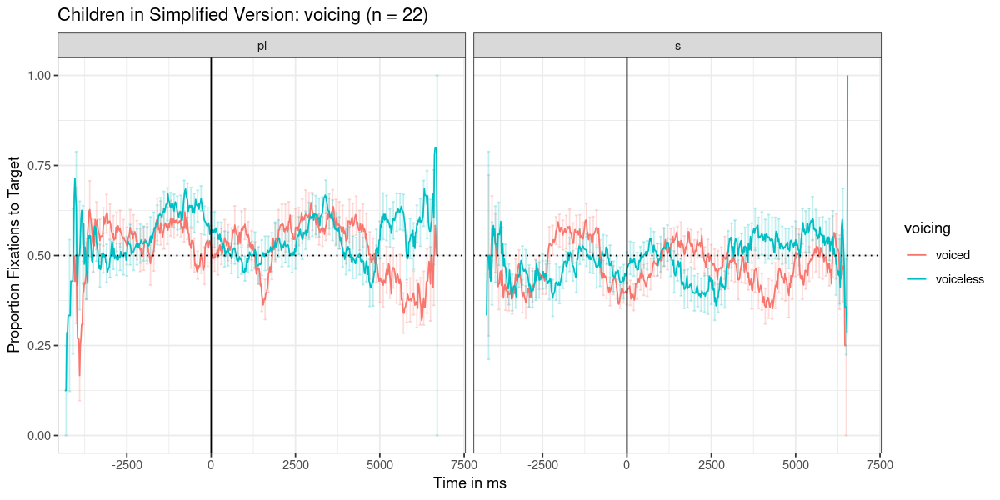

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&expt_version=='redblue'_nullgroup_~label_at_onset.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


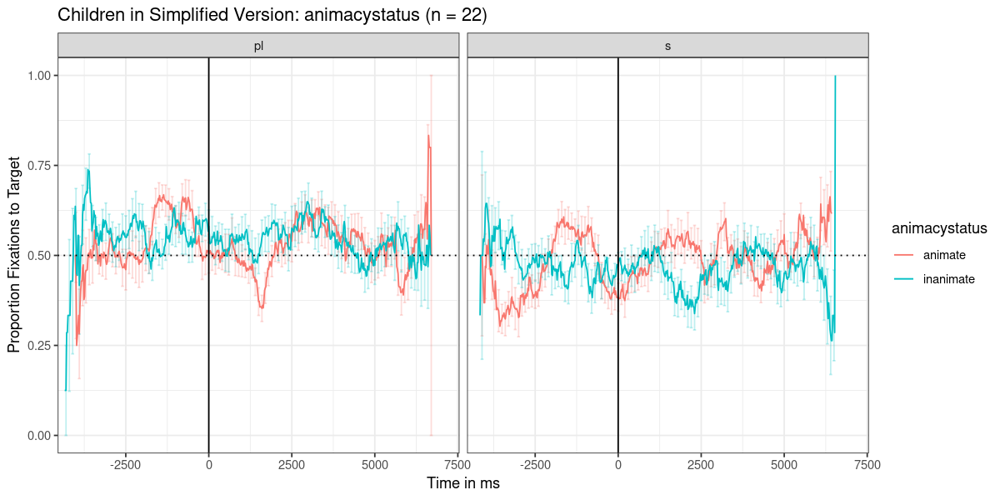

[1] "figures/type=='child'&expt_version=='redblue'_target_~novelty.pdf"


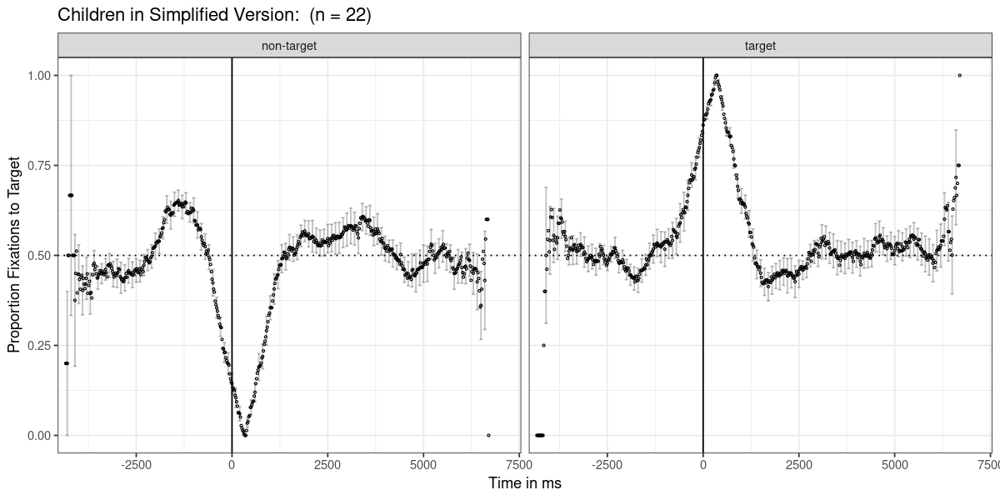

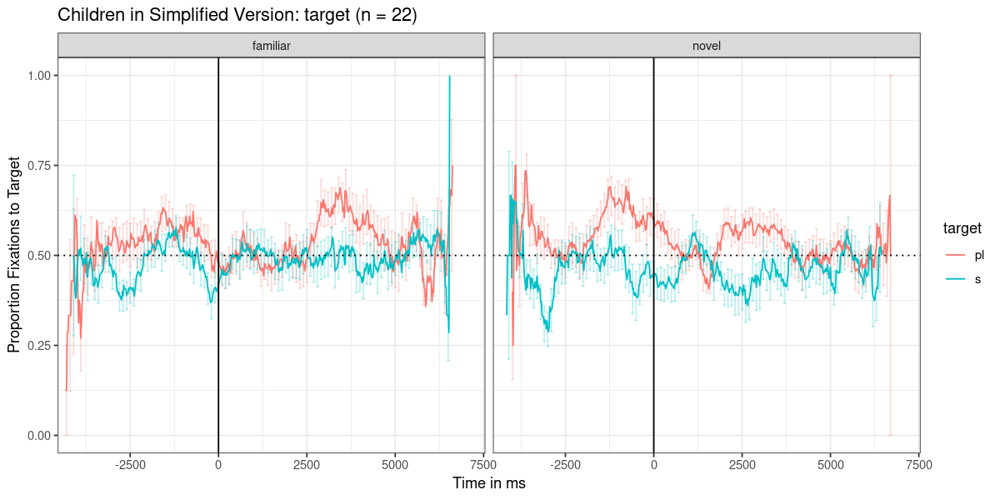

In [115]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'child' & expt_version == 'redblue'",
    mean_pp_duration = NULL, group_title = 'Children in Simplified Version', save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


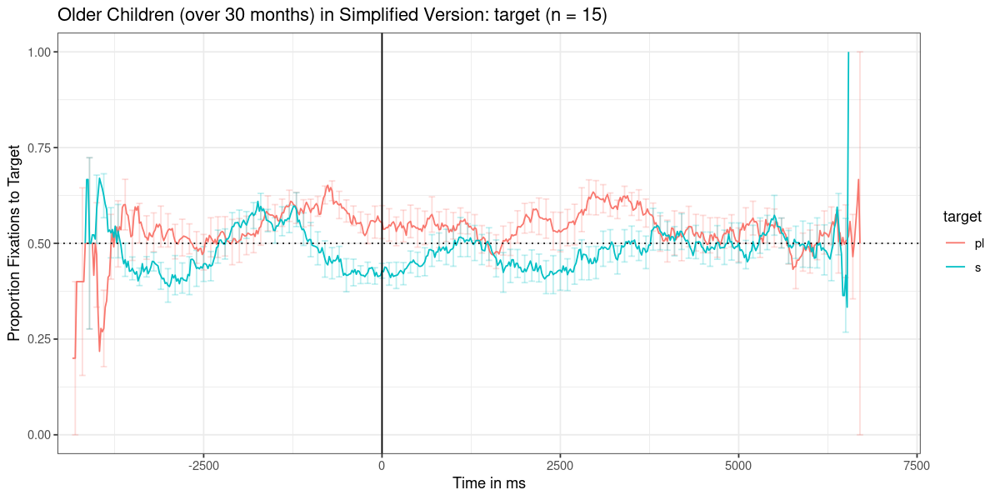

[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


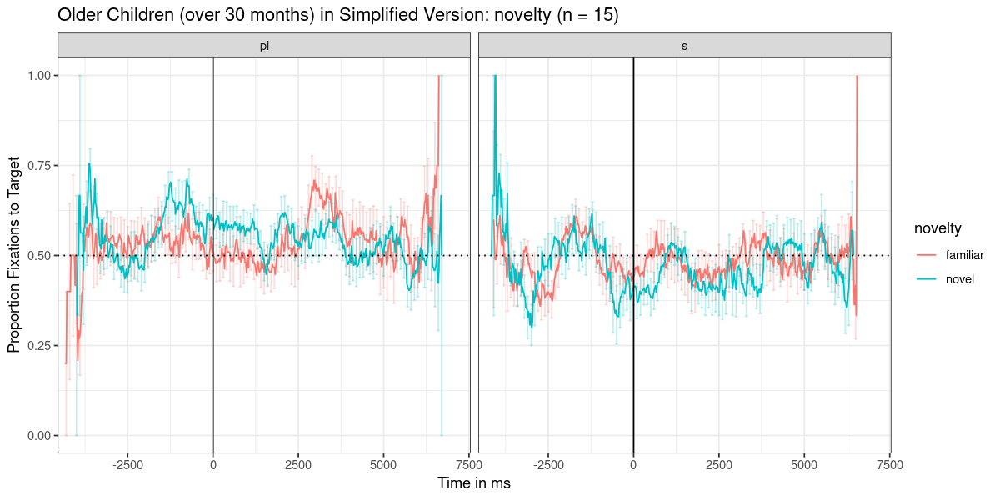

[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_animacystatus_~target.pdf"


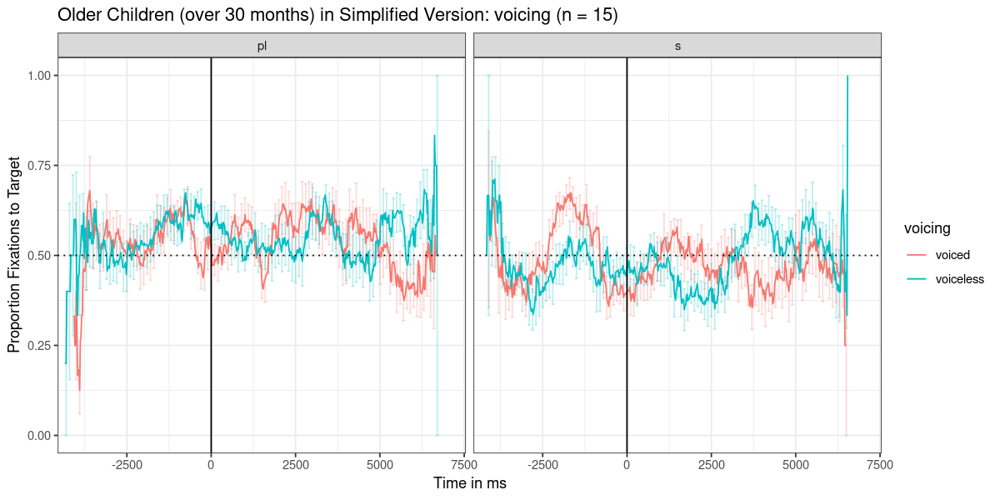

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_nullgroup_~label_at_onset.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


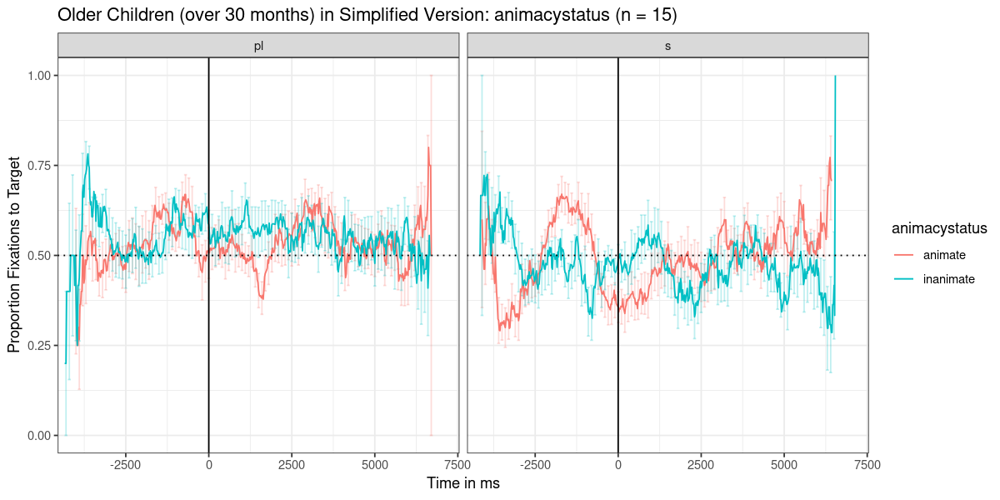

[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_target_~novelty.pdf"


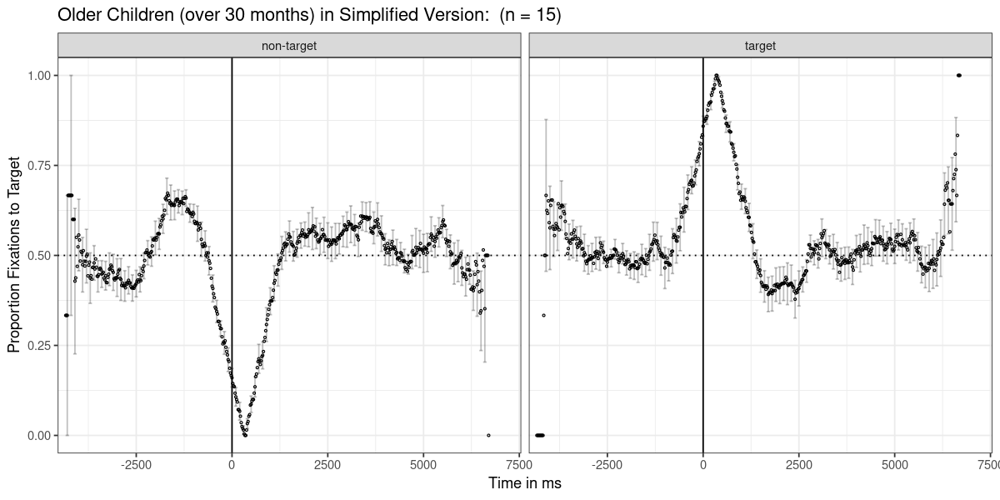

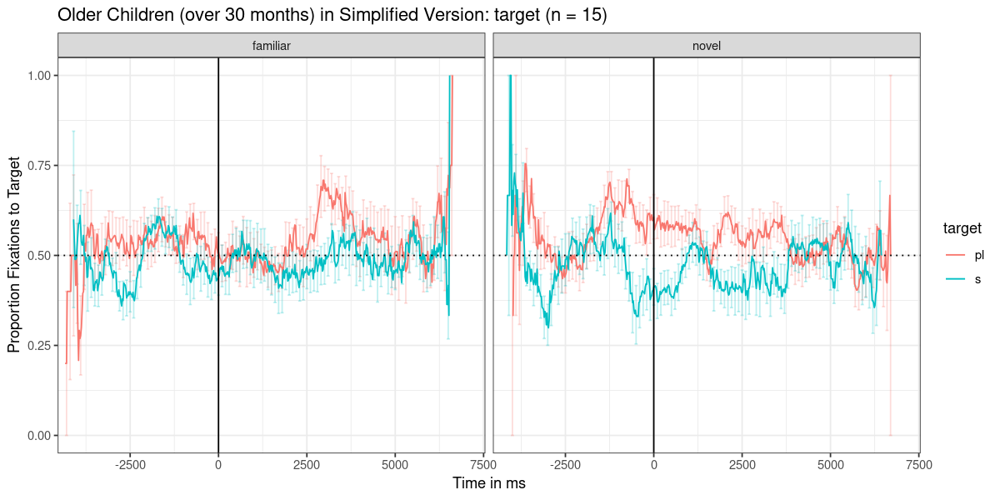

In [116]:
source('PLEARN_analysis_helper.R')
getGroupPlots(ed_df, filter_clause = "type == 'child' & age_in_days >= 915 & expt_version == 'redblue'",
    mean_pp_duration = NULL, 
              group_title = 'Older Children (over 30 months) in Simplified Version',
             save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


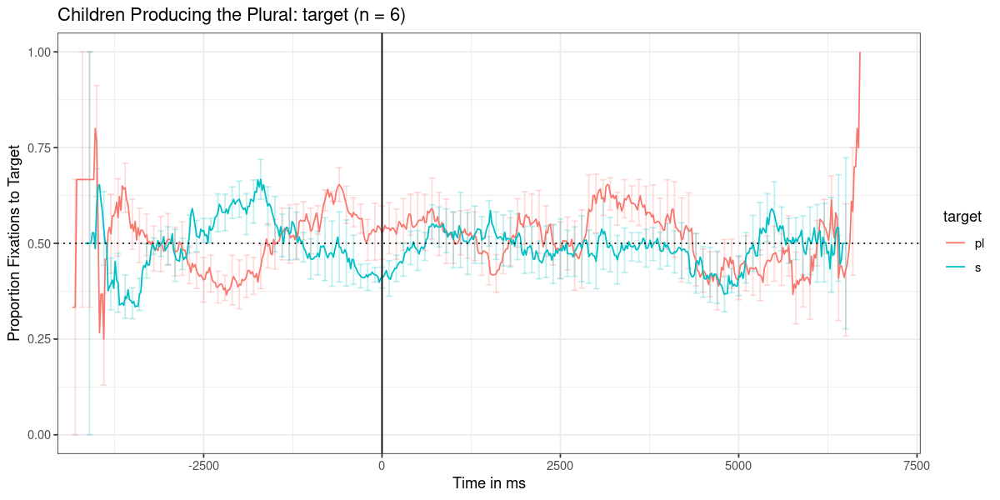

[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


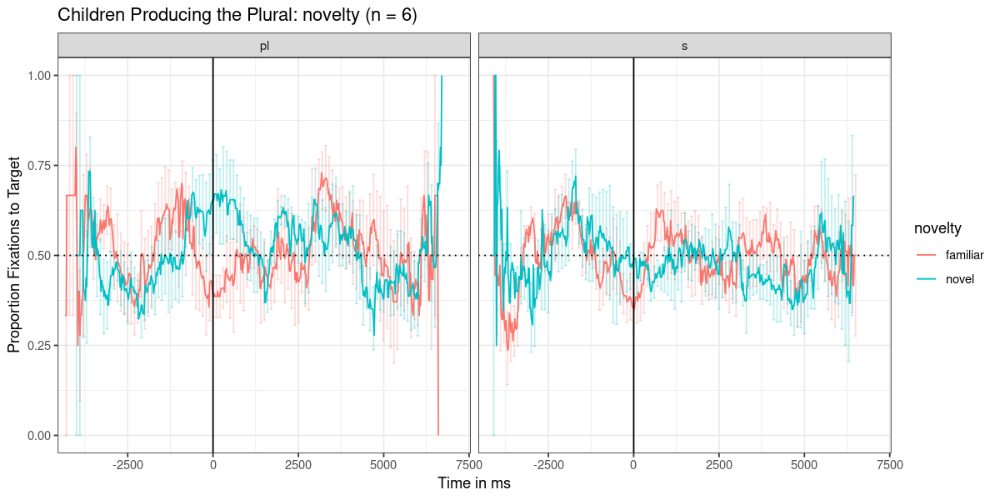

[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_animacystatus_~target.pdf"


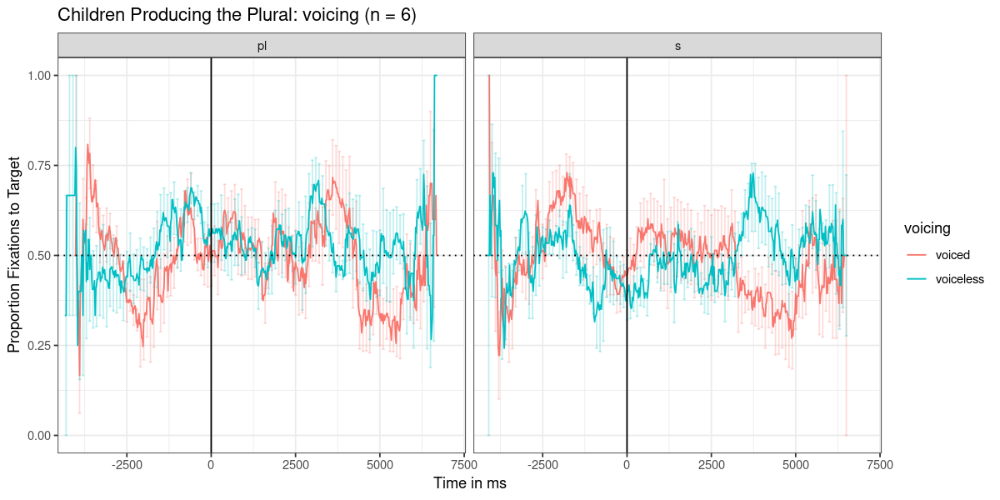

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_nullgroup_~label_at_onset.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


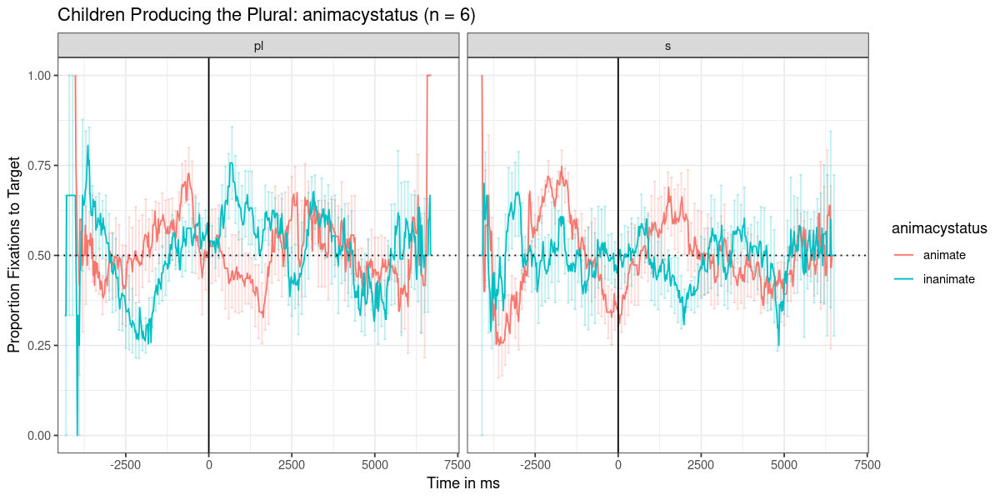

[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_target_~novelty.pdf"


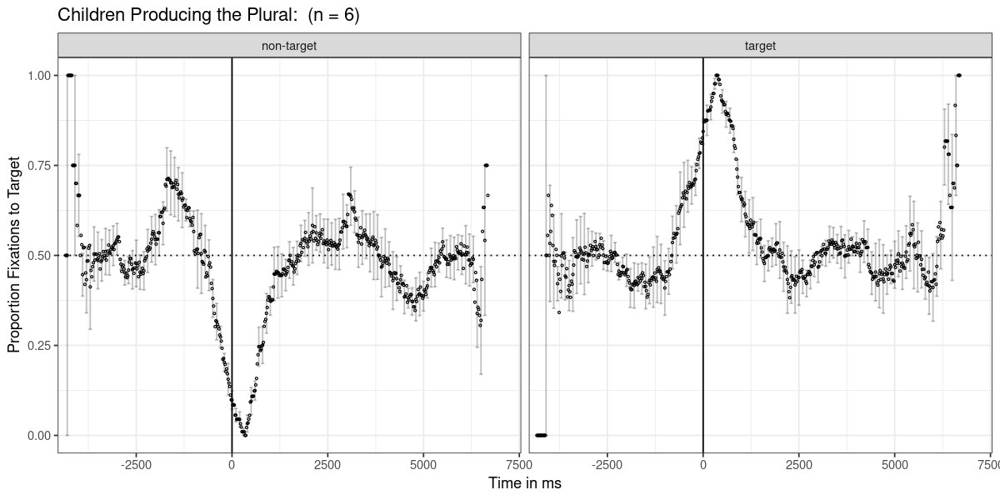

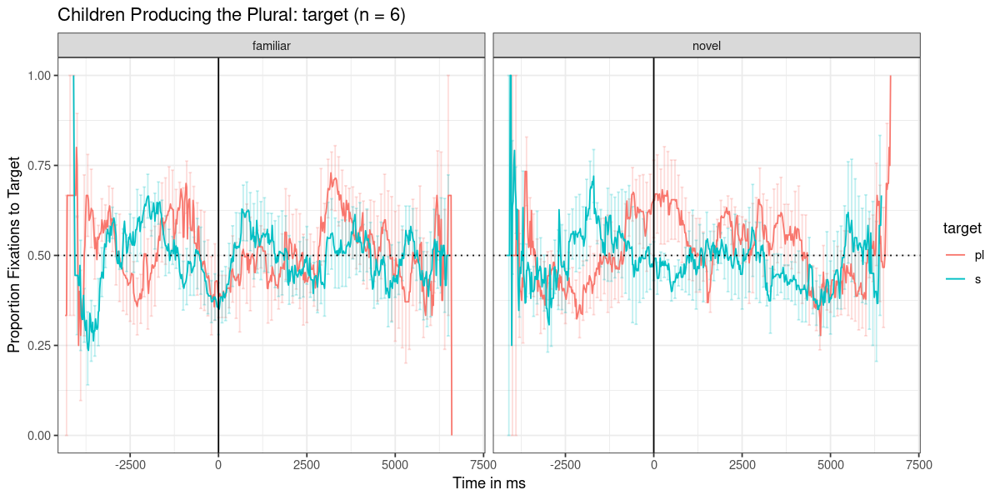

In [117]:
## source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'child' & expt_version == 'redblue' &
broad_score > .5",
    mean_pp_duration = NULL, group_title = 'Children Producing the Plural', save_plot=T)

### Agreement Version

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='agreement'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='agreement'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


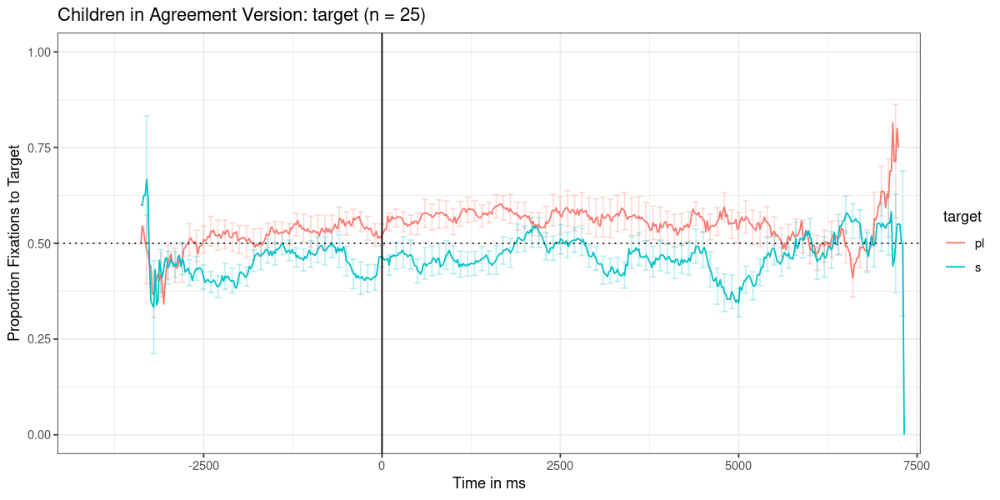

[1] "figures/type=='child'&expt_version=='agreement'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


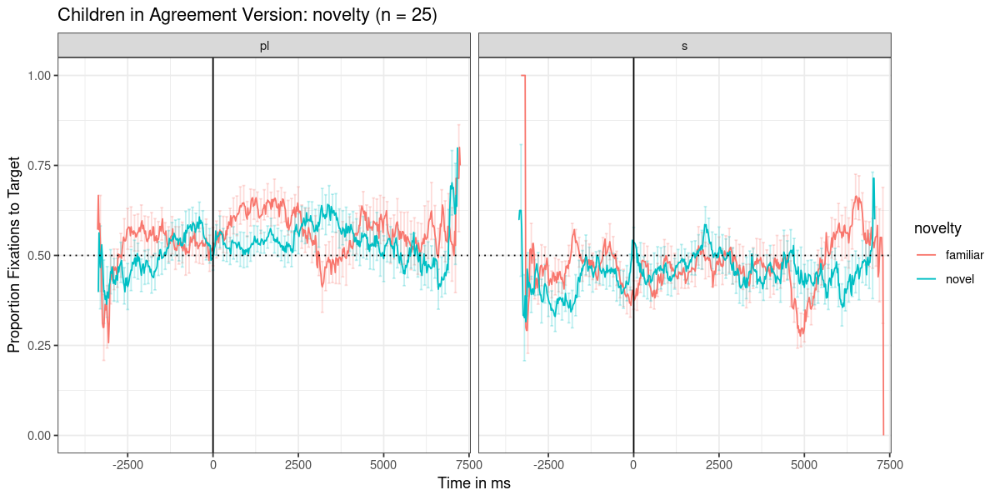

[1] "figures/type=='child'&expt_version=='agreement'_animacystatus_~target.pdf"


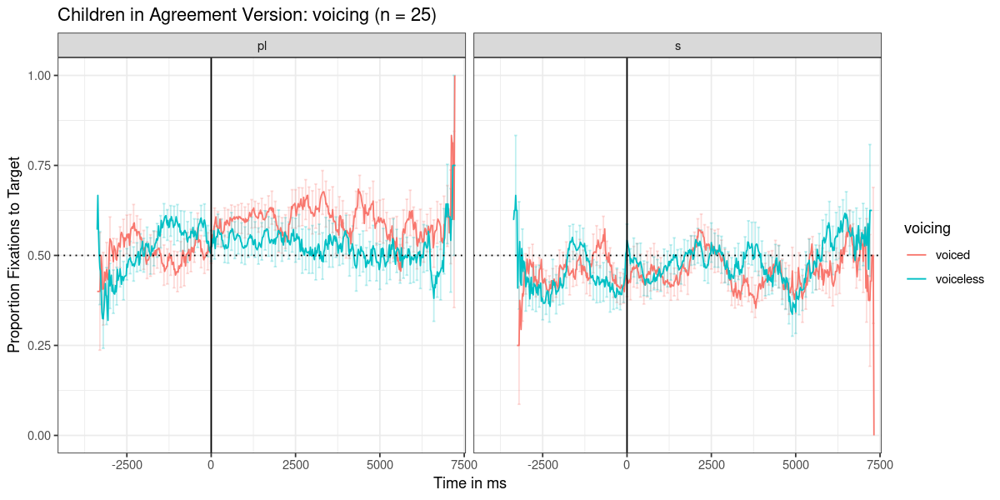

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&expt_version=='agreement'_nullgroup_~label_at_onset.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


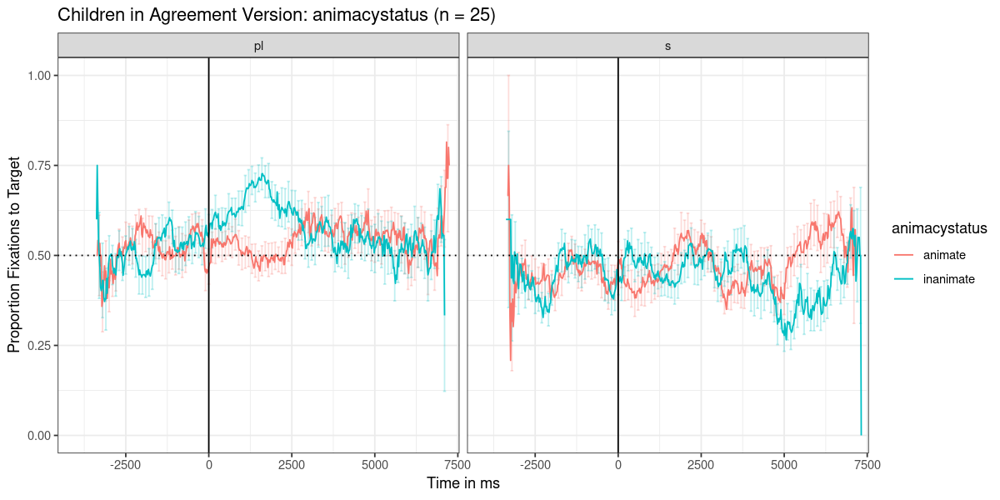

[1] "figures/type=='child'&expt_version=='agreement'_target_~novelty.pdf"


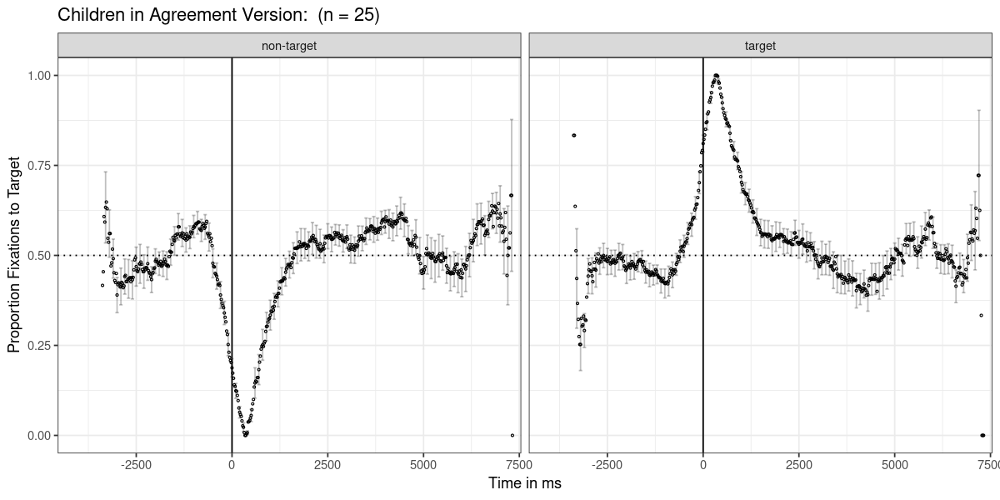

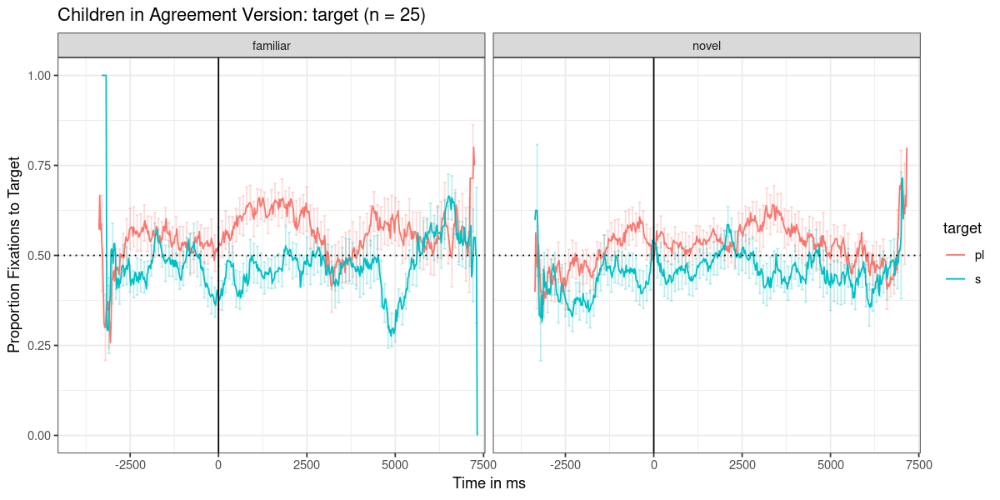

In [118]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'child' & expt_version == 'agreement'",
    mean_pp_duration = NULL, group_title = 'Children in Agreement Version', save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&age_in_days>=915&expt_version=='agreement'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&age_in_days>=915&expt_version=='agreement'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


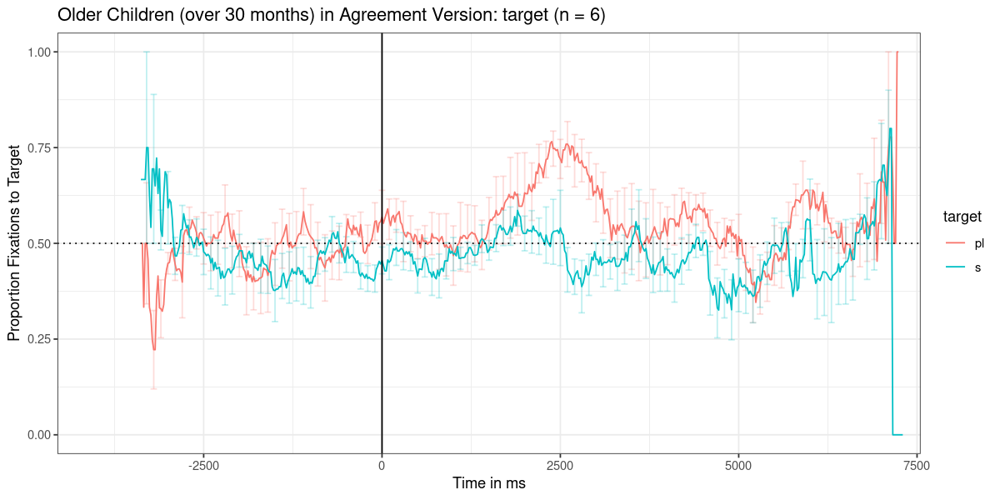

[1] "figures/type=='child'&age_in_days>=915&expt_version=='agreement'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


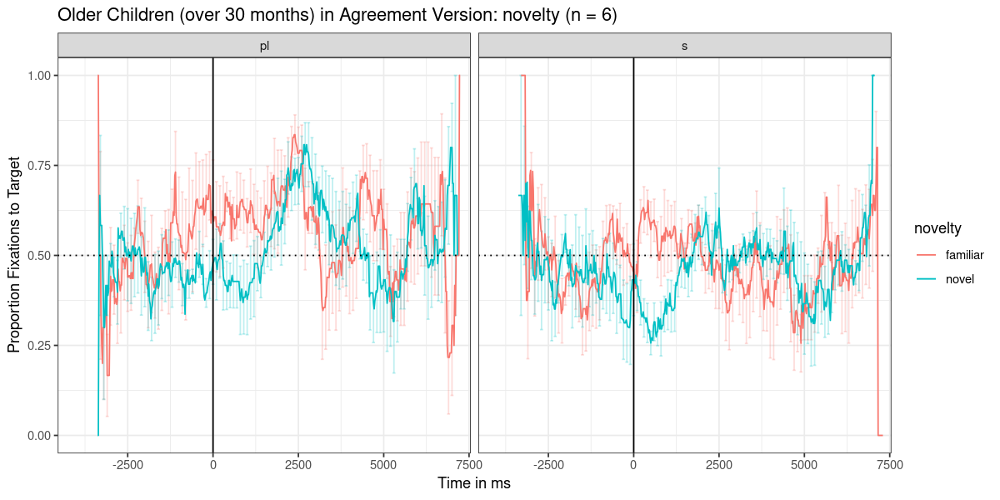

[1] "figures/type=='child'&age_in_days>=915&expt_version=='agreement'_animacystatus_~target.pdf"


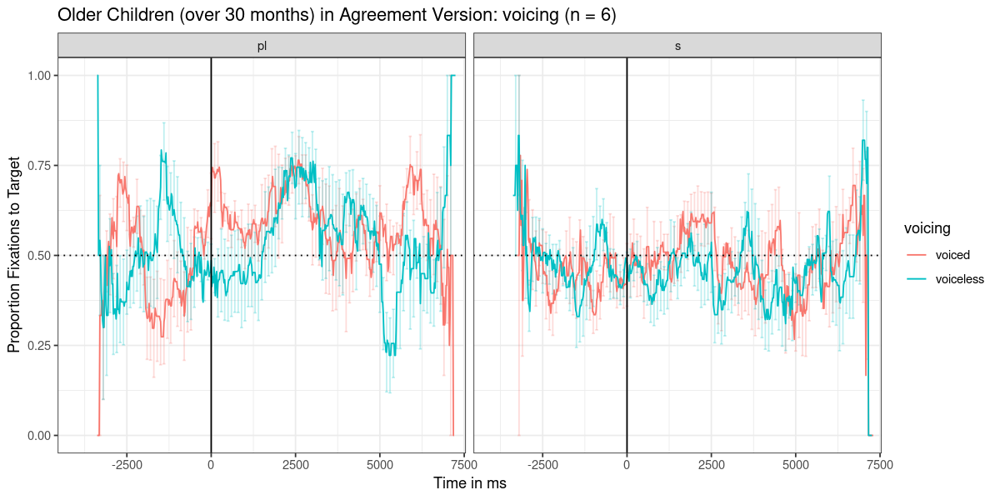

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&age_in_days>=915&expt_version=='agreement'_nullgroup_~label_at_onset.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


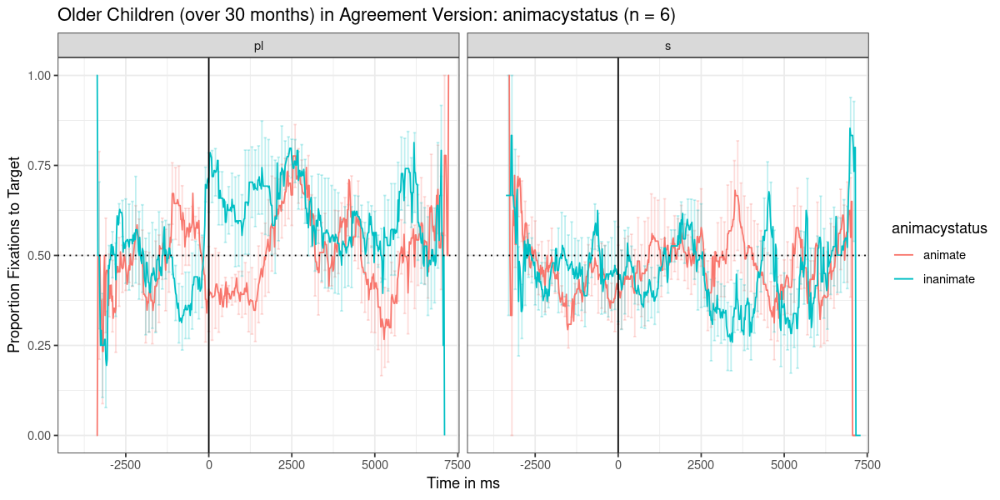

[1] "figures/type=='child'&age_in_days>=915&expt_version=='agreement'_target_~novelty.pdf"


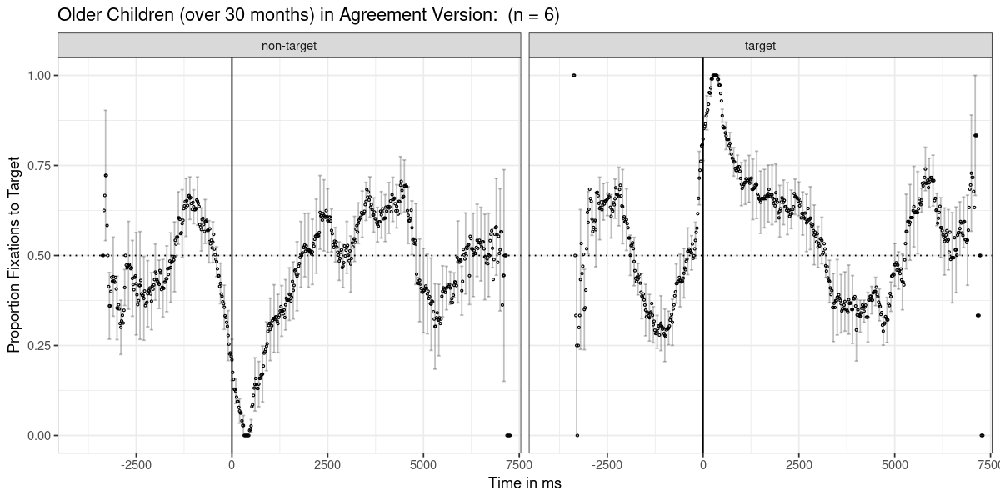

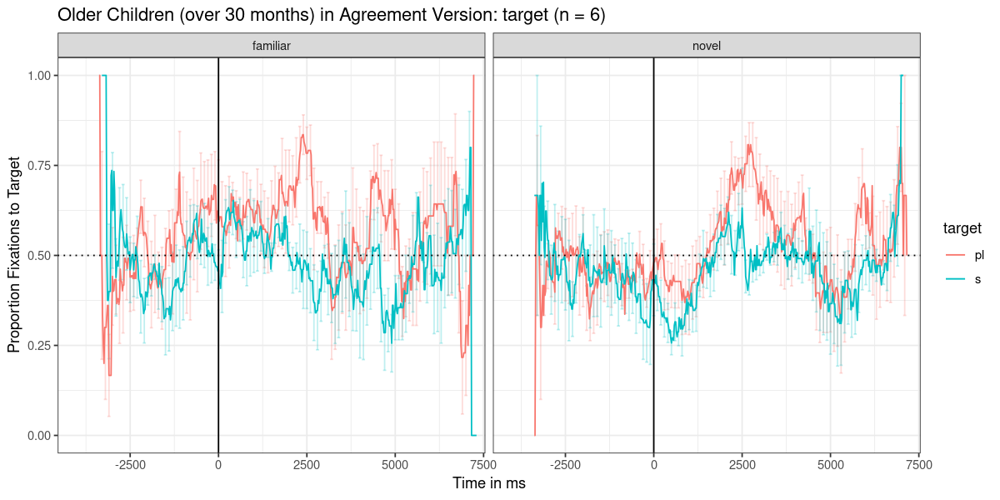

In [119]:
source('PLEARN_analysis_helper.R')
getGroupPlots(ed_df, filter_clause = "type == 'child' & age_in_days >= 915 & expt_version == 'agreement'",
    mean_pp_duration = NULL, 
              group_title = 'Older Children (over 30 months) in Agreement Version',
             save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='agreement'&\nbroad_score>.5_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='agreement'&\nbroad_score>.5_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


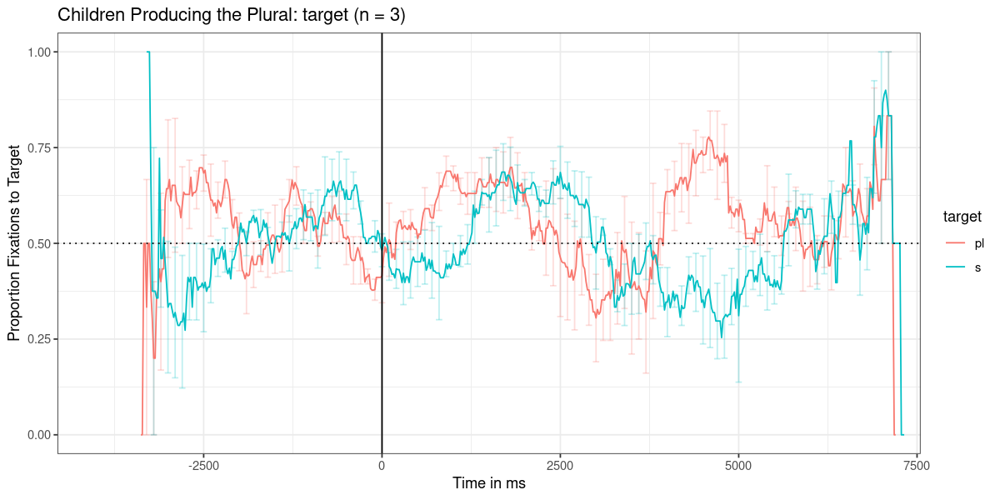

[1] "figures/type=='child'&expt_version=='agreement'&\nbroad_score>.5_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


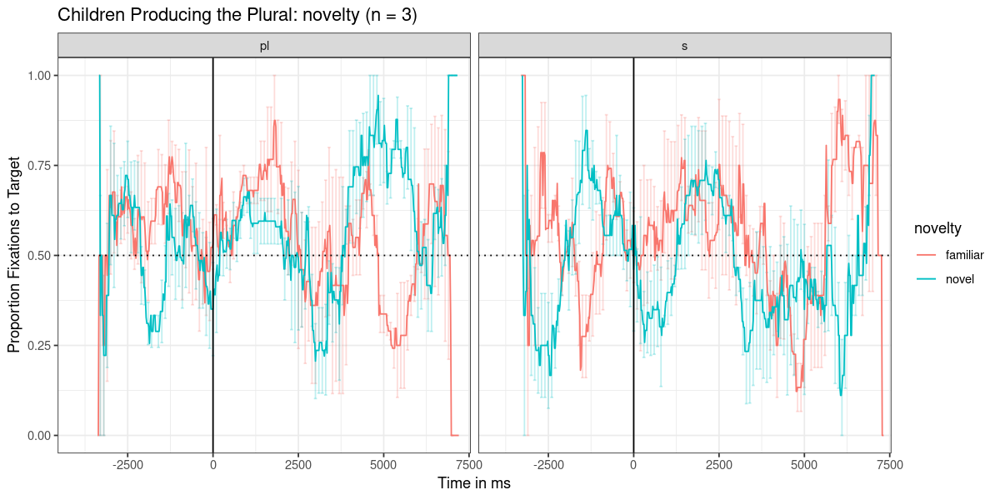

[1] "figures/type=='child'&expt_version=='agreement'&\nbroad_score>.5_animacystatus_~target.pdf"


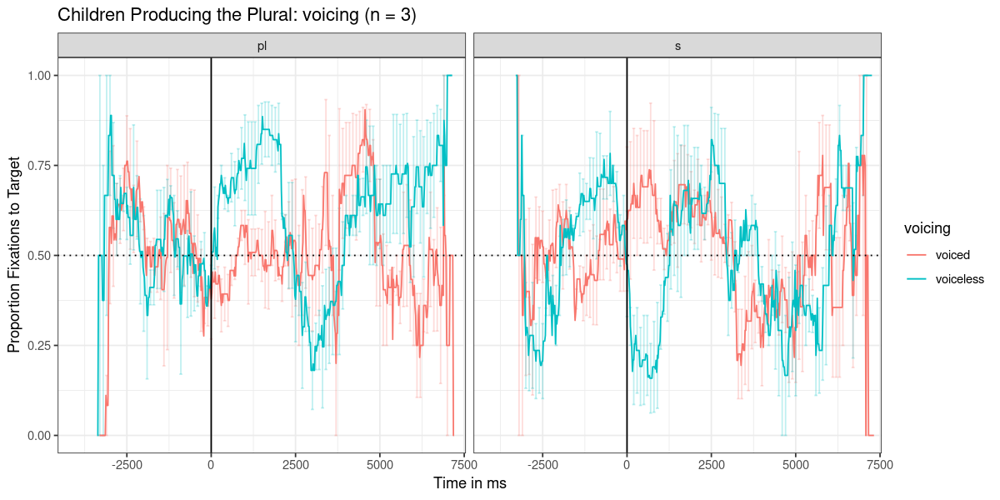

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&expt_version=='agreement'&\nbroad_score>.5_nullgroup_~label_at_onset.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


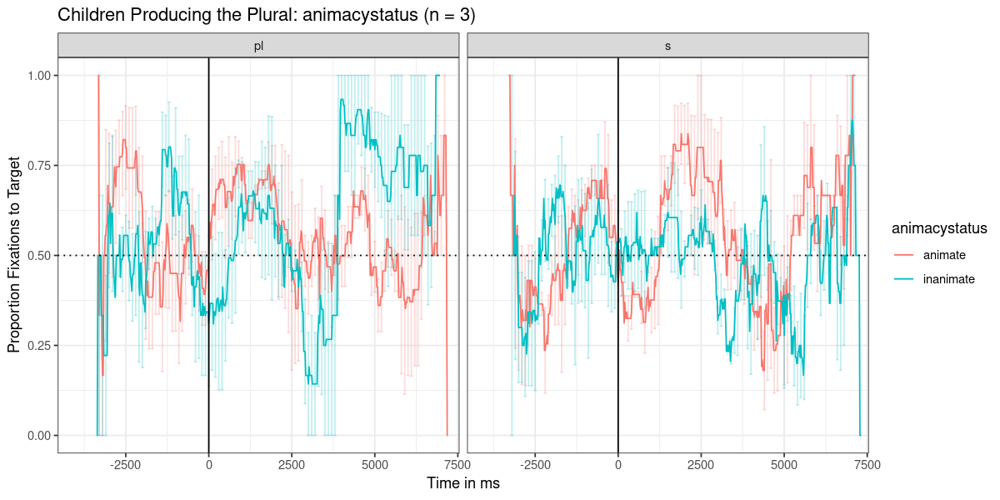

[1] "figures/type=='child'&expt_version=='agreement'&\nbroad_score>.5_target_~novelty.pdf"


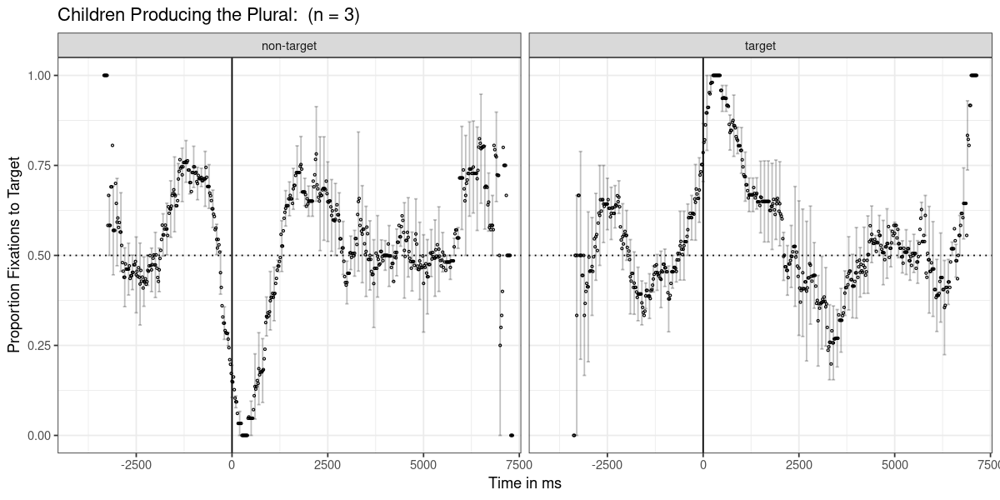

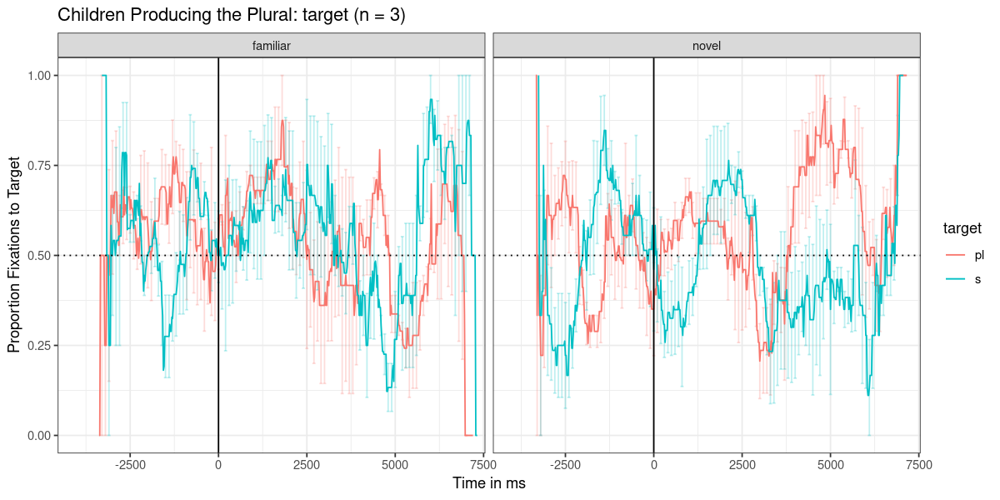

In [120]:
## source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'child' & expt_version == 'agreement' &
broad_score > .5",
    mean_pp_duration = NULL, group_title = 'Children Producing the Plural', save_plot=T)

# Comparison Between Experiments

[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + expt_version + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='adult'_expt_version_~target.pdf"


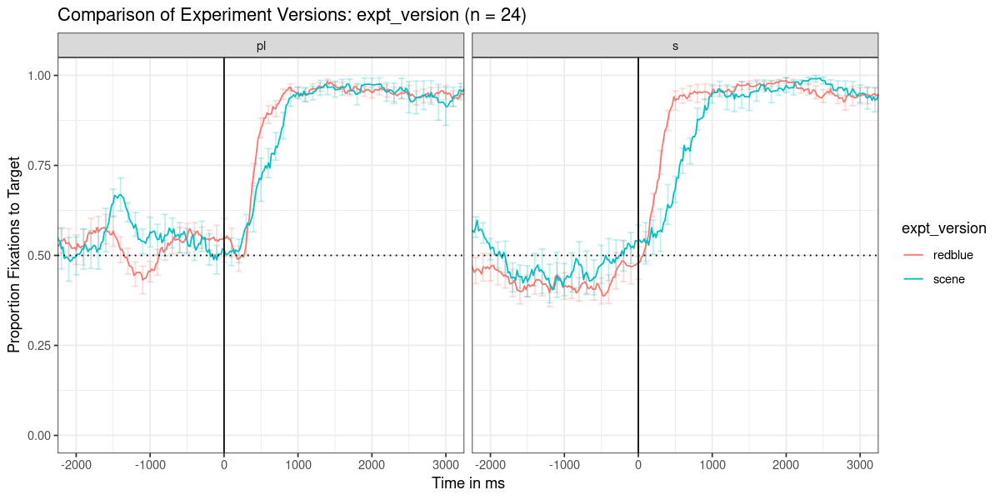

In [121]:
getGroupPlot(ed_df, 
        grouping_var = 'expt_version',
        filter_clause = "type == 'adult'",             
        facet_clause = '~ target',
        facet_type = 'wrap',
        loessSpan=.2, 
        x_start = -2000,
        x_end = 3000,
        mean_pp_duration= NULL,
        delay_ms= 367, 
        group_title = "Comparison of Experiment Versions",
        save_plot=T)

[1] "facet clause:"
[1] "~ expt_version"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + expt_version"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='adult'_target_~expt_version.pdf"


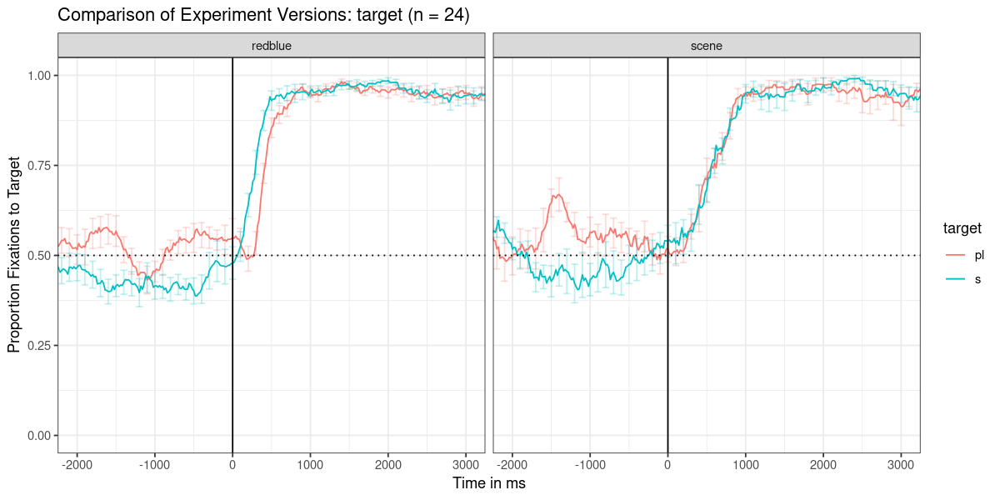

In [122]:
getGroupPlot(ed_df, 
        grouping_var = 'target',
        filter_clause = "type == 'adult'",             
        facet_clause = '~ expt_version',
        facet_type = 'wrap',
        loessSpan=.2, 
        x_start = -2000,
        x_end = 3000,
        mean_pp_duration= NULL,
        delay_ms= 367, 
        group_title = "Comparison of Experiment Versions",
        save_plot=T)

In [123]:
ed_df$expt_version = as.character(ed_df$expt_version)
ed_df$expt_version[is.na(ed_df$expt_version)] = 'agreement'
ed_df$expt_version = factor(ed_df$expt_version)

[1] "facet clause:"
[1] "~ expt_version"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + expt_version"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'_target_~expt_version.pdf"


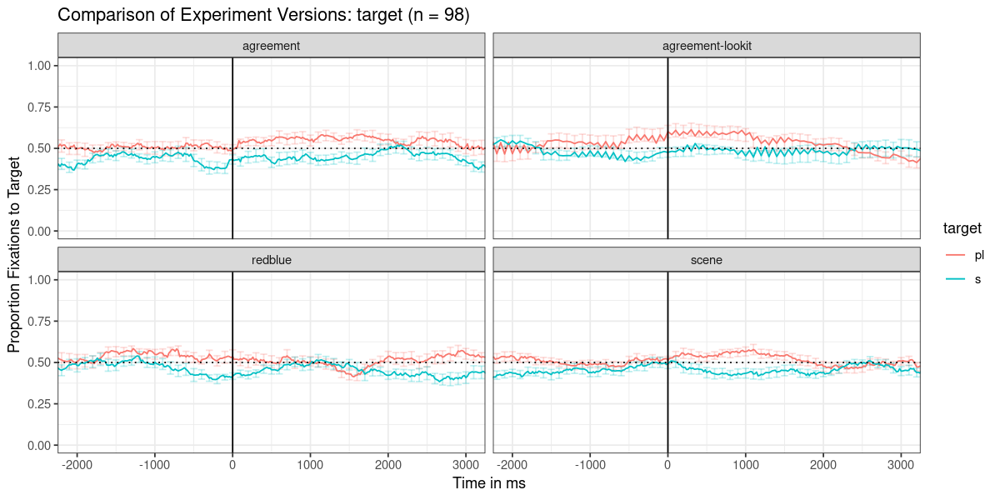

In [124]:
getGroupPlot(ed_df, 
        grouping_var = 'target',
        filter_clause = "type == 'child'",             
        facet_clause = '~ expt_version',
        facet_type = 'wrap',
        loessSpan=.2, 
        x_start = -2000,
        x_end = 3000,
        mean_pp_duration= NULL,
        delay_ms= 367, 
        group_title = "Comparison of Experiment Versions",
        save_plot=T)

[1] "facet clause:"
[1] "~ expt_version"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + type + expt_version"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/_target_~expt_version.pdf"


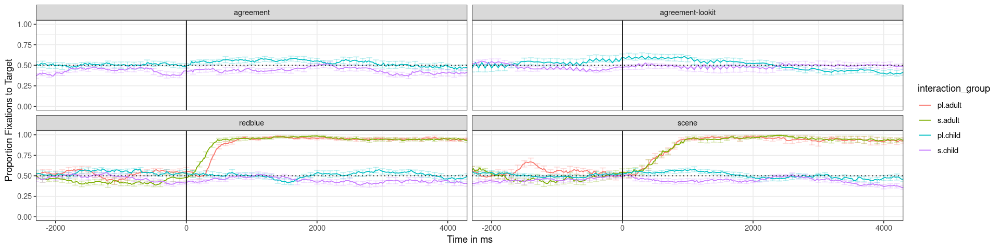

In [125]:
source('PLEARN_analysis_helper.R')
getGroupPlot(ed_df, 
        grouping_var = 'target',
        linetype_var = 'type',
        facet_clause = '~ expt_version',
        facet_type = 'wrap',
        loessSpan=.2, 
        x_start = -2000,
        x_end = 4000,
        mean_pp_duration= NULL,
        delay_ms= 367, 
        group_title = NULL,
        save_plot=T,
        plot_size = c(16,4))

In [126]:
length(unique(subset(ed_df, type == 'child' & expt_version == 'redblue')$participant_name))
length(unique(subset(ed_df, type == 'child' & expt_version == 'scene')$participant_name))
length(unique(subset(ed_df, type == 'child' & expt_version == 'agreement')$participant_name))

[1] 22

[1] 29

[1] 26

In [127]:
names(ed_df)

[1] "participant_name"                "filename"                       
 [3] "expt_version"                    "type"                           
 [5] "expt_index"                      "timeBin"                        
 [7] "FixationID"                      "CURRENT_FIX_START"              
 [9] "CURRENT_FIX_END"                 "TRIAL_INDEX"                    
[11] "CURRENT_FIX_INDEX"               "RECORDING_SESSION_LABEL"        
[13] "CURRENT_FIX_INTEREST_AREA_LABEL" "RT"                             
[15] "target"                          "s_form"                         
[17] "novelty"                         "animacystatus"                  
[19] "voicing"                         "practice"                       
[21] "Time"                            "Nonset"                         
[23] "looks_to_t"                      "looks_to_d"                     
[25] "looks_to_td"                     "exclude_trial"                  
[27] "exclude_subject"                 "label_at_onset"                 
[29] "time_to_last_nonna"              "track_loss_at_0"                
[31] "session_id"                      "AudioTarget"                    
[33] "ms"                              "original_frame_index"           
[35] "frame_index"                     "label"                          
[37] "trial"                           "start_time_ms"                  
[39] "normalized_ms"                   "frame_id"                       
[41] "seconds_recording_before_stim"   "order.x"                        
[43] "normal_or_calibration"           "novel_id"                       
[45] "background_context"              "vowel_carrier"                  
[47] "full_carrier"                    "s_carrier"                      
[49] "s_punct"                         "s_wav_index"                    
[51] "s_sentence"                      "pl_form"                        
[53] "pl_carrier"                      "pl_punct"                       
[55] "pl_wav_index"                    "pl_sentence"                    
[57] "simple_pl_stim"                  "simple_s_stim"                  
[59] "animacyStatus"                   "Trial"                          
[61] "Practice"                        "test_index"                     
[63] "TargetSide"                      "trial_index"                    
[65] "NovelColor"                      "order.y"                        
[67] "TargetLoc"                       "DistractorLoc"                  
[69] "TargetImage"                     "DistractorImage"                
[71] "disambig_time"                   "TimeBin"                        
[73] "cfial_bin"                       "index"                          
[75] "id"                              "include_eyetracking"            
[77] "include_storybook"               "age_in_days"                    
[79] "gender"                          "group"                          
[81] "order"                           "comment"                        
[83] "main_coder"                      "main_validated"                 
[85] "double_coder"                    "double_validated"               
[87] "comments"                        "trial_order"                    
[89] "age_in_months"                   "ran_participant"                
[91] "in_study"                        "broad_score"                    
[93] "narrow_score"                    "name_trial"                     
[95] "first3"

[1] "facet clause:"
[1] "~ expt_version"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + type + expt_version"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/_target_~expt_version.pdf"


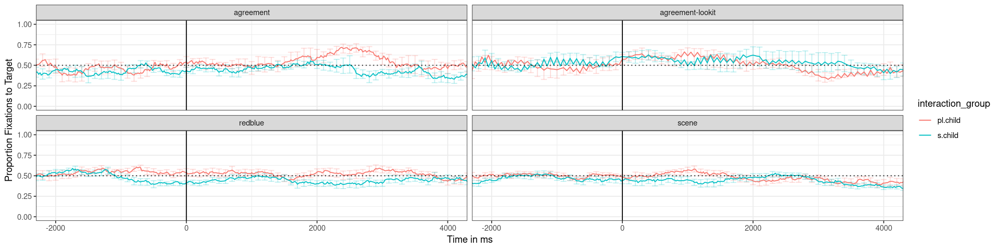

In [128]:
source('PLEARN_analysis_helper.R')
getGroupPlot(subset(ed_df, type == 'child' &
                   age_in_days > 30 * 30.5), 
        grouping_var = 'target',
        linetype_var = 'type',
        facet_clause = '~ expt_version',
        facet_type = 'wrap',
        loessSpan=.2, 
        x_start = -2000,
        x_end = 4000,
        mean_pp_duration= NULL,
        delay_ms= 367,  
        group_title = NULL,
        save_plot=T,
        plot_size = c(16,4))

[1] "facet clause:"
[1] "~ expt_version"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + type + expt_version"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/_target_~expt_version.pdf"


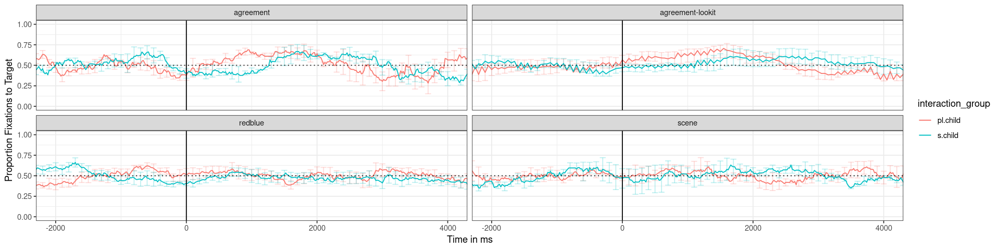

In [129]:
source('PLEARN_analysis_helper.R')
excludes = c('pl03','pl24','pl16')
getGroupPlot(subset(ed_df, type == 'child' &
                   broad_score > .5 & !(participant_name %in% excludes)) , 
        grouping_var = 'target',
        linetype_var = 'type',
        facet_clause = '~ expt_version',
        facet_type = 'wrap',
        loessSpan=.2, 
        x_start = -2000,
        x_end = 4000,
        mean_pp_duration= NULL,
        delay_ms= 367,  
        group_title = NULL,
        save_plot=T,
        plot_size = c(16,4))

In [130]:
#>> figure out why proportion fixations to target are so low.
# probably something different about exclusions in lookit


# Trial Level Data

In [131]:
source('PLEARN_analysis_helper.R')
excludes = c('pl03','pl24','pl16')
ed_df_include = subset(ed_df, !exclude_trial & include_eyetracking & practice == 'n' & !(participant_name %in% excludes)) #exclude trials here
by_participant = split(ed_df_include, ed_df_include$filename)
trial_scores = do.call('rbind.fill', lapply(by_participant, function(fixbin_df){
        test_participant_receptive_knowledge(fixbin_df, 
            normalizeMethod="none", start_analysis_window=367, end_analysis_window= 3000, return_type = 'ltt')
}))    
#[ ] trial level results are yielded BEFORE yoking; should stop on that param combination
trial_scores$expt_index = as.numeric(trial_scores$expt_index)

In [132]:
trial_scores = merge(trial_scores, subject_info[,c('participant_name','age_in_months','broad_score')])
trial_scores$age_in_months_c = trial_scores$age_in_months - 30
write.csv(trial_scores, '/home/stephan/scratch/plearn_trial_scores.csv')

In [133]:
names(trial_scores)

[1] "participant_name"         "expt_index"              
 [3] "novelty"                  "voicing"                 
 [5] "animacystatus"            "s_form"                  
 [7] "type"                     "target"                  
 [9] "expt_version"             "is_looking_at_target"    
[11] "is_looking_at_distractor" "thresholded"             
[13] "age_in_months"            "broad_score"             
[15] "age_in_months_c"

In [134]:
binarize = function(x, levels=NULL){ 
    if (is.null(levels)){
        x = factor(x)
    } else {
        x = factor(x, levels=levels)
    }
    bins = levels(as.factor(x))
    print(bins)
    rv = -.5
    rv[x == bins[1]] = -.5
    rv[x == bins[2]] = .5
    return(rv)
}

In [135]:
study1_lm_data = subset(trial_scores, type == "child" & expt_version=='scene')
study1_lm_data$novelty = binarize(study1_lm_data$novelty,c('familiar','novel'))
study1_lm_data$voicing = binarize(study1_lm_data$voicing,c('voiceless','voiced'))
study1_lm_data$animacystatus = binarize(study1_lm_data$animacystatus, c('inanimate',
    'animate'))
study1_lm_data$target = binarize(study1_lm_data$target, c('s','pl'))
# https://stats.stackexchange.com/questions/242109/model-failed-to-converge-warning-in-lmer
# per-subject random slopes for novelty etc: each child has a different proposensity for
# the two classes, which is drawn for a Gaussian

[1] "familiar" "novel"   
[1] "voiceless" "voiced"   
[1] "inanimate" "animate"  
[1] "s"  "pl"


In [136]:
head(study1_lm_data)

,participant_name,expt_index,novelty,voicing,animacystatus,s_form,type,target,expt_version,is_looking_at_target,is_looking_at_distractor,thresholded,age_in_months,broad_score,age_in_months_c
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<fct>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>
1481,pl00,11,-0.5,-0.5,0.5,ant,child,0.5,scene,0.0000000,1.0000000,FALSE,25.21311,NA,-4.786885
1482,pl00,19,-0.5,-0.5,-0.5,boat,child,0.5,scene,1.0000000,0.0000000,TRUE,25.21311,NA,-4.786885
1483,pl00,25,-0.5,0.5,0.5,bug,child,0.5,scene,0.1475410,0.8524590,FALSE,25.21311,NA,-4.786885
1484,pl00,29,0.5,0.5,0.5,deg,child,0.5,scene,0.1043478,0.8956522,FALSE,25.21311,NA,-4.786885
1485,pl00,22,-0.5,-0.5,0.5,duck,child,0.5,scene,0.0000000,1.0000000,FALSE,25.21311,NA,-4.786885
1486,pl00,34,-0.5,0.5,-0.5,egg,child,0.5,scene,0.0000000,1.0000000,FALSE,25.21311,NA,-4.786885


In [137]:
Sys.which("x86_64-conda-linux-gnu-c++")

x86_64-conda-linux-gnu-c++ 
                        ""

In [138]:
Sys.getenv('CXX14')

[1] ""

In [139]:
Sys.setenv(CXX14 = '/usr/bin/g++')

In [140]:
example(stan_model, run.dontrun = TRUE)

Warning message in example(stan_model, run.dontrun = TRUE):
“no help found for ‘stan_model’”


In [141]:
####BRMS for study 1. Takes 5 mins 
system.time(study1_brm <- brm(is_looking_at_target ~ novelty*voicing*animacystatus*target *
        age_in_months_c + expt_index  + (novelty*voicing*animacystatus*target
         | participant_name) +(target * age_in_months_c|
        s_form),study1_lm_data,family="gaussian",seed=1))

# novelty*voicing*animacystatus don't vary within a lemma
# is this a way to get the "average" across items, not asking about the participants
# avg population behavior in the items taken in this way? 

Compiling Stan program...

Start sampling




SAMPLING FOR MODEL '86763f45451f453d840b60966abdb987' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.001403 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 14.03 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 92.9889 seconds (Warm-up)
Chain 1:                26.3234 seconds (Sampling)


   user  system elapsed 
547.984  10.276 549.890 

In [142]:
study1_eyetracking_effects =as.data.frame(fixef(study1_brm))
subset(study1_eyetracking_effects, Q2.5 > 0 |  Q97.5 < 0)

,Estimate,Est.Error,Q2.5,Q97.5
,<dbl>,<dbl>,<dbl>,<dbl>
Intercept,0.5333075,0.04181824,0.45049713,0.6152470
target,0.1114673,0.02998414,0.05283092,0.1715628


In [143]:
study2_lm_data = subset(trial_scores, type == "child" & expt_version=='redblue')
study2_lm_data$novelty = binarize(study2_lm_data$novelty,c('familiar','novel'))
study2_lm_data$voicing = binarize(study2_lm_data$voicing,c('voiceless','voiced'))
study2_lm_data$animacystatus = binarize(study2_lm_data$animacystatus, c('inanimate',
    'animate'))
study2_lm_data$target = binarize(study2_lm_data$target,c('s','pl'))

[1] "familiar" "novel"   
[1] "voiceless" "voiced"   
[1] "inanimate" "animate"  
[1] "s"  "pl"


In [144]:
####BRMS for study 2.
system.time(study2_brm <- brm(is_looking_at_target ~ novelty*voicing*animacystatus*target *
        age_in_months_c + expt_index  + (novelty*voicing*animacystatus*target
         | participant_name) +(target * age_in_months_c |
        s_form),study2_lm_data,family="gaussian",seed=1))

Compiling Stan program...

recompiling to avoid crashing R session

Start sampling




SAMPLING FOR MODEL '86763f45451f453d840b60966abdb987' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000923 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 9.23 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 74.6894 seconds (Warm-up)
Chain 1:                21.96 seconds (Sampling)
Cha

   user  system elapsed 
456.740   8.832 457.980 

In [145]:
# used to bounce data to RL on 1/30
#write.csv(study2_lm_data, 'csv/study2_eyetracking_data.csv', row.names=F)

In [146]:
(hyp2 <- hypothesis(study2_brm, c("animacystatus:target = 0", "Intercept = 0"),
                    alpha = 0.01))

Hypothesis Tests for class b:
                Hypothesis Estimate Est.Error CI.Lower CI.Upper Evid.Ratio
1 (animacystatus:ta... = 0    -0.11      0.06    -0.28     0.04         NA
2          (Intercept) = 0     0.53      0.04     0.43     0.63         NA
  Post.Prob Star
1        NA     
2        NA    *
---
'CI': 98%-CI for one-sided and 99%-CI for two-sided hypotheses.
'*': For one-sided hypotheses, the posterior probability exceeds 99%;
for two-sided hypotheses, the value tested against lies outside the 99%-CI.
Posterior probabilities of point hypotheses assume equal prior probabilities.

In [147]:
(hyp2 <- hypothesis(study2_brm, c("animacystatus:age_in_months_c = 0", "Intercept = 0"),
                    alpha = 0.01))

Hypothesis Tests for class b:
                Hypothesis Estimate Est.Error CI.Lower CI.Upper Evid.Ratio
1 (animacystatus:ag... = 0    -0.01      0.01    -0.04     0.01         NA
2          (Intercept) = 0     0.53      0.04     0.43     0.63         NA
  Post.Prob Star
1        NA     
2        NA    *
---
'CI': 98%-CI for one-sided and 99%-CI for two-sided hypotheses.
'*': For one-sided hypotheses, the posterior probability exceeds 99%;
for two-sided hypotheses, the value tested against lies outside the 99%-CI.
Posterior probabilities of point hypotheses assume equal prior probabilities.

In [148]:
study3_lm_data = subset(trial_scores, type == "child" & expt_version=='agreement')
study3_lm_data$novelty = binarize(study3_lm_data$novelty,c('familiar','novel'))
study3_lm_data$voicing = binarize(study3_lm_data$voicing,c('voiceless','voiced'))
study3_lm_data$animacystatus = binarize(study3_lm_data$animacystatus, c('inanimate',
    'animate'))
study3_lm_data$target = binarize(study3_lm_data$target,c('s','pl'))

[1] "familiar" "novel"   
[1] "voiceless" "voiced"   
[1] "inanimate" "animate"  
[1] "s"  "pl"


In [149]:
mean(study3_lm_data$is_looking_at_target)

[1] 0.5159561

In [150]:
####BRMS for study 3.
system.time(study3_brm <- brm(is_looking_at_target ~ novelty*voicing*animacystatus *
        age_in_months_c + expt_index  + (novelty*voicing*animacystatus*target
         | participant_name) +( age_in_months_c |
        s_form),study3_lm_data,family="gaussian",seed=1))

Compiling Stan program...

Start sampling




SAMPLING FOR MODEL '9cc5bcc4fe55d85043a0f06057f9c1f8' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000855 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 8.55 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 72.6479 seconds (Warm-up)
Chain 1:                20.2992 seconds (Sampling)
C

   user  system elapsed 
430.564   8.620 431.771 

In [151]:
source('PLEARN_analysis_helper.R')
eyetracking_lm_fixed_effects = rbind(
#    prepModelForDWPlot(study3_brm) %>% mutate(model = "Study 3")
#     prepModelForDWPlot(study2_brm) %>% mutate(model = "Study 2"),
     prepModelForDWPlot(study1_brm) %>% mutate(model = "Study 1")
) 

In [152]:
eyetracking_lm_fixed_effects

,Estimate,Est.Error,Q2.5,Q97.5,term,group,interaction,sig,model
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,<lgl>,<chr>
Intercept,0.533307467,0.041818239,0.450497131,0.615247028,Intercept,fixed,FALSE,TRUE,Study 1
novelty,-0.031706767,0.033451574,-0.097637529,0.034917470,novelty,fixed,FALSE,FALSE,Study 1
voicing,0.059847507,0.032201354,-0.001503648,0.124734328,voicing,fixed,FALSE,FALSE,Study 1
animacystatus,-0.039662836,0.034574099,-0.109853169,0.028879631,animacystatus,fixed,FALSE,FALSE,Study 1
target,0.111467307,0.029984138,0.052830916,0.171562760,target,fixed,FALSE,TRUE,Study 1
age_in_months_c,-0.002205469,0.004298891,-0.010702433,0.006360309,age_in_months_c,fixed,FALSE,FALSE,Study 1
expt_index,-0.001214540,0.001936714,-0.004969480,0.002613017,expt_index,fixed,FALSE,FALSE,Study 1
novelty:voicing,-0.089453539,0.069522067,-0.222571203,0.049793194,novelty:voicing,fixed,TRUE,FALSE,Study 1
novelty:animacystatus,-0.037826714,0.064826558,-0.166160784,0.092479963,novelty:animacystatus,fixed,TRUE,FALSE,Study 1


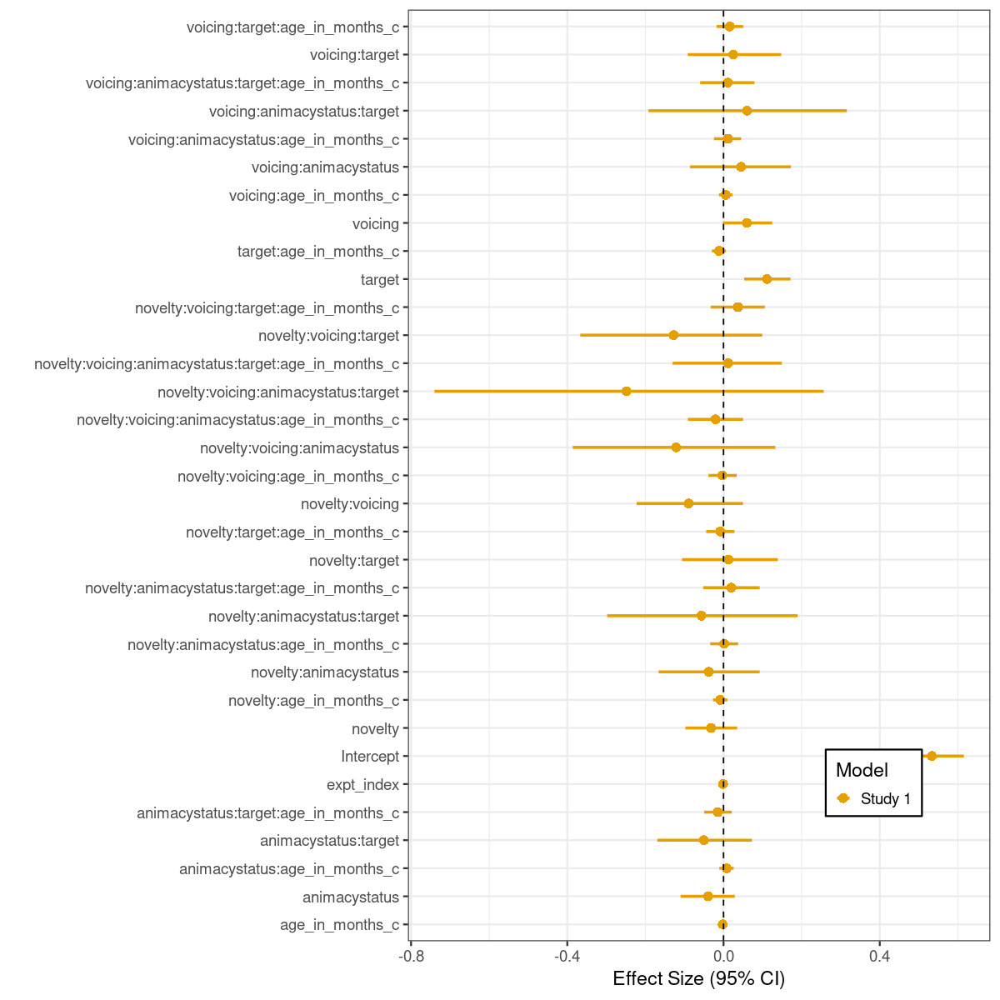

In [153]:
options(repr.plot.width=10, repr.plot.height=10)
ggplot(as.data.frame(eyetracking_lm_fixed_effects) 
    ) + geom_errorbarh(aes(xmin=Q2.5, xmax=Q97.5,y=term, color=model), size=1,
        height=0, position=ggstance::position_dodgev(height=0.3)
    ) + geom_point(aes(x=Estimate,y=term, color=model, shape=model),
        position=ggstance::position_dodgev(height=0.3), size=3) + theme_bw(base_size=14
    ) + geom_vline(xintercept=0, lty=2) + xlab('Effect Size (95% CI)'
    ) + ylab('')  + scale_color_manual(values=c("#E69F00", "#56B4E9", "#E95670"), name = "Model"
    ) +  scale_shape_discrete(name = "Model") + theme(
    legend.key.size = unit(.4, "cm"),
    legend.position = c(.8,.17), 
    legend.background = element_rect(fill="white", linetype="solid", 
                                  colour ="black"))

In [154]:
eyetracking_lm_fixed_effects = eyetracking_lm_fixed_effects %>% filter(!interaction)

In [155]:
eyetracking_lm_fixed_effects

,Estimate,Est.Error,Q2.5,Q97.5,term,group,interaction,sig,model
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,<lgl>,<chr>
Intercept,0.533307467,0.041818239,0.450497131,0.615247028,Intercept,fixed,FALSE,TRUE,Study 1
novelty,-0.031706767,0.033451574,-0.097637529,0.034917470,novelty,fixed,FALSE,FALSE,Study 1
voicing,0.059847507,0.032201354,-0.001503648,0.124734328,voicing,fixed,FALSE,FALSE,Study 1
animacystatus,-0.039662836,0.034574099,-0.109853169,0.028879631,animacystatus,fixed,FALSE,FALSE,Study 1
target,0.111467307,0.029984138,0.052830916,0.171562760,target,fixed,FALSE,TRUE,Study 1
age_in_months_c,-0.002205469,0.004298891,-0.010702433,0.006360309,age_in_months_c,fixed,FALSE,FALSE,Study 1
expt_index,-0.001214540,0.001936714,-0.004969480,0.002613017,expt_index,fixed,FALSE,FALSE,Study 1


In [156]:
relabel_terms = function(df, colname){
    remap = list()
    remap[['Intercept']] = 'Intercept'
    remap[['novelty']] = "Novelty\n(familiar vs. novel)"
    remap[['voicing']] = "Voicing\n(/s/ vs. /z/)"
    remap[['animacystatus']] = "Animacy\n(inanimate vs. animate)"
    remap[['target']] = "Target\n(singular vs. plural)"
    remap[['expt_index']] = "Trial Order"
    remap[['age_in_months_c']] = "Child Age\n(in months, centered at 30)"
    
    
    df[[colname]] = sapply(df$term, function(x){remap[[x]]})
    df[[colname]] = factor(df[[colname]], levels = rev(c(
        'Intercept',
        "Novelty\n(familiar vs. novel)",
        "Voicing\n(/s/ vs. /z/)",
        "Animacy\n(inanimate vs. animate)",
        "Target\n(singular vs. plural)",
        "Child Age\n(in months, centered at 30)",        
        "Trial Order"
    )))
    return(df)
}    
eyetracking_lm_fixed_effects = relabel_terms(eyetracking_lm_fixed_effects,'term')

In [157]:
fixef(study1_brm)

,Estimate,Est.Error,Q2.5,Q97.5
Intercept,0.533307467,0.041818239,0.450497131,0.615247028
novelty,-0.031706767,0.033451574,-0.097637529,0.034917470
voicing,0.059847507,0.032201354,-0.001503648,0.124734328
animacystatus,-0.039662836,0.034574099,-0.109853169,0.028879631
target,0.111467307,0.029984138,0.052830916,0.171562760
age_in_months_c,-0.002205469,0.004298891,-0.010702433,0.006360309
expt_index,-0.001214540,0.001936714,-0.004969480,0.002613017
novelty:voicing,-0.089453539,0.069522067,-0.222571203,0.049793194
novelty:animacystatus,-0.037826714,0.064826558,-0.166160784,0.092479963
voicing:animacystatus,0.044642078,0.065736435,-0.085592028,0.172532578


In [158]:
subset(fixef(study1_brm), (study1_brm$Q2.5 > 0 | study1_brm$Q97.5 < 0))
subset(fixef(study2_brm), (study2_brm$Q2.5 > 0 | study2_brm$Q97.5 < 0))

Estimate,Est.Error,Q2.5,Q97.5


Estimate,Est.Error,Q2.5,Q97.5


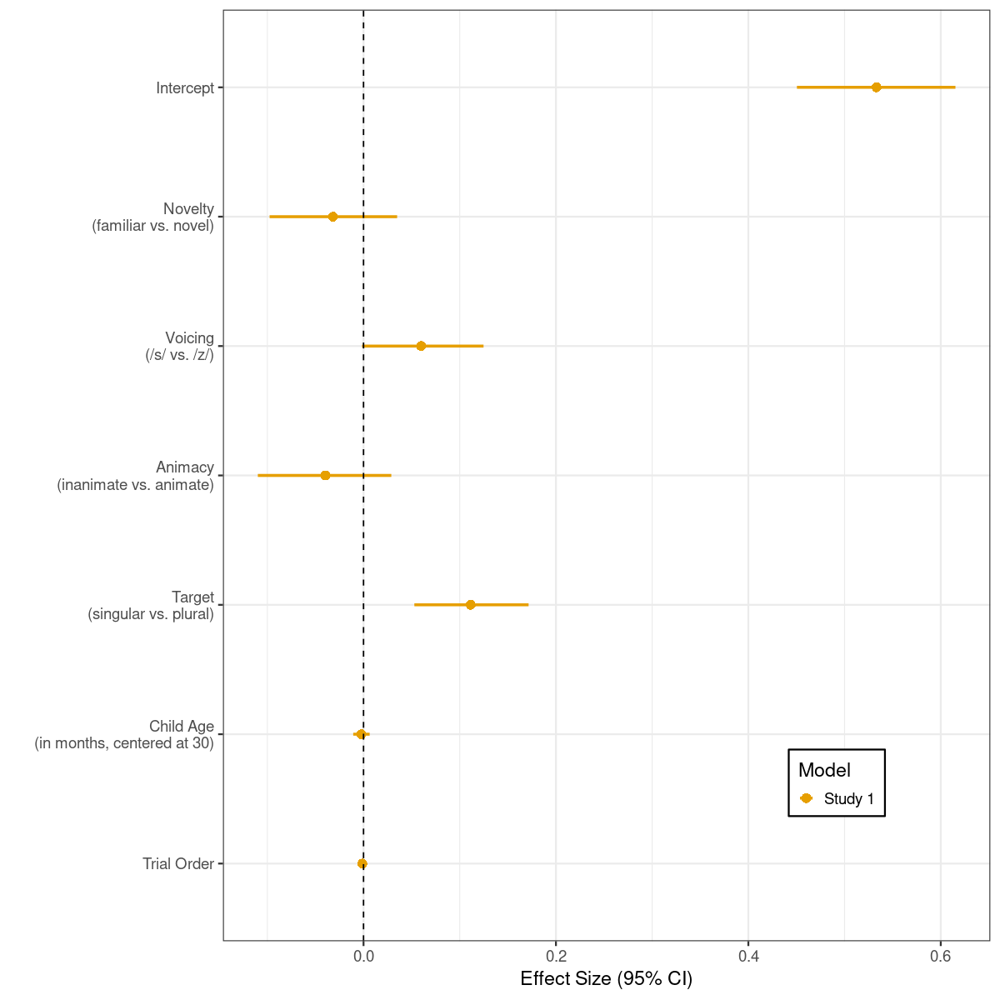

In [159]:
# contrast coded -.5, .5
options(repr.plot.width=10, repr.plot.height=10)
ggplot(as.data.frame(eyetracking_lm_fixed_effects) 
    ) + geom_errorbarh(aes(xmin=Q2.5, xmax=Q97.5,y=term, color=model), size=1,
        height=0, position=ggstance::position_dodgev(height=0.3)
    ) + geom_point(aes(x=Estimate,y=term, color=model, shape=model),
        position=ggstance::position_dodgev(height=0.3), size=3) + theme_bw(base_size=14
    ) + geom_vline(xintercept=0, lty=2) + xlab('Effect Size (95% CI)'
    ) + ylab('')  + scale_color_manual(values=c("#E69F00", "#56B4E9", "#E95670"), name = "Model"
    ) +  scale_shape_discrete(name = "Model") + theme(
    legend.key.size = unit(.4, "cm"),
    legend.position = c(.8,.17), 
    legend.background = element_rect(fill="white", linetype="solid", 
                                  colour ="black"))

#ggsave('figures/brms_eyetracking_lmem.pdf', width=5,height=3.2) 


# [X] confirm that Q2.5 has the meaning I expect -- yep, CIs in the original data
# [X] confirm that production model is similar
# [X] try adding age as a predictor (to both?)
# [X] effect size different for continuous vars -- no
# [X] Relabel predictors
# [X] move the label into the graph
# [X] Add age
# [X] copy the color correcting code 
# [ ] make a function for retrieving the estimate and CI 

In [160]:
# Limit to high production

In [161]:
study1_hp_lm_data = subset(trial_scores, type == "child" & expt_version=='scene' & broad_score > .5)
study1_hp_lm_data$novelty = binarize(study1_hp_lm_data$novelty,c('familiar','novel'))
study1_hp_lm_data$voicing = binarize(study1_hp_lm_data$voicing,c('voiceless','voiced'))
study1_hp_lm_data$animacystatus = binarize(study1_hp_lm_data$animacystatus, c('inanimate',
    'animate'))
study1_hp_lm_data$target = binarize(study1_hp_lm_data$target, c('s','pl'))
# https://stats.stackexchange.com/questions/242109/model-failed-to-converge-warning-in-lmer
# per-subject random slopes for novelty etc: each child has a different proposensity for
# the two classes, which is drawn for a Gaussian

[1] "familiar" "novel"   
[1] "voiceless" "voiced"   
[1] "inanimate" "animate"  
[1] "s"  "pl"


In [162]:
####BRMS for study 1, high producers
system.time(study1_hp_brm <- brm(is_looking_at_target ~ novelty*voicing*animacystatus*target *
        age_in_months_c + expt_index  + (novelty*voicing*animacystatus*target
         | participant_name) +(target * age_in_months_c |
        s_form),study1_hp_lm_data,family="gaussian",seed=1))


Compiling Stan program...

recompiling to avoid crashing R session

Start sampling




SAMPLING FOR MODEL '86763f45451f453d840b60966abdb987' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000293 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 2.93 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 78.908 seconds (Warm-up)
Chain 1:                86.2707 seconds (Sampling)
Ch

Warning message:
“There were 235 divergent transitions after warmup. See
https://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup
to find out why this is a problem and how to eliminate them.”
Warning message:
“There were 1 transitions after warmup that exceeded the maximum treedepth. Increase max_treedepth above 10. See
https://mc-stan.org/misc/warnings.html#maximum-treedepth-exceeded”
Warning message:
“Examine the pairs() plot to diagnose sampling problems
”
Warning message:
“The largest R-hat is 1.09, indicating chains have not mixed.
Running the chains for more iterations may help. See
https://mc-stan.org/misc/warnings.html#r-hat”
Warning message:
“Bulk Effective Samples Size (ESS) is too low, indicating posterior means and medians may be unreliable.
Running the chains for more iterations may help. See
https://mc-stan.org/misc/warnings.html#bulk-ess”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may

   user  system elapsed 
727.008   8.056 728.474 

In [163]:
study2_hp_lm_data = subset(trial_scores, type == "child" & expt_version=='redblue' & broad_score > .5)
study2_hp_lm_data$novelty = binarize(study2_hp_lm_data$novelty,c('familiar','novel'))
study2_hp_lm_data$voicing = binarize(study2_hp_lm_data$voicing,c('voiceless','voiced'))
study2_hp_lm_data$animacystatus = binarize(study2_hp_lm_data$animacystatus, c('inanimate',
    'animate'))
study2_hp_lm_data$target = binarize(study2_hp_lm_data$target, c('s','pl'))


[1] "familiar" "novel"   
[1] "voiceless" "voiced"   
[1] "inanimate" "animate"  
[1] "s"  "pl"


In [164]:
####BRMS for study 2.
system.time(study2_hp_brm <- brm(is_looking_at_target ~ novelty*voicing*animacystatus*target *
        age_in_months_c + expt_index  + (novelty*voicing*animacystatus*target
         | participant_name) +(target * age_in_months_c |
        s_form),study2_hp_lm_data,family="gaussian",seed=1))



Compiling Stan program...

recompiling to avoid crashing R session

Start sampling




SAMPLING FOR MODEL '86763f45451f453d840b60966abdb987' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000387 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 3.87 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 39.6102 seconds (Warm-up)
Chain 1:                23.3011 seconds (Sampling)
C

Warning message:
“There were 3 divergent transitions after warmup. See
https://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup
to find out why this is a problem and how to eliminate them.”
Warning message:
“Examine the pairs() plot to diagnose sampling problems
”


   user  system elapsed 
308.396   9.408 311.498 

In [165]:
study3_hp_lm_data = subset(trial_scores, type == "child" & expt_version=='agreement' & broad_score > .5)
study3_hp_lm_data$novelty = binarize(study3_hp_lm_data$novelty,c('familiar','novel'))
study3_hp_lm_data$voicing = binarize(study3_hp_lm_data$voicing,c('voiceless','voiced'))
study3_hp_lm_data$animacystatus = binarize(study3_hp_lm_data$animacystatus, c('inanimate',
    'animate'))
study3_hp_lm_data$target = binarize(study3_hp_lm_data$target, c('s','pl'))

[1] "familiar" "novel"   
[1] "voiceless" "voiced"   
[1] "inanimate" "animate"  
[1] "s"  "pl"


In [166]:
####BRMS for study 3.
system.time(study3_hp_brm <- brm(is_looking_at_target ~ novelty*voicing*animacystatus*target *
        age_in_months_c + expt_index  + (novelty*voicing*animacystatus*target
         | participant_name) +(target * age_in_months_c |
        s_form),study3_hp_lm_data,family="gaussian"))

Compiling Stan program...

Start sampling




SAMPLING FOR MODEL '0a94fb3247668d9e5f6bffde5435498d' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000261 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 2.61 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 99.8142 seconds (Warm-up)
Chain 1:                78.3351 seconds (Sampling)
C

Warning message:
“There were 201 divergent transitions after warmup. See
https://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup
to find out why this is a problem and how to eliminate them.”
Warning message:
“There were 956 transitions after warmup that exceeded the maximum treedepth. Increase max_treedepth above 10. See
https://mc-stan.org/misc/warnings.html#maximum-treedepth-exceeded”
Warning message:
“There were 1 chains where the estimated Bayesian Fraction of Missing Information was low. See
https://mc-stan.org/misc/warnings.html#bfmi-low”
Warning message:
“Examine the pairs() plot to diagnose sampling problems
”
Warning message:
“Bulk Effective Samples Size (ESS) is too low, indicating posterior means and medians may be unreliable.
Running the chains for more iterations may help. See
https://mc-stan.org/misc/warnings.html#bulk-ess”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may be unreliable.

   user  system elapsed 
847.580   8.412 849.733 

In [167]:
eyetracking_hp_lm_fixed_effects = rbind(
    prepModelForDWPlot(study3_hp_brm) %>% mutate(model = "Study 3"),
    prepModelForDWPlot(study2_hp_brm) %>% mutate(model = "Study 2"),
    prepModelForDWPlot(study1_hp_brm) %>% mutate(model = "Study 1")
) 

Warning message:
“There were 201 divergent transitions after warmup. Increasing adapt_delta above 0.8 may help. See http://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup”
Warning message:
“There were 3 divergent transitions after warmup. Increasing adapt_delta above 0.8 may help. See http://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup”
Warning message:
“Parts of the model have not converged (some Rhats are > 1.05). Be careful when analysing the results! We recommend running more iterations and/or setting stronger priors.”
Warning message:
“There were 235 divergent transitions after warmup. Increasing adapt_delta above 0.8 may help. See http://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup”


In [168]:
eyetracking_lm_fixed_effects = eyetracking_lm_fixed_effects %>% filter(!interaction)
eyetracking_hp_lm_fixed_effects = relabel_terms(eyetracking_hp_lm_fixed_effects,'term')

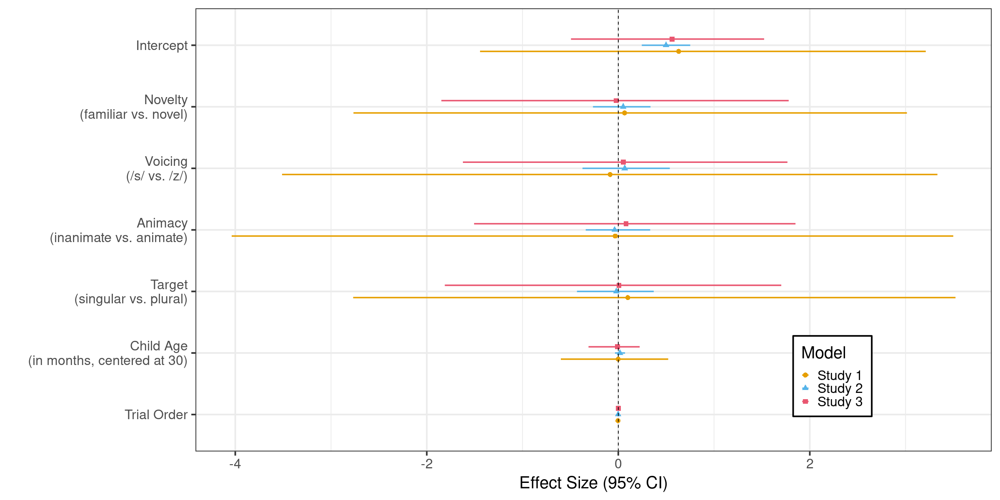

In [169]:
options(repr.plot.width=20, repr.plot.height=10)
ggplot(as.data.frame(subset(eyetracking_hp_lm_fixed_effects, !is.na(term))) 
    ) + geom_errorbarh(aes(xmin=Q2.5, xmax=Q97.5,y=term, color=model), size=1,
        height=0, position=ggstance::position_dodgev(height=0.3)
    ) + geom_point(aes(x=Estimate,y=term, color=model, shape=model),
        position=ggstance::position_dodgev(height=0.3), size=3) + theme_bw(base_size=24                                                                           
    ) + geom_vline(xintercept=0, lty=2) + xlab('Effect Size (95% CI)'
    ) + ylab('')  + scale_color_manual(values=c("#E69F00", "#56B4E9", "#E95670"), name = "Model"
    ) +  scale_shape_discrete(name = "Model") + theme(
    legend.key.size = unit(.4, "cm"),
    legend.position = c(.8,.17), 
    legend.background = element_rect(fill="white", linetype="solid", 
                                  colour ="black"))

In [170]:
#why the huge difference in effect sizes?

In [171]:
names(study3_hp_lm_data)

[1] "participant_name"         "expt_index"              
 [3] "novelty"                  "voicing"                 
 [5] "animacystatus"            "s_form"                  
 [7] "type"                     "target"                  
 [9] "expt_version"             "is_looking_at_target"    
[11] "is_looking_at_distractor" "thresholded"             
[13] "age_in_months"            "broad_score"             
[15] "age_in_months_c"

In [172]:
length(unique(study1_hp_lm_data$participant_name))

[1] 3

In [173]:
# options(repr.plot.width=4, repr.plot.height=3)
# regression_df = subset(rbind(study1_lm_aug, study2_lm_aug), group =="fixed")
# regression_df$panel = sapply(regression_df$term, function(x){
#     if (x == 'Intercept'){
#         'intercept'
#     } else {
#         'betas'
#     }
# })

# scales_x <- list(
#   `betas` = scale_x_continuous(limits = c(-.2, .2), breaks = seq(-1, .1, .05)),
#   `intercept` = scale_x_continuous(limits = c(.4, .6), breaks = seq(.4, .6, .05))
# )

# p1 = dwplot(regression_df, conf.level = .95, dot_args = list(aes(shape=model), size=3)
#     )  + geom_vline(xintercept=0, lty=2) 

# p1 = p1 %>% relabel_predictors(c(
#     novelty = "Novelty\n(novel vs. familiar)",
#     voicing = "Voicing\n(/s/ vs. /z/)",
#     animacystatus = "Animacy\n(inanimate vs. animate)",
#     target = "Target\n(singular vs. plural)",
#     expt_index = "Trial Order",
#     `novelty:voicing` = "Novelty x Voicing"
# ))
# print(p1 + theme_bw(base_size=14) + theme(
#     legend.key.size = unit(.4, "cm"),
#     legend.position = c(.8,.5), 
#     legend.background = element_rect(fill="white", linetype="solid", 
#                                   colour ="black"),
#     axis.text.x = element_text(angle = 45, hjust = 1)
#     )  + geom_vline(xintercept=0, lty=2
# )  +
#       labs(color = "") + scale_color_manual(values=c("#E69F00", "#56B4E9")
# ) + labs(
#      color = "Model"
# ) + coord_cartesian(xlim=c(-.25, .5)) + xlab('Effect Size (95% CI)'
# ) +  scale_shape_discrete(name = "Model"))
            
# #  + facet_grid_sc(cols = vars(panel), scales=list(x= scales_x)))+ geom_vline(xintercept=.5, lty=2, color='red')
      

# ggsave('figures/eyetracking_lmem.pdf', width=5,height=3.2) 

In [174]:
# https://stats.idre.ucla.edu/r/library/r-library-contrast-coding-systems-for-categorical-variables/#DEVIATION
# sum contrasts: deviations from th egran mean
# has an effect like contrasting
# http://people.linguistics.mcgill.ca/~morgan/book/practical-regression-topics-1-multi-level-factors-contrast-coding-interactions.html
#for adults:
#novel singular  .3 + 1*-.01 + 1*-.05
#familiar plural  .3 + -1*-.01 + -1*-.05
#b12 * x_1 * x_2, seems weird 

In [175]:
source('texvars.R')
tvc = get_texvar_from_beta(study1_brm, 'voicing','sceneEyetrackingLMvoicing', tvc)
tvc = get_texvar_from_beta(study2_brm, 'voicing','redblueEyetrackingLMvoicing', tvc)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)
# tvc

In [176]:
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

# Intercepts Only Models

Are we committing Type II errors by including so many random slopes?

In [177]:
####BRMS for study 1. Takes 5 mins 
system.time(study1_brm_interceptsOnly <- brm(is_looking_at_target ~ novelty*voicing*animacystatus*target *
        age_in_months_c + expt_index  + (novelty+voicing+animacystatus+target
         | participant_name) +(target + age_in_months_c|
        s_form),study1_lm_data,family="gaussian",seed=1))

Compiling Stan program...

Start sampling




SAMPLING FOR MODEL '9a053637617f8f0330d267350cb3ba01' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000445 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 4.45 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 32.6932 seconds (Warm-up)
Chain 1:                10.0248 seconds (Sampling)
C

Warning message:
“There were 4 divergent transitions after warmup. See
https://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup
to find out why this is a problem and how to eliminate them.”
Warning message:
“Examine the pairs() plot to diagnose sampling problems
”


   user  system elapsed 
232.448   8.384 234.183 

In [178]:
####BRMS for study 2. Takes 5 mins 
system.time(study2_brm_interceptsOnly <- brm(is_looking_at_target ~ novelty*voicing*animacystatus*target *
        age_in_months_c + expt_index  + (novelty+voicing+animacystatus+target
         | participant_name) +(target + age_in_months_c|
        s_form),study2_lm_data,family="gaussian",seed=1))

Compiling Stan program...

recompiling to avoid crashing R session

Start sampling




SAMPLING FOR MODEL '9a053637617f8f0330d267350cb3ba01' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000352 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 3.52 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 27.3864 seconds (Warm-up)
Chain 1:                8.26913 seconds (Sampling)
C

   user  system elapsed 
205.420   8.188 206.142 

In [179]:
eyetracking_lm_fixed_effects_interceptsOnly = rbind(prepModelForDWPlot(study1_brm_interceptsOnly
) %>% mutate(model = "Study 1"), prepModelForDWPlot(study2_brm_interceptsOnly) %>% mutate(
model = "Study 2"))

Warning message:
“There were 4 divergent transitions after warmup. Increasing adapt_delta above 0.8 may help. See http://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup”


In [180]:
eyetracking_lm_fixed_effects_noIntercepts = relabel_terms(eyetracking_lm_fixed_effects_interceptsOnly,'term')

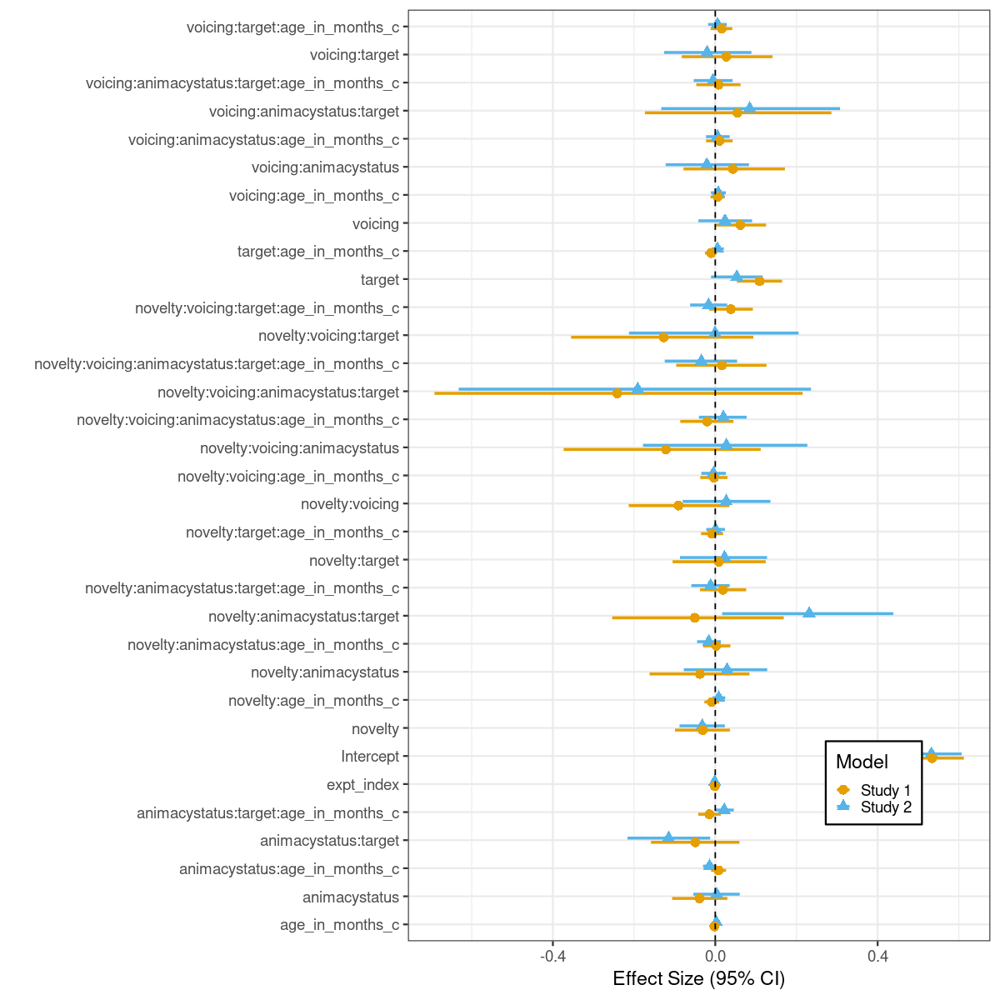

In [181]:
options(repr.plot.width=10, repr.plot.height=10)
ggplot(as.data.frame(eyetracking_lm_fixed_effects_interceptsOnly) 
    ) + geom_errorbarh(aes(xmin=Q2.5, xmax=Q97.5,y=term, color=model), size=1,
        height=0, position=ggstance::position_dodgev(height=0.3)
    ) + geom_point(aes(x=Estimate,y=term, color=model, shape=model),
        position=ggstance::position_dodgev(height=0.3), size=3) + theme_bw(base_size=14
    ) + geom_vline(xintercept=0, lty=2) + xlab('Effect Size (95% CI)'
    ) + ylab('')  + scale_color_manual(values=c("#E69F00", "#56B4E9"), name = "Model"
    ) +  scale_shape_discrete(name = "Model") + theme(
    legend.key.size = unit(.4, "cm"),
    legend.position = c(.8,.17), 
    legend.background = element_rect(fill="white", linetype="solid", 
                                  colour ="black"))

In [182]:
 subset(as.data.frame(fixef(study2_brm_interceptsOnly)), Q2.5 > 0 |  Q97.5 < 0)

,Estimate,Est.Error,Q2.5,Q97.5
,<dbl>,<dbl>,<dbl>,<dbl>
Intercept,0.5323578,0.03792852,0.45775881,0.60686375
animacystatus:target,-0.1147829,0.05316037,-0.21622096,-0.01248999
novelty:animacystatus:target,0.2313511,0.10674724,0.01692046,0.43863040


In [183]:
 subset(as.data.frame(fixef(study1_brm_interceptsOnly)), Q2.5 > 0 |  Q97.5 < 0)

,Estimate,Est.Error,Q2.5,Q97.5
,<dbl>,<dbl>,<dbl>,<dbl>
Intercept,0.53409045,0.04051525,0.4534813588,0.6122816
voicing,0.06176533,0.03217683,0.0001343912,0.1252070
target,0.10915940,0.02848496,0.0530769850,0.1646459


# Participant Receptive Scores

In [188]:
length(by_participant)

[1] 119

In [216]:
source('PLEARN_analysis_helper.R')
normalizeMethods = c('none','yoked','preceding')
all_scores = do.call('rbind.fill', lapply(normalizeMethods, function(normalizeMethod){
    do.call('rbind.fill', lapply(by_participant, function(fixbin_df){
        test_participant_receptive_knowledge(fixbin_df, normalizeMethod, end_analysis_window= 4000)
    }))    
}))

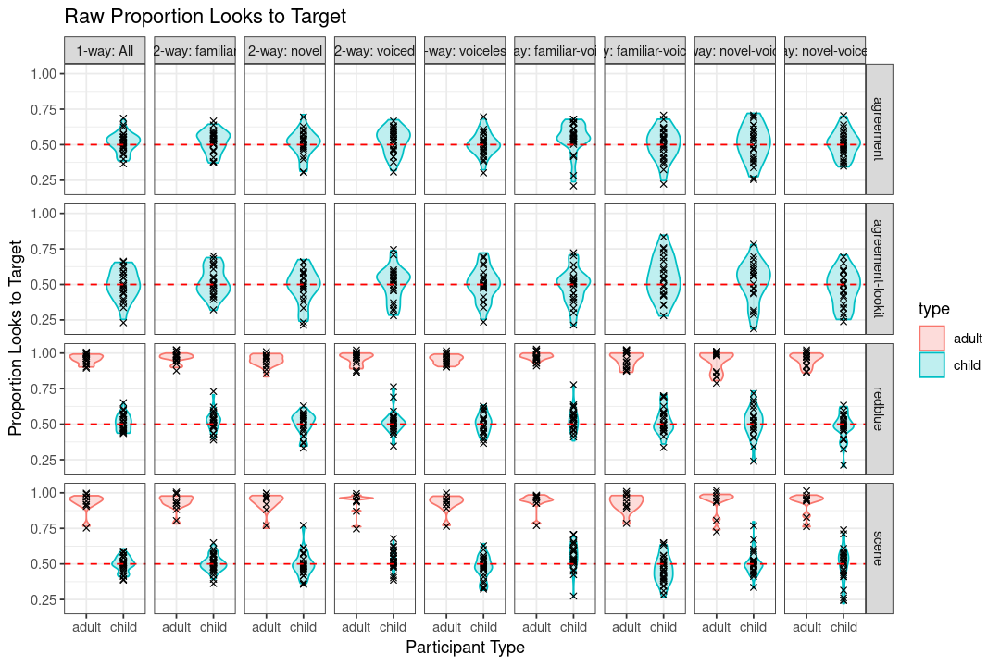

In [217]:
options(repr.plot.width=9, repr.plot.height=6)
ggplot(subset(all_scores, normalizeMethod == 'none')) + geom_violin(
aes(y=prop_looks_to_target, x = type,
colour = type, fill = type), alpha=.25) +
geom_point(aes(x= type, y=prop_looks_to_target), colour ='black',
shape = 4, position=position_jitter(height=.03, width=0)) + facet_grid(
expt_version~partition_name) + theme_bw() + geom_hline(yintercept=.5, 
linetype = 'dashed', colour='red') + ggtitle('Raw Proportion Looks to Target'
) + xlab('Participant Type') + ylab('Proportion Looks to Target') 

The reason to do it this way is to check if a particuar subset of items is above chance, e.g. familiar voicless

In [206]:
# adults first
adult_scores = subset(all_scores, normalizeMethod == 'preceding' & type=='adult' & 
       contrast_type=='1-way')
shapiro.test(subset(adult_scores, expt_version == 'scene')$prop_looks_to_target)
shapiro.test(subset(adult_scores, expt_version == 'redblue')$prop_looks_to_target)
# Adults are normally distributed shapiro test

t.test(subset(adult_scores, expt_version == 'scene')$prop_looks_to_target,
      subset(adult_scores, expt_version == 'redblue')$prop_looks_to_target)

t.test(adult_scores$prop_looks_to_target, mu = 0, alternative = "two.sided")


	Shapiro-Wilk normality test

data:  subset(adult_scores, expt_version == "scene")$prop_looks_to_target
W = 0.7849, p-value = 0.01371



	Shapiro-Wilk normality test

data:  subset(adult_scores, expt_version == "redblue")$prop_looks_to_target
W = 0.93067, p-value = 0.2792



	Welch Two Sample t-test

data:  subset(adult_scores, expt_version == "scene")$prop_looks_to_target and subset(adult_scores, expt_version == "redblue")$prop_looks_to_target
t = -1.7292, df = 17.124, p-value = 0.1018
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.12278173  0.01213841
sample estimates:
mean of x mean of y 
0.3975754 0.4528970 



	One Sample t-test

data:  adult_scores$prop_looks_to_target
t = 26.707, df = 23, p-value < 2.2e-16
alternative hypothesis: true mean is not equal to 0
95 percent confidence interval:
 0.3986777 0.4656251
sample estimates:
mean of x 
0.4321514 


In [207]:
child_scores = subset(all_scores, normalizeMethod == 'preceding' & type=='child' & 
       contrast_type=='1-way')
# are both normal?
shapiro.test(subset(child_scores, expt_version == 'scene')$prop_looks_to_target)
shapiro.test(subset(child_scores, expt_version == 'redblue')$prop_looks_to_target)

#distinguished from one another?
combineEyetrackingT = t.test(subset(child_scores, expt_version == 'scene')$prop_looks_to_target,
      subset(child_scores, expt_version == 'redblue')$prop_looks_to_target)
combineEyetrackingT


	Shapiro-Wilk normality test

data:  subset(child_scores, expt_version == "scene")$prop_looks_to_target
W = 0.96809, p-value = 0.5745



	Shapiro-Wilk normality test

data:  subset(child_scores, expt_version == "redblue")$prop_looks_to_target
W = 0.97543, p-value = 0.8318



	Welch Two Sample t-test

data:  subset(child_scores, expt_version == "scene")$prop_looks_to_target and subset(child_scores, expt_version == "redblue")$prop_looks_to_target
t = -0.56208, df = 43.68, p-value = 0.5769
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.04908079  0.02767760
sample estimates:
   mean of x    mean of y 
-0.002848771  0.007852825 


In [208]:
tvc = update_texvar_cache(tvc, paste0('combineEyetrackingT'),combineEyetrackingT$statistic)
tvc = update_texvar_cache(tvc, paste0('combineEyetrackingDF'), 
                          combineEyetrackingT$parameter)
tvc = update_texvar_cache(tvc, paste0('combineEyetrackingPvalue'), 
                          combineEyetrackingT$p.value)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

This test suggests that we can combine across the two receptive experiments

In [209]:
getEyetrackingStudyStats = function(yoked_scores, expt_vers, tvc){
    # these are subject means? 
    df = subset(yoked_scores, expt_version == expt_vers)
    #update_texvar_cache(cache, var, value)
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresGt0'), sum(df$prop_looks_to_target > 0))
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresN'),nrow(df))
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresMean'),
                              mean(df$prop_looks_to_target), digits=3)
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresSD'),
                              sd(df$prop_looks_to_target))
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresMin'),
                              min(df$prop_looks_to_target))
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresMax'),
                              max(df$prop_looks_to_target))
    t_test = t.test(df$prop_looks_to_target, mu=0)
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresTStatisistic'),
                             t_test$statistic)
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresTdf'),
                             t_test$parameter)
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresPvalue'),
                             t_test$p.value)
    return(tvc)
}

In [210]:
tvc = getEyetrackingStudyStats(child_scores, 'scene',tvc)
tvc = getEyetrackingStudyStats(child_scores, 'redblue',tvc)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [211]:
tvc

$ranN
[1] 118

$ranNScene
[1] 35

$ranNRedBlue
[1] 29

$ranNAgreement
[1] 27

$ranNAgreementLookit
[1] 27

$totalN
[1] 118

$studyN
[1] 115

$sceneN
[1] 35

$redblueN
[1] 29

$agreementN
[1] 27

$agreementLookitN
[1] 27

$redblueNExclusions
[1] 6

$sceneNExclusions
[1] 6

$agreementNExclusions
[1] 1

$agreementLookitNExclusions
[1] 5

$redBlueAdultN
[1] 15

$sceneAdultN
[1] 9

$nRedBlueStorybookExclusions
[1] 1

$nSceneStorybookExclusions
[1] 2

$nAgreementStorybookExclusions
[1] 0

$percentFem
[1] 56.04

$numFem
[1] 32

$meanAge
[1] 30.24

$sdAge
[1] 3.82

$numStorybookTrialsExcluded
[1] 36

$numChildrenWithTrialsExcludedFromStorybook
[1] 14

$productionWilcoxonStat
[1] 222.5

$productionWilcoxonP
[1] 0.39

$nChildrenWithExcludedTrials
[1] 87

$nTrialsExcludedByFilter
[1] 444

$percentExcludedEyetrackingTrials
[1] 15

$nEyetrackingSubjExcludedByDataFilter
[1] 1

$sceneEyetrackingLMvoicing
[1] "$\\beta$ = 0.06, 95\\% CI = -0.002 - 0.125"

$redblueEyetrackingLMvoicing
[1] "$\\beta$ = 0.025, 95\\% CI = -0.041 - 0.092"

$combineEyetrackingT
    t 
-0.56 

$combineEyetrackingDF
   df 
43.68 

$combineEyetrackingPvalue
[1] 0.58

$sceneDiffScoresGt0
[1] 13

$sceneDiffScoresN
[1] 26

$sceneDiffScoresMean
[1] -0.003

$sceneDiffScoresSD
[1] 0.06

$sceneDiffScoresMin
[1] -0.17

$sceneDiffScoresMax
[1] 0.15

$sceneDiffScoresTStatisistic
    t 
-0.23 

$sceneDiffScoresTdf
df 
25 

$sceneDiffScoresPvalue
[1] 0.82

$redblueDiffScoresGt0
[1] 13

$redblueDiffScoresN
[1] 22

$redblueDiffScoresMean
[1] 0.008

$redblueDiffScoresSD
[1] 0.07

$redblueDiffScoresMin
[1] -0.11

$redblueDiffScoresMax
[1] 0.15

$redblueDiffScoresTStatisistic
   t 
0.55 

$redblueDiffScoresTdf
df 
21 

$redblueDiffScoresPvalue
[1] 0.59

In [212]:
# Get pair-level data
source('PLEARN_analysis_helper.R')
ltts = do.call('rbind', lapply(by_participant, function(fixbin_df){
        test_participant_receptive_knowledge(fixbin_df, 'yoked',
                    end_analysis_window= 4000, return_type="ltt")
}))    

In [213]:
names(ltts)

[1] "expt_index"                         "novelty"                           
 [3] "voicing"                            "animacystatus"                     
 [5] "s_form"                             "type"                              
 [7] "participant_name"                   "expt_version"                      
 [9] "is_looking_at_target"               "is_looking_at_distractor"          
[11] "prop_looks_to_item_when_distractor" "corrected_looks_to_target"

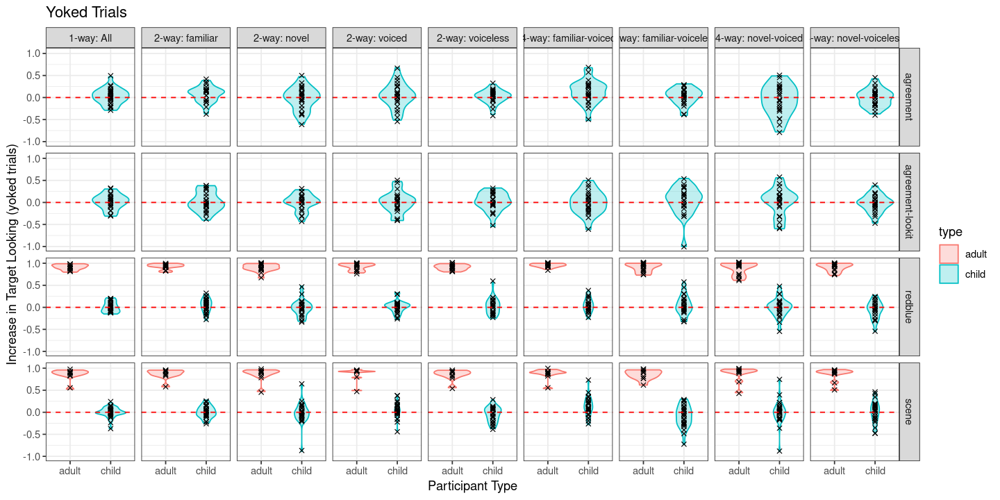

In [218]:
options(repr.plot.width=12, repr.plot.height=6)
ggplot(subset(all_scores, normalizeMethod == 'yoked')) + geom_violin(
aes(y=prop_looks_to_target, x = type,
colour = type, fill = type), alpha=.25) +
geom_point(aes(x=type, y=prop_looks_to_target), colour ='black',
shape = 4, position=position_jitter(height=.03, width=0)) + facet_grid(
expt_version~partition_name) + theme_bw() + geom_hline(yintercept=0, 
linetype = 'dashed', colour='red') + ggtitle('Yoked Trials'
) + xlab('Participant Type') + ylab('Increase in Target Looking (yoked trials)') 

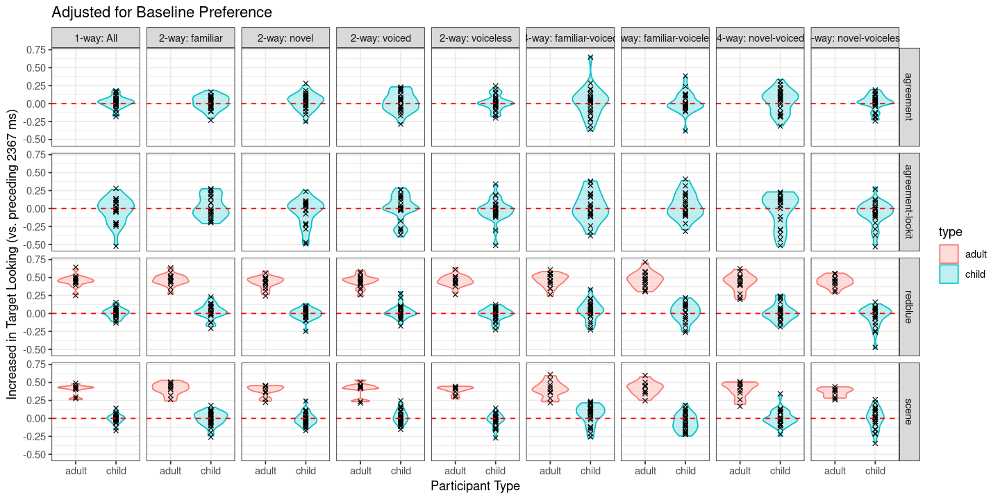

In [221]:
options(repr.plot.width=12, repr.plot.height=6)
ggplot(subset(all_scores, normalizeMethod == 'preceding')) + geom_violin(
aes(y=prop_looks_to_target, x = type,
colour = type, fill = type), alpha=.25) +
geom_point(aes(x=type, y=prop_looks_to_target), position=position_jitter(
height=.03, width=0), colour ='black', shape = 4) + facet_grid(
expt_version~partition_name) + theme_bw() + geom_hline(yintercept=0, 
linetype = 'dashed', colour='red') + ggtitle('Adjusted for Baseline Preference'
) + xlab('Participant Type') + ylab('Increased in Target Looking (vs. preceding 2367 ms)') 

# Expressive Scores vs. Receptive Scores

In [226]:
child_receptive_scores = subset(all_scores, normalizeMethod == 'yoked' & 
                                contrast_type == '1-way')
exre = subset(merge(subject_info[,c('participant_name','age_in_months','broad_score','narrow_score')], subset(child_receptive_scores, type =='child')
    , by='participant_name'), age_in_months > 20 &age_in_months <40)
head(exre)

exre_subset = subset(exre, expt_version %in% c('redblue','agreement'))
wilcox.test(exre_subset$prop_looks_to_target ~ exre_subset$expt_version)

,participant_name,age_in_months,broad_score,narrow_score,type,contrast_type,prob,prop_looks_to_target,thresholded,partition_name,normalizeMethod,expt_version
,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<fct>
1,019e5595-bffa-4ab1-935c-a501119f1380,24.00000,0.0000000,NaN,child,1-way,0.9999945,-0.09388999,Does not demonstrate RK! (p > .33),1-way: All,yoked,agreement-lookit
2,051d85eb-5513-4d58-b2b9-0a16d27a64d8,23.96721,NA,NA,child,1-way,0.9998614,0.05442689,Does not demonstrate RK! (p > .33),1-way: All,yoked,agreement-lookit
3,0b51e58f-72dc-4f65-aea9-c36eddf418df,32.03279,0.0000000,0.0,child,1-way,1.0000000,0.09022978,Does not demonstrate RK! (p > .33),1-way: All,yoked,agreement-lookit
4,13badd8d-0051-49d4-80a7-1d61a1ec2cce,28.55738,0.1428571,1.0,child,1-way,1.0000000,0.03064593,Does not demonstrate RK! (p > .33),1-way: All,yoked,agreement-lookit
5,1e04539d-c09d-4f71-96a4-5e01bb073d67,34.49180,0.4000000,0.4,child,1-way,0.8684120,0.29950660,Does not demonstrate RK! (p > .33),1-way: All,yoked,agreement-lookit
6,1e8ae9b0-6b68-4636-a983-4e53b2522fce,24.55738,0.0000000,NaN,child,1-way,1.0000000,-0.31163628,Does not demonstrate RK! (p > .33),1-way: All,yoked,agreement-lookit



	Wilcoxon rank sum exact test

data:  exre_subset$prop_looks_to_target by exre_subset$expt_version
W = 295, p-value = 0.6804
alternative hypothesis: true location shift is not equal to 0


In [228]:
exre_subset = subset(exre, expt_version %in% c('scene','agreement'))
wilcox.test(exre_subset$prop_looks_to_target ~ exre_subset$expt_version)


	Wilcoxon rank sum exact test

data:  exre_subset$prop_looks_to_target by exre_subset$expt_version
W = 356, p-value = 0.5686
alternative hypothesis: true location shift is not equal to 0


In [229]:
length(exre$prop_looks_to_target) 

[1] 94

This means no difference in yoked difference scores given the version of the experiment

In [230]:
library('grDevices')

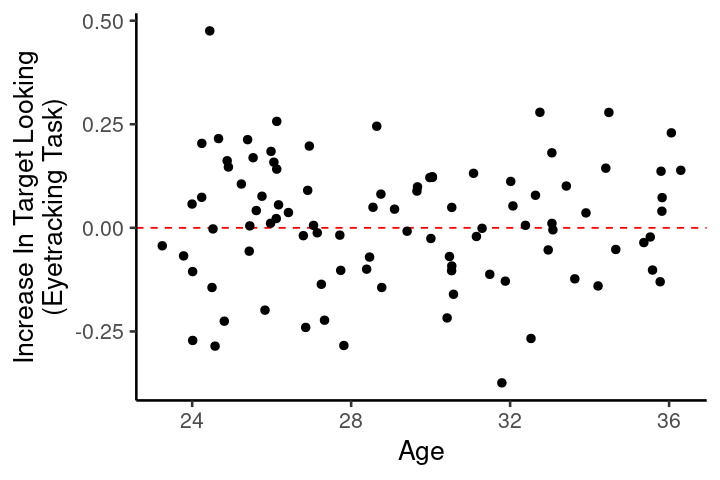

In [231]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(subset(exre, age_in_months > 20 & age_in_months < 40)) + geom_hline(yintercept=0,  
color = 'red', linetype = 'dashed') + geom_jitter(
aes(x=age_in_months, y=prop_looks_to_target), alpha = 1,
    colour="black", size=2, width = .03, height =.03
)  + theme_classic(
    base_size = 16
) + xlab(
    'Age') + ylab(
    'Increase In Target Looking\n(Eyetracking Task)') 

#+ coord_cartesian(xlim=c(0,1),    ylim =c(-.3,.3))

#ggsave('figures/expressive_vs_receptive.pdf', width=6, height=4)

In [232]:
exre$age_floor = sapply(exre$age_in_months, floor)

Warning message:
“Ignoring unknown aesthetics: id”
Warning message:
“Removed 19 rows containing missing values (geom_point).”


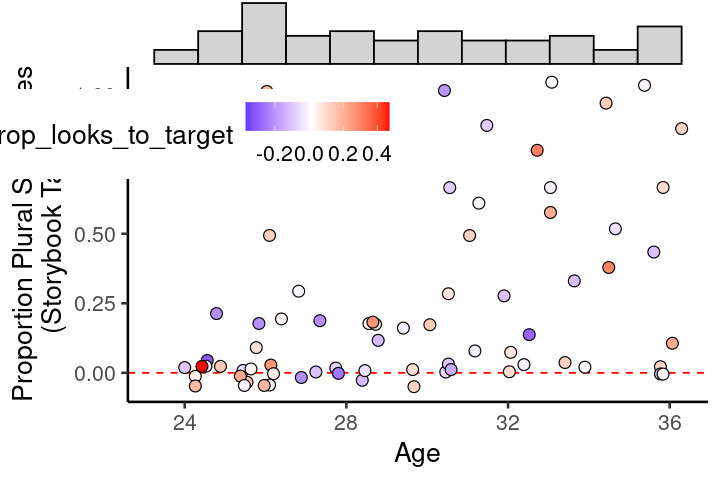

In [233]:
options(repr.plot.width=6, repr.plot.height=4)
mid<-mean(exre$prop_looks_to_target)

p1 = ggplot(subset(exre, age_floor >= 23 & age_floor <= 36)) + geom_hline(yintercept=0,  
color = 'red', linetype = 'dashed') + geom_jitter(
aes(x=age_in_months, y=broad_score, fill=prop_looks_to_target,
   id=prop_looks_to_target), alpha = 1, 
    size=3, width = 0, height =.05, pch=21, colour="black"
)  + theme_classic(
    base_size = 16
) + theme(legend.position = c(0.1, 0.8), legend.direction = 'horizontal') + xlab(
    'Age') + ylab(
    'Proportion Plural Successes\n(Storybook Task)') +scale_fill_gradient2(midpoint=mid, 
    low="blue", mid="white",high="red", space ="Lab" )

p1 = ggMarginal(p1, type = "histogram", margins="x", color="black",
    fill = "lightgray", xparams = list(bins=13))
ggsave('figures/expressive_vs_age.pdf', plot = p1, width=4, height=4)
p1
# Marginal histogram here is a placeholder -- can't pass the rounded month to ggextra,
# so it doesn't actually fit

In [236]:
exre$age_in_months[order(exre$age_in_months)]

[1] 23.24590 23.77049 23.96721 24.00000 24.00000 24.26230 24.26230 24.42623
 [9] 24.49180 24.52459 24.55738 24.68852 24.78689 24.88525 24.88525 25.21311
[17] 25.37705 25.44262 25.47541 25.54098 25.63934 25.77049 25.83607 25.96721
[25] 25.96721 26.03279 26.09836 26.09836 26.13115 26.19672 26.39344 26.81967
[33] 26.88525 26.91803 26.91803 27.08197 27.14754 27.24590 27.34426 27.73770
[41] 27.73770 27.80328 28.39344 28.45902 28.55738 28.65574 28.72131 28.78689
[49] 29.11475 29.40984 29.63934 29.67213 29.96721 30.00000 30.06557 30.06557
[57] 30.42623 30.45902 30.52459 30.52459 30.55738 30.59016 31.04918 31.18033
[65] 31.27869 31.47541 31.77049 31.90164 32.03279 32.06557 32.39344 32.52459
[73] 32.62295 32.72131 32.98361 33.04918 33.04918 33.08197 33.40984 33.63934
[81] 33.90164 34.22951 34.42623 34.49180 34.65574 35.37705 35.54098 35.60656
[89] 35.77049 35.77049 35.83607 35.83607 36.06557 36.29508

In [237]:
print(mid)

[1] 0.0131735


In [238]:
summary(lm(prop_looks_to_target ~ broad_score, exre))$r.squared

[1] 0.01198968

In [239]:
spearboot = function(dat, var1, var2, cor_method, R = 2500){
    N <- nrow(dat)
    cor.boot = mat.or.vec(1,R)
    for (i in 1:R) {
      idx <- sample.int(N, N, replace = TRUE) 
      cor.boot[i] <- cor(dat[idx,var1],dat[idx,var2], method=cor_method,
                        use='pairwise.complete.obs')
    }
    return(cor.boot)
}

getSpearmanStats = function(exre, var1, var2, varTitle, tvc){
    cor_test = cor.test(exre[[var1]], exre[[var2]], use='pairwise.complete.obs',
       method = "spearman")
    
    boot_estimate = spearboot(exre, var1, var2,
    'spearman')
    
    boot_ci = quantile(boot_estimate, c(.025,.975))    
    #print(unname(cor_test$estimate)[1])
    tvc = update_texvar_cache(tvc, paste0(varTitle,'Cor'), unname(cor_test$estimate)[1], digits=3)
    #print(unname(cor_test$p.value)[1])
    tvc = update_texvar_cache(tvc, paste0(varTitle,'CorP'), unname(cor_test$p.value)[1], digits=3)
    #print(boot_ci[['2.5%']][1])
    tvc = update_texvar_cache(tvc, paste0(varTitle, 'CorLow'), boot_ci[['2.5%']][1], digits=3)
    tvc = update_texvar_cache(tvc, paste0(varTitle, 'CorHigh'), boot_ci[['97.5%']][1], digits=3)    
    return(tvc)    
}

In [241]:
tvc = getSpearmanStats(exre, 'prop_looks_to_target', 'broad_score', 'expRec', tvc)
tvc = getSpearmanStats(exre, 'age_in_months', 'broad_score', 'expAge', tvc)
tvc = getSpearmanStats(exre, 'age_in_months', 'prop_looks_to_target', 'recAge', tvc)
tvc = getSpearmanStats(exre, 'prop_looks_to_target', 'broad_score', 'expRec', tvc)
#tvc = writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

Warning message in cor.test.default(exre[[var1]], exre[[var2]], use = "pairwise.complete.obs", :
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(exre[[var1]], exre[[var2]], use = "pairwise.complete.obs", :
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(exre[[var1]], exre[[var2]], use = "pairwise.complete.obs", :
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(exre[[var1]], exre[[var2]], use = "pairwise.complete.obs", :
“Cannot compute exact p-value with ties”


In [242]:
lmp <- function (modelobject) {
    if (class(modelobject) != "lm") stop("Not an object of class 'lm' ")
    f <- summary(modelobject)$fstatistic
    p <- pf(f[1],f[2],f[3],lower.tail=F)
    attributes(p) <- NULL
    return(p)
}

lm_eqn <- function(df){
    m <- lm(prop_looks_to_target ~ broad_score, exre);
    eq <- substitute(~~italic(R)^2~"="~r2*","~~italic(p)~"="~pval, 
         list(a = format(unname(coef(m)[1]), digits = 2),
              b = format(unname(coef(m)[2]), digits = 2),
             r2 = format(summary(m)$r.squared, digits = 3),
             pval = format(lmp(m), digits=3)))
    return(as.character(as.expression(eq)))
}
lm_eqn(exre)

spear_eqn = function(tvc){
    eq <- substitute("Spearman's"~rho~"="~a*", 95"*symbol("\045")~"CI"~"="~b~"-"~c, 
         list(a = format(tvc$expRecCor, digits = 2),
              b = format(tvc$expRecCorLow, digits = 2),
             c = format(tvc$expRecCorHigh, digits = 3)
           ))
    return(as.character(as.expression(eq)))
}
spear_eqn(tvc)

[1] "~~italic(R)^2 ~ \"=\" ~ \"0.012\" * \",\" ~ ~italic(p) ~ \"=\" ~ \"0.35\""

[1] "\"Spearman's\" ~ rho ~ \"=\" ~ \"0.094\" * \", 95\" * symbol(\"%\") ~ \"CI\" ~ \"=\" ~ \"-0.13\" ~ \"-\" ~ \"0.311\""

`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 19 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 19 rows containing missing values (geom_point).”
`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 19 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 19 rows containing missing values (geom_point).”


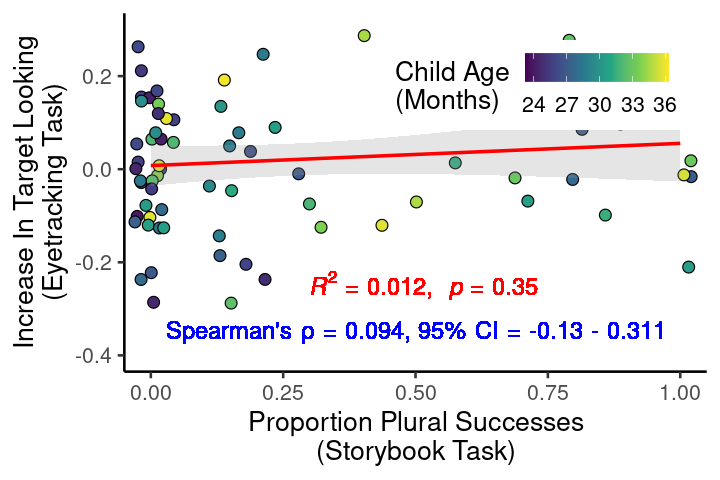

In [243]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(subset(exre, age_in_months > 20 & age_in_months < 40))  + geom_jitter(
aes(x=broad_score, y=prop_looks_to_target, fill=age_in_months), alpha = 1,
    colour="black",pch=21, size=3, width = .03, height =.03
) + scale_fill_continuous(type = "viridis", name = "Child Age\n(Months)") + theme_classic(
    base_size = 16
)+ theme(legend.position = c(0.7, 0.8), legend.direction = 'horizontal') + xlab(
    'Proportion Plural Successes\n(Storybook Task)') + ylab(
    'Increase In Target Looking\n(Eyetracking Task)') + coord_cartesian(xlim=c(0,1), 
    ylim =c(-.4,.3)) + geom_smooth(aes(x=broad_score, prop_looks_to_target), method='lm',
    color='red', alpha=.25) + geom_text(x = .5, y = -.25, label = lm_eqn(df), parse = TRUE,
    size = 5, color = 'red') + geom_text(x = .5, y = -.35, label = spear_eqn(tvc), parse = TRUE,
    size = 5, color = 'blue')

ggsave('figures/expressive_vs_receptive.pdf', width=6, height=4)
#[ ] add the R-squared
#[ ] Add Spearman's rho
#+ geom_hline(yintercept=0, color = 'red', linetype = 'dashed')

In [244]:
nrow(exre)

[1] 94

Warning message:
“Removed 19 rows containing missing values (geom_point).”


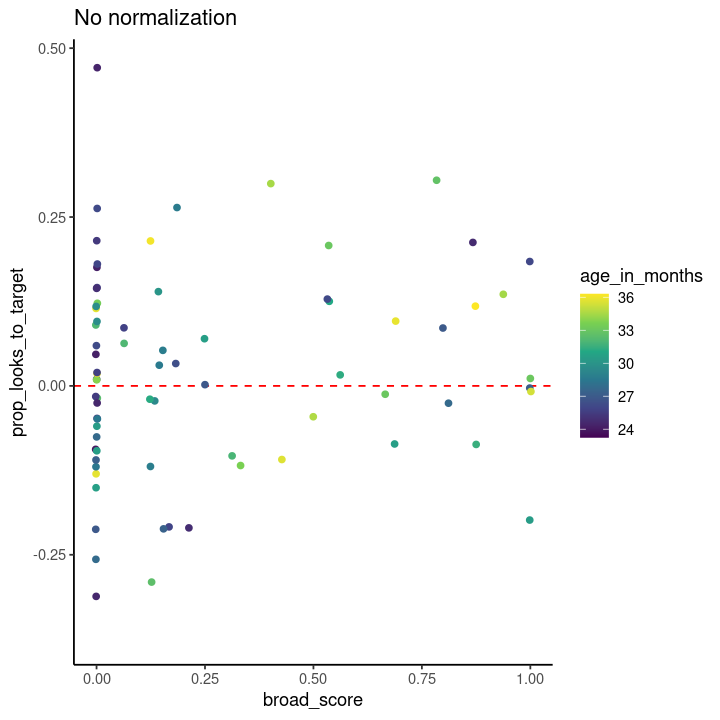

In [245]:
options(repr.plot.width=6, repr.plot.height=6)
ggplot(exre) + geom_hline(yintercept=0,  color = 'red', linetype = 'dashed') + geom_jitter(
aes(x=broad_score, y=prop_looks_to_target, colour=age_in_months)
) + scale_colour_continuous(type = "viridis") + theme_classic() + ggtitle('No normalization')

In [246]:
child_receptive_scores = subset(all_scores, normalizeMethod == 'preceding' & contrast_type == '1-way')
exre = merge(subject_info, child_receptive_scores, by='participant_name')
head(exre)

,participant_name,id,include_eyetracking,include_storybook,filename,age_in_days,gender,type.x,expt_version.x,group,⋯,broad_score,narrow_score,type.y,contrast_type,prob,prop_looks_to_target,thresholded,partition_name,normalizeMethod,expt_version.y
,<chr>,<chr>,<dbl>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,⋯,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<fct>
1,019e5595-bffa-4ab1-935c-a501119f1380,019e5595-bffa-4ab1-935c-a501119f1380,1,1,019e5595-bffa-4ab1-935c-a501119f1380,732,NA,child,agreement-lookit,NA,⋯,0.0000000,NaN,child,1-way,0.9999895,-0.037132552,Does not demonstrate RK! (p > .33),1-way: All,preceding,agreement-lookit
2,051d85eb-5513-4d58-b2b9-0a16d27a64d8,051d85eb-5513-4d58-b2b9-0a16d27a64d8,1,1,051d85eb-5513-4d58-b2b9-0a16d27a64d8,731,NA,child,agreement-lookit,NA,⋯,NA,NA,child,1-way,1.0000000,0.013874601,Does not demonstrate RK! (p > .33),1-way: All,preceding,agreement-lookit
3,0b51e58f-72dc-4f65-aea9-c36eddf418df,0b51e58f-72dc-4f65-aea9-c36eddf418df,1,1,0b51e58f-72dc-4f65-aea9-c36eddf418df,977,NA,child,agreement-lookit,NA,⋯,0.0000000,0.0,child,1-way,0.9999394,-0.190258430,Does not demonstrate RK! (p > .33),1-way: All,preceding,agreement-lookit
4,13badd8d-0051-49d4-80a7-1d61a1ec2cce,13badd8d-0051-49d4-80a7-1d61a1ec2cce,1,1,13badd8d-0051-49d4-80a7-1d61a1ec2cce,871,NA,child,agreement-lookit,NA,⋯,0.1428571,1.0,child,1-way,1.0000000,-0.003135973,Does not demonstrate RK! (p > .33),1-way: All,preceding,agreement-lookit
5,1e04539d-c09d-4f71-96a4-5e01bb073d67,1e04539d-c09d-4f71-96a4-5e01bb073d67,1,1,1e04539d-c09d-4f71-96a4-5e01bb073d67,1052,NA,child,agreement-lookit,NA,⋯,0.4000000,0.4,child,1-way,0.9999996,0.096290138,Does not demonstrate RK! (p > .33),1-way: All,preceding,agreement-lookit
6,1e8ae9b0-6b68-4636-a983-4e53b2522fce,1e8ae9b0-6b68-4636-a983-4e53b2522fce,1,1,1e8ae9b0-6b68-4636-a983-4e53b2522fce,749,NA,child,agreement-lookit,NA,⋯,0.0000000,NaN,child,1-way,1.0000000,-0.218454513,Does not demonstrate RK! (p > .33),1-way: All,preceding,agreement-lookit


Warning message:
“Removed 51 rows containing missing values (geom_point).”


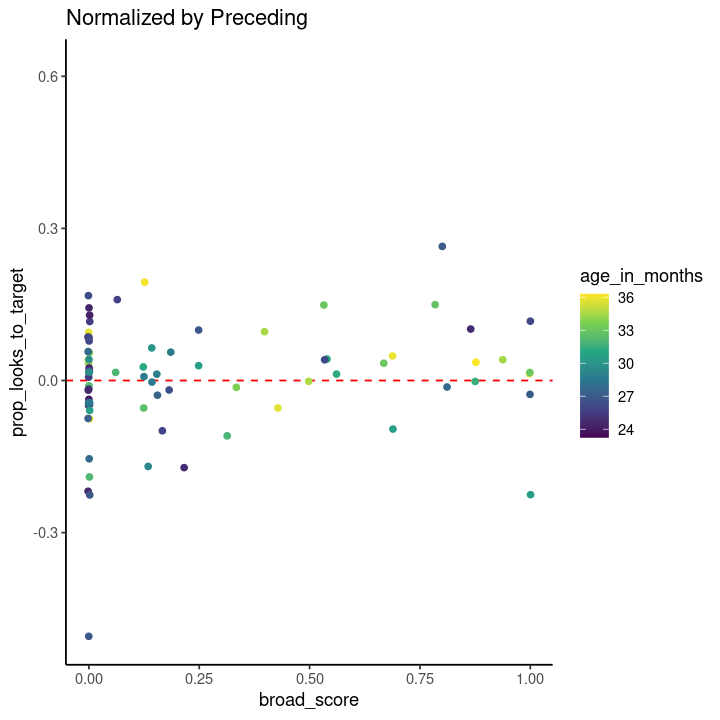

In [247]:
options(repr.plot.width=6, repr.plot.height=6)
ggplot(exre) + geom_hline(yintercept=0,  color = 'red', linetype = 'dashed') + geom_jitter(
aes(x=broad_score, y=prop_looks_to_target, colour=age_in_months)
) + scale_colour_continuous(type = "viridis") + theme_classic() + ggtitle('Normalized by Preceding')

# Logistic Regression Models for Production

In [248]:
nrow(p_coded)

[1] 1648

In [249]:
names(p_coded)

[1] "Lemma"                "child"                "itemId"              
 [4] "Singular.description" "Singular.Code"        "Plural.Description"  
 [7] "Plural.Code"          "Comments"             "X"                   
[10] "novel_id"             "background_context"   "vowel_carrier"       
[13] "full_carrier"         "s_carrier"            "s_punct"             
[16] "s_wav_index"          "s_sentence"           "pl_form"             
[19] "pl_carrier"           "pl_punct"             "pl_wav_index"        
[22] "pl_sentence"          "novelty"              "voicing"             
[25] "simple_pl_stim"       "simple_s_stim"        "animacyStatus"       
[28] "test_index"           "trial_index"          "Trial"               
[31] "Practice"             "NovelColor"           "book"

In [250]:
p_coded = merge(p_coded, subject_info[,c('participant_name','age_in_months')], by.x='child',
     by.y='participant_name')

In [251]:
# downsampling process from the original code
p_coded$s_success = NA 
p_coded$s_success[p_coded$Singular.Code %in% c(5)] = 1
p_coded$s_success[p_coded$Singular.Code %in% seq(1,4)] = 0
p_coded$pl_success = NA 
p_coded$pl_success[p_coded$Plural.Code %in% c(7,8)] = 1
p_coded$pl_success[p_coded$Plural.Code %in% seq(1,6)] = 0
p_coded$age_in_months_c = p_coded$age_in_months - 30

## Singular Production

In [252]:
table(p_coded$s_success)


   0    1 
 251 1372 

In [ ]:
tvc

In [253]:
numTrialsInSingularLM = nrow(p_coded)
tvc = update_texvar_cache(tvc, 'numTrialsInSingularLM', numTrialsInSingularLM)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [254]:
singular_lm_data = p_coded
singular_lm_data$novelty = binarize(singular_lm_data$novelty,c('familiar','novel'))
singular_lm_data$voicing = binarize(singular_lm_data$voicing,c('voiceless','voiced'))
singular_lm_data$animacyStatus = binarize(singular_lm_data$animacy,c('inanimate','animate'))

[1] "familiar" "novel"   
[1] "voiceless" "voiced"   
[1] "inanimate" "animate"  


In [255]:
head(singular_lm_data[,c('novelty','voicing','animacyStatus','age_in_months_c')])

,novelty,voicing,animacyStatus,age_in_months_c
,<dbl>,<dbl>,<dbl>,<dbl>
1,0.5,0.5,0.5,-6
2,-0.5,-0.5,-0.5,-6
3,0.5,0.5,-0.5,-6
4,0.5,0.5,0.5,-6
5,-0.5,0.5,0.5,-6
6,-0.5,-0.5,-0.5,-6


In [256]:
table(singular_lm_data$animacyStatus)


-0.5  0.5 
 824  824 

In [257]:
# brms
singular_brm <- brm(s_success  ~ novelty * voicing * animacyStatus * age_in_months_c +    
    (novelty * voicing * animacyStatus | child) + (age_in_months_c|itemId), 
       data = singular_lm_data, family = bernoulli)

#singular_lm
#https://www.jamesrrae.com/post/bayesian-logistic-regression-using-brms-part-1/
# age by  itemId slopes -- these are crazy noisy

Warning message:
“Rows containing NAs were excluded from the model.”
Compiling Stan program...

Start sampling




SAMPLING FOR MODEL '53c6d35eaae0a626d4e0e4cc4fb01e66' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.00123 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 12.3 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 46.8807 seconds (Warm-up)
Chain 1:                28.2944 seconds (Sampling)
Ch

In [258]:
fixef(singular_brm)

,Estimate,Est.Error,Q2.5,Q97.5
Intercept,3.88965640,0.46756952,3.04510560,4.889829647
novelty,-0.37088687,0.43151583,-1.20295444,0.501199914
voicing,-0.26559386,0.31148538,-0.86798564,0.364109085
animacyStatus,-0.27084578,0.30283629,-0.88522742,0.321424859
age_in_months_c,0.28804674,0.10523045,0.08306618,0.499597742
novelty:voicing,-0.42709670,0.74048620,-1.87034610,1.054762186
novelty:animacyStatus,-0.20160197,0.66349072,-1.51719026,1.124922653
voicing:animacyStatus,-0.06571563,0.69380871,-1.49420565,1.244871789
novelty:age_in_months_c,-0.11717664,0.08801378,-0.29067427,0.054624748
voicing:age_in_months_c,-0.03904232,0.07336160,-0.18414729,0.104994523


In [259]:
s_effects = as.data.frame(fixef(singular_brm))
subset(s_effects, s_effects$Q2.5 > 0 | s_effects$Q97.5 < 0)

,Estimate,Est.Error,Q2.5,Q97.5
,<dbl>,<dbl>,<dbl>,<dbl>
Intercept,3.8896564,0.4675695,3.04510560,4.889829647
age_in_months_c,0.2880467,0.1052305,0.08306618,0.499597742
voicing:animacyStatus:age_in_months_c,-0.3056732,0.1564240,-0.62674508,-0.005716674


## Plural Production

In [260]:
table(subset(p_coded, Singular.Code ==5)$pl_success)


  0   1 
987 374 

In [261]:
numTrialsInPluralLM = nrow(subset(p_coded, Singular.Code ==5))
numTrialsInPluralLM
tvc = update_texvar_cache(tvc, 'numTrialsInPluralLM', numTrialsInPluralLM)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

[1] 1372

In [262]:
print(p_coded[1,])

                                 child Lemma itemId Singular.description
1 019e5595-bffa-4ab1-935c-a501119f1380   nug     21                 nohg
  Singular.Code Plural.Description Plural.Code Comments    X novel_id
1             5               nohg           5          <NA> 2056-600
  background_context vowel_carrier                  full_carrier
1               hill   on the hill Can you find the  on the hill
          s_carrier s_punct s_wav_index
1 Can you find the        ?          21
                                    s_sentence pl_form        pl_carrier
1 21. nug... Can you find the nug on the hill?    nugs Can you find the 
  pl_punct pl_wav_index                                    pl_sentence novelty
1        ?           29 29. nugs... Can you find the nugs on the hill?   novel
  voicing          simple_pl_stim          simple_s_stim animacyStatus
1  voiced Can you find the  nugs? Can you find the  nug?       animate
  test_index trial_index Trial Practice NovelColor book ag

In [263]:
plural_lm_data = subset(p_coded, Singular.Code ==5)
plural_lm_data$novelty = binarize(plural_lm_data$novelty,c('familiar','novel'))
plural_lm_data$voicing = binarize(plural_lm_data$voicing,c('voiceless','voiced'))
plural_lm_data$animacyStatus = binarize(plural_lm_data$animacy,c('inanimate','animate'))


[1] "familiar" "novel"   
[1] "voiceless" "voiced"   
[1] "inanimate" "animate"  


In [ ]:
# brm(s_success  ~ novelty * voicing * animacyStatus * age_in_months_c +    
#     (novelty * voicing * animacyStatus | child) +(1|itemId), 
#        data = singular_lm_data, family = bernoulli)

In [264]:
plural_brm <- brm(pl_success  ~ novelty * voicing * animacyStatus * age_in_months_c +
     (novelty * voicing * animacyStatus | child) +(age_in_months_c|itemId), 
       data = plural_lm_data, family = bernoulli)


Warning message:
“Rows containing NAs were excluded from the model.”
Compiling Stan program...

recompiling to avoid crashing R session

Start sampling




SAMPLING FOR MODEL '53c6d35eaae0a626d4e0e4cc4fb01e66' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.00095 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 9.5 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 42.9078 seconds (Warm-up)
Chain 1:                23.3739 seconds (Sampling)
Cha

In [265]:
pl_effects = as.data.frame(fixef(plural_brm))
subset(pl_effects, pl_effects$Q2.5 > 0 | pl_effects$Q97.5 < 0)

,Estimate,Est.Error,Q2.5,Q97.5
,<dbl>,<dbl>,<dbl>,<dbl>
Intercept,-3.1839722,0.5569407,-4.3657421,-2.1923412
novelty,-1.3988144,0.4789561,-2.4345157,-0.5517366
age_in_months_c,0.3935259,0.1383441,0.1301473,0.6742281


In [266]:
singular_brm

 Family: bernoulli 
  Links: mu = logit 
Formula: s_success ~ novelty * voicing * animacyStatus * age_in_months_c + (novelty * voicing * animacyStatus | child) + (age_in_months_c | itemId) 
   Data: singular_lm_data (Number of observations: 1496) 
  Draws: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup draws = 4000

Group-Level Effects: 
~child (Number of levels: 95) 
                                                         Estimate Est.Error
sd(Intercept)                                                3.16      0.41
sd(novelty)                                                  1.29      0.44
sd(voicing)                                                  0.34      0.25
sd(animacyStatus)                                            0.34      0.25
sd(novelty:voicing)                                          1.70      0.87
sd(novelty:animacyStatus)                                    1.07      0.74
sd(voicing:animacyStatus)                                  

In [267]:
#exp(-.7) 1/2 as likely to produce a nocal plural
exp(-3.2)  #1/20 as likely to produce a novel plural at 30 months

[1] 0.0407622

In [268]:
#at 30 months, odds of producing a novel plural
exp(-3.3 + (0*.75) + (0*.48)) 

[1] 0.03688317

In [ ]:
# contrasts(plural_lm_data$novelty) = contr.sum
# contrasts(plural_lm_data$animacyStatus) = contr.sum
# contrasts(plural_lm_data$voicing) = contr.sum

In [270]:
source('PLEARN_analysis_helper.R')
storybook_lm_mixed_effects = rbind(prepModelForDWPlot(singular_brm) %>% mutate(model = "Singular"),
      prepModelForDWPlot(plural_brm) %>% mutate(model = "Plural")) 

keeps = union(unique(subset(storybook_lm_mixed_effects, !interaction)$term),
                 unique(subset(storybook_lm_mixed_effects, sig)$term))
storybook_lm_mixed_effects = subset(storybook_lm_mixed_effects, term %in% keeps)            
storybook_lm_mixed_effects
# if it is not matched, we lose a predictor

,Estimate,Est.Error,Q2.5,Q97.5,term,group,interaction,sig,model
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,<lgl>,<chr>
Intercept,3.8896564,0.4675695,3.04510560,4.889829647,Intercept,fixed,FALSE,TRUE,Singular
novelty,-0.3708869,0.4315158,-1.20295444,0.501199914,novelty,fixed,FALSE,FALSE,Singular
voicing,-0.2655939,0.3114854,-0.86798564,0.364109085,voicing,fixed,FALSE,FALSE,Singular
animacyStatus,-0.2708458,0.3028363,-0.88522742,0.321424859,animacyStatus,fixed,FALSE,FALSE,Singular
age_in_months_c,0.2880467,0.1052305,0.08306618,0.499597742,age_in_months_c,fixed,FALSE,TRUE,Singular
voicing:animacyStatus:age_in_months_c,-0.3056732,0.1564240,-0.62674508,-0.005716674,voicing:animacyStatus:age_in_months_c,fixed,TRUE,TRUE,Singular
Intercept1,-3.1839722,0.5569407,-4.36574208,-2.192341228,Intercept,fixed,FALSE,TRUE,Plural
novelty1,-1.3988144,0.4789561,-2.43451566,-0.551736620,novelty,fixed,FALSE,TRUE,Plural
voicing1,0.5113506,0.3466285,-0.14892927,1.223248707,voicing,fixed,FALSE,FALSE,Plural


In [271]:
relabel_terms = function(df, colname){
    remap = list()
    remap[['Intercept']] = 'Intercept'
    remap[['novelty']] = "Novelty\n(familiar vs. novel)"
    remap[['voicing']] = "Voicing\n(/s/ vs. /z/)"
    remap[['animacyStatus']] = "Animacy\n(inanimate vs. animate)"
    remap[['age_in_months_c']] = "Child Age\n(in months, centered at 30)"
    remap[['novelty:age_in_months_c']] = "Novelty x Child Age"
    remap[['trial_index']] = 'Trial Order'
    
    df[[colname]] = sapply(df$term, function(x){remap[[x]]})
    df[[colname]] = factor(df[[colname]], levels = rev(c(
        'Intercept',
        "Novelty\n(familiar vs. novel)",
        "Voicing\n(/s/ vs. /z/)",
        "Animacy\n(inanimate vs. animate)",
        "Child Age\n(in months, centered at 30)",        
        "Novelty x Child Age",
        "Trial Order"
    )))
    return(df)
}    
storybook_lm_mixed_effects = relabel_terms(storybook_lm_mixed_effects,'term')


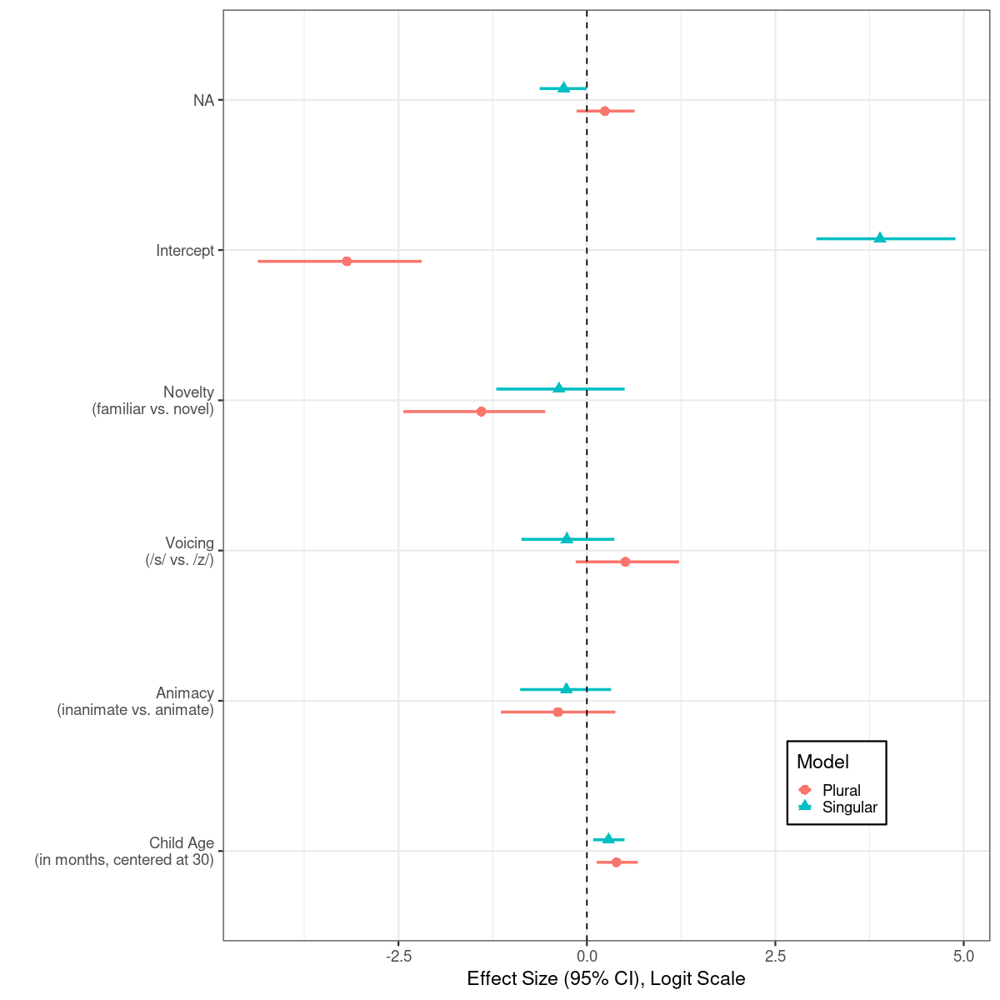

In [272]:
options(repr.plot.width=10, repr.plot.height=10)
ggplot(as.data.frame(storybook_lm_mixed_effects) 
    ) + geom_errorbarh(aes(xmin=Q2.5, xmax=Q97.5,y=term, color=model), size=1,
        height=0, position=ggstance::position_dodgev(height=0.3)
    ) + geom_point(aes(x=Estimate,y=term, color=model, shape=model),
        position=ggstance::position_dodgev(height=0.3), size=3) + theme_bw(base_size=14
    ) + geom_vline(xintercept=0, lty=2) + xlab('Effect Size (95% CI), Logit Scale'
    ) + ylab('') + theme(
    legend.key.size = unit(.4, "cm"),
    legend.position = c(.8,.17), 
    legend.background = element_rect(fill="white", linetype="solid", 
                                  colour ="black")
    ) +  scale_shape_discrete(name = "Model") +  scale_color_discrete(name = "Model")

ggsave('figures/brms_storybook_lmem.pdf', width=5,height=3.2) 





In [274]:
tvc = get_texvar_from_beta(singular_brm, 'novelty','singularLMnovelty', tvc)
tvc = get_texvar_from_beta(plural_brm, 'novelty','pluralLMnovelty', tvc)
tvc = get_texvar_from_beta(plural_brm, 'novelty:age_in_months_c','pluralLMAgeNovelty', tvc)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [275]:
# augment the results so that dwplot can produce them correctly
singular_lm_aug = recoverIntercept(singular_lm) %>% mutate(model = "Singular")
plural_lm_aug = recoverIntercept(plural_lm) %>% mutate(model = "Plural")

ERROR: Error in recoverIntercept(singular_lm): could not find function "recoverIntercept"


In [ ]:
sum(singular_lm_data$Singular.Code ==5, na.rm=T) / 
length(singular_lm_data$Singular.Code[!is.na(
    singular_lm_data$Singular.Code)])
# produce the singular ~83% of the time

In [ ]:
nrow(subset(plural_lm_data, Plural.Code == 5 & Singular.Code ==5)) / nrow(subset(
    plural_lm_data, Singular.Code ==5))
# produce the plural ~24% of the time on plural trials

In [ ]:
nrow(subset(plural_lm_data, Plural.Code == 8 & Singular.Code ==5)) / nrow(subset(
    plural_lm_data, Singular.Code ==5))
# produce the plural ~24% of the time on plural trials

In [ ]:
sum(subset(plural_lm_data, novelty == -.5 & Singular.Code == 5)$Plural.Code == 8) / 
    nrow(subset(plural_lm_data, novelty == .5 & Singular.Code == 5))
# produce the novel plural ~20% of the time

In [ ]:
sum(subset(plural_lm_data, novelty == .5 & Singular.Code == 5)$Plural.Code == 8) / 
    nrow(subset(plural_lm_data, novelty == .5 & Singular.Code == 5))
# produce the novel plural ~20% of the time

In [ ]:
.19 / ((.28 + .19)/2) #80% as likely to produce a novel plural

In [ ]:
# correct interpretation of beta contribution to odds

In [ ]:
exp(3*.45)

# Age vs. Plural Knowledge

In [276]:
code_counts_with_age = merge(subject_info, code_counts, by.x='id', by.y='child')
code_counts_with_age = merge(code_counts_with_age, codes)
head(code_counts_with_age)

,code,description,id,participant_name,include_eyetracking,include_storybook,filename,age_in_days,gender,type,⋯,double_validated,comments,trial_order,age_in_months,ran_participant,in_study,broad_score,narrow_score,count,s_pl
,<chr>,<fct>,<chr>,<chr>,<dbl>,<int>,<chr>,<int>,<chr>,<chr>,⋯,<lgl>,<chr>,<int>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<fct>
1,0,No data (0),765d8cc5-efaf-4599-aa55-c48e43f46dc5,765d8cc5-efaf-4599-aa55-c48e43f46dc5,1,1,765d8cc5-efaf-4599-aa55-c48e43f46dc5,732,NA,child,⋯,NA,passes,1,24.00000,TRUE,TRUE,NA,NA,1,plural
2,0,No data (0),1e04539d-c09d-4f71-96a4-5e01bb073d67,1e04539d-c09d-4f71-96a4-5e01bb073d67,1,1,1e04539d-c09d-4f71-96a4-5e01bb073d67,1052,NA,child,⋯,NA,98.33% coverage,1,34.49180,TRUE,TRUE,0.4000000,0.4,9,plural
3,0,No data (0),pl85,pl85,1,1,pl85_fixations.txt,748,F,child,⋯,NA,NA,NA,24.52459,TRUE,TRUE,0.0000000,0.0,1,plural
4,0,No data (0),pl37,pl37,1,1,pl37_fixations.xlsx,1086,M,child,⋯,NA,NA,NA,35.60656,TRUE,TRUE,0.4285714,1.0,1,plural
5,0,No data (0),pl90,pl90,1,1,pl90_fixations.txt,846,M,child,⋯,NA,NA,NA,27.73770,TRUE,TRUE,0.0000000,0.0,2,plural
6,0,No data (0),pl23,pl23,0,1,pl23_fixations.xlsx,850,M,child,⋯,NA,NA,NA,27.86885,TRUE,TRUE,0.4666667,1.0,1,plural


In [277]:
children_in_age_range = subset(code_counts_with_age, type == 'child' & in_study)

In [278]:
cor(children_in_age_range$broad_score,children_in_age_range$age_in_days, 
    use="pairwise.complete.obs")

[1] 0.4134569

In [279]:
length(unique(children_in_age_range$participant_name))

[1] 96

In [280]:
#code_counts_with_age is much less than subject_info
length(unique(subset(children_in_age_range, !is.na(narrow_score))$participant_name))
# it is the age range filtering and the absence of narrow scores

[1] 61

Warning message:
“position_stack requires non-overlapping x intervals”
Warning message:
“position_stack requires non-overlapping x intervals”


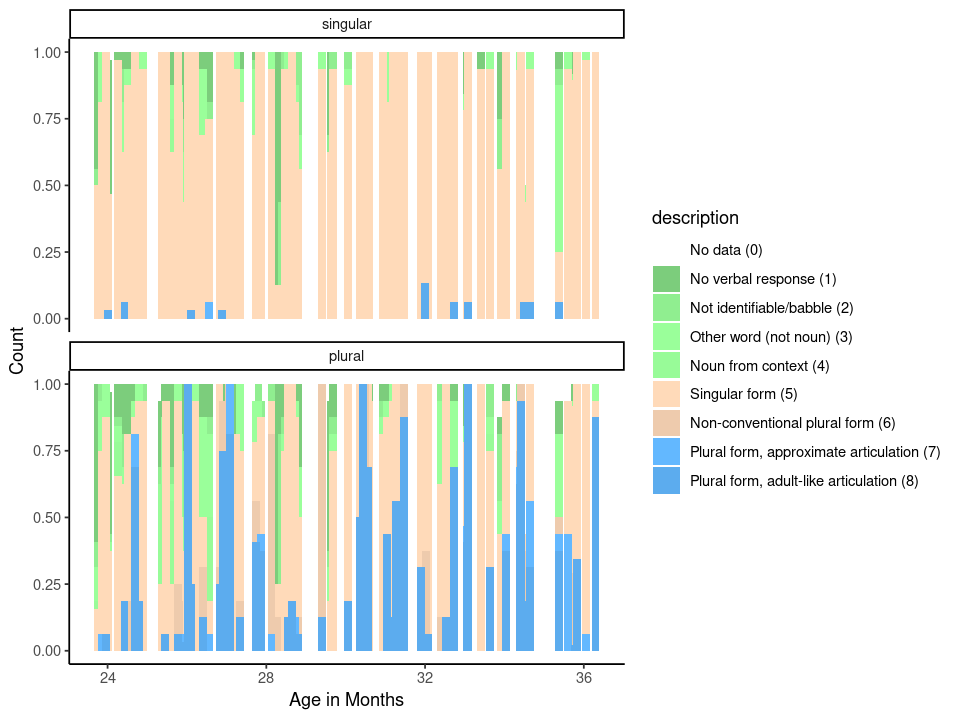

In [281]:
# this is superseded below by collapsing across kids within each age range
options(repr.plot.width=8, repr.plot.height=6)
ggplot(children_in_age_range) + geom_bar(
aes(x=age_in_months, y=count, fill=description),
stat="identity",  width = 0.2, position="fill"
) + scale_fill_manual(values = rep(c("white", "palegreen3", "palegreen2", "palegreen1",
"palegreen", "peachpuff1", "peachpuff2", "steelblue1","steelblue2"), 2)) + facet_wrap(~s_pl, nrow=2) + xlab('Age in Months') + ylab('Count'
) + theme_classic() 

In [282]:
# simplify the coloration of the above
remap = list()
remap[['0']] = 'No Data'
remap[['1']] = 'No Response / Not Relevant'
remap[['2']] = 'No Response / Not Relevant'
remap[['3']] = 'No Response / Not Relevant'
remap[['4']] = 'No Response / Not Relevant'
remap[['5']] = 'Singular'
remap[['6']] = 'Non-Conventional Plural'
remap[['7']] = 'Plural'
remap[['8']] = 'Plural'

children_in_age_range$recode =
sapply(children_in_age_range$code, function(x){remap[[as.character(x)]]})
children_in_age_range$recode = factor(children_in_age_range$recode,
    levels = c('No Data', 'No Response / Not Relevant', 'Singular',
               'Non-Conventional Plural','Plural'))

In [ ]:
# aggreagate each category within each 4-month group; mean + sd; two kinds of lines
# mean + sd for each
# median for each? in many cases, it will 
# familiars and plurals as two separate panels

In [283]:
subset(subject_info, participant_name == 'pl04')

,participant_name,id,include_eyetracking,include_storybook,filename,age_in_days,gender,type,expt_version,group,⋯,main_validated,double_coder,double_validated,comments,trial_order,age_in_months,ran_participant,in_study,broad_score,narrow_score
,<chr>,<chr>,<dbl>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,⋯,<chr>,<lgl>,<lgl>,<chr>,<int>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>
55,pl04,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,0.06666667,0.08333333


In [285]:
subject_info$age_group = sapply(subject_info$age_in_months,
    function(x){
        if (is.na(x)){
            return('No age')
        } else {
            if (x < 28){
                return('24-28')
            } else if (x < 32){
                return('28-32')
            } else {
                return('32-36')
            }
        }
    })

In [286]:
names(children_in_age_range)
# need to aggregaye split by novelty

[1] "code"                "description"         "id"                 
 [4] "participant_name"    "include_eyetracking" "include_storybook"  
 [7] "filename"            "age_in_days"         "gender"             
[10] "type"                "expt_version"        "group"              
[13] "order"               "comment"             "main_coder"         
[16] "main_validated"      "double_coder"        "double_validated"   
[19] "comments"            "trial_order"         "age_in_months"      
[22] "ran_participant"     "in_study"            "broad_score"        
[25] "narrow_score"        "count"               "s_pl"               
[28] "recode"

In [287]:
p_coded_aug = merge(p_coded, subject_info[,c('id','age_group')], by.x='child', by.y='id')

In [288]:
head(p_coded_aug)

,child,Lemma,itemId,Singular.description,Singular.Code,Plural.Description,Plural.Code,Comments,X,novel_id,⋯,trial_index,Trial,Practice,NovelColor,book,age_in_months,s_success,pl_success,age_in_months_c,age_group
,<chr>,<chr>,<dbl>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,019e5595-bffa-4ab1-935c-a501119f1380,tig,31,tig,5,<fuss>,1,,NA,2057-600,⋯,12,15,n,blue,1,24,1,0,-6,24-28
2,019e5595-bffa-4ab1-935c-a501119f1380,cat,4,<fuss>,1,<fuss>,1,,NA,!,⋯,5,16,n,!,1,24,0,0,-6,24-28
3,019e5595-bffa-4ab1-935c-a501119f1380,gub,16,goub,5,goub,5,,NA,2040-600,⋯,9,3,n,blue,1,24,1,0,-6,24-28
4,019e5595-bffa-4ab1-935c-a501119f1380,gop,15,gop,5,gop,5,,NA,2010-600,⋯,14,2,n,red,1,24,1,0,-6,24-28
5,019e5595-bffa-4ab1-935c-a501119f1380,truck,32,tuck,5,tuck,5,,NA,!,⋯,8,11,n,!,1,24,1,0,-6,24-28
6,019e5595-bffa-4ab1-935c-a501119f1380,tep,30,tep,5,tup,5,,NA,2005-600,⋯,16,8,n,red,1,24,1,0,-6,24-28


In [289]:
p_coded_aug$singular_recode =
sapply(p_coded_aug$Singular.Code, function(x){remap[[as.character(x)]]})
p_coded_aug$singular_recode = factor(p_coded_aug$singular_recode,
    levels = c('No Data', 'No Response / Not Relevant', 'Singular',
               'Non-Conventional Plural','Plural'))

p_coded_aug$plural_recode =
sapply(p_coded_aug$Plural.Code, function(x){remap[[as.character(x)]]})
p_coded_aug$plural_recode = factor(p_coded_aug$plural_recode,
    levels = c('No Data', 'No Response / Not Relevant', 'Singular',
               'Non-Conventional Plural','Plural'))

In [290]:
sing_counts = aggregate(itemId ~ singular_recode + novelty + age_group, p_coded_aug, length)
names(sing_counts)[1] = 'code'
names(sing_counts)[length(names(sing_counts))] = 'count'
sing_counts$s_pl = 'Singular Trials'
pl_counts = aggregate(itemId ~ plural_recode + novelty  + age_group, p_coded_aug, length)
names(pl_counts)[1] = 'code'
names(pl_counts)[length(names(pl_counts))] = 'count'
pl_counts$s_pl = 'Plural Trials'
code_counts = rbind(sing_counts,pl_counts)
code_counts$novelty = as.character(code_counts$novelty)
code_counts$novelty[code_counts$novelty == 'familiar'] = 'Familiar Object Words'
code_counts$novelty[code_counts$novelty == 'novel'] = 'Novel Object Words'
head(code_counts)

,code,novelty,age_group,count,s_pl
,<fct>,<chr>,<chr>,<int>,<chr>
1,No Data,Familiar Object Words,24-28,2,Singular Trials
2,No Response / Not Relevant,Familiar Object Words,24-28,73,Singular Trials
3,Singular,Familiar Object Words,24-28,265,Singular Trials
4,Plural,Familiar Object Words,24-28,4,Singular Trials
5,No Response / Not Relevant,Novel Object Words,24-28,80,Singular Trials
6,Singular,Novel Object Words,24-28,263,Singular Trials


In [292]:
#child count also
child_sing_counts = aggregate(child ~ singular_recode + novelty + age_group, p_coded_aug, 
    function(x){length(unique(x))})
names(child_sing_counts)[1] = 'code'
names(child_sing_counts)[length(names(child_sing_counts))] = 'child_count'
child_sing_counts$s_pl = 'Singular Trials'
child_pl_counts = aggregate(child ~ plural_recode + novelty + age_group, p_coded_aug, 
    function(x){length(unique(x))})
names(child_pl_counts)[1] = 'code'
names(child_pl_counts)[length(names(child_pl_counts))] = 'child_count'
child_pl_counts$s_pl = 'Plural Trials'
child_code_counts = rbind(child_sing_counts,child_pl_counts)
child_code_counts$novelty = as.character(child_code_counts$novelty)
child_code_counts$novelty[child_code_counts$novelty == 'familiar'] = 'Familiar Object Words'
child_code_counts$novelty[child_code_counts$novelty == 'novel'] = 'Novel Object Words'
head(child_code_counts)


,code,novelty,age_group,child_count,s_pl
,<fct>,<chr>,<chr>,<int>,<chr>
1,No Data,Familiar Object Words,24-28,2,Singular Trials
2,No Response / Not Relevant,Familiar Object Words,24-28,22,Singular Trials
3,Singular,Familiar Object Words,24-28,38,Singular Trials
4,Plural,Familiar Object Words,24-28,4,Singular Trials
5,No Response / Not Relevant,Novel Object Words,24-28,23,Singular Trials
6,Singular,Novel Object Words,24-28,40,Singular Trials


In [293]:
both_code_counts = merge(code_counts, child_code_counts, all=T)
both_code_counts[is.na(both_code_counts)] = 0
both_code_counts$label = paste0(both_code_counts$count,' (',both_code_counts$child_count,')')
head(both_code_counts)

,code,novelty,age_group,s_pl,count,child_count,label
,<fct>,<chr>,<chr>,<chr>,<int>,<int>,<chr>
1,No Data,Familiar Object Words,24-28,Plural Trials,4,4,4 (4)
2,No Data,Familiar Object Words,24-28,Singular Trials,2,2,2 (2)
3,No Data,Familiar Object Words,32-36,Plural Trials,6,3,6 (3)
4,No Data,Familiar Object Words,32-36,Singular Trials,4,1,4 (1)
5,No Data,Novel Object Words,24-28,Plural Trials,5,5,5 (5)
6,No Data,Novel Object Words,28-32,Plural Trials,2,2,2 (2)


In [294]:
# total child counts per time interval
interval_child_counts = aggregate(child ~ novelty  + age_group, p_coded_aug, 
    function(x){length(unique(x))})
interval_child_counts = rbind(interval_child_counts, interval_child_counts)
interval_child_counts$s_pl = c(rep('Plural Trials', 6), rep('Singular Trials', 6)) 
names(interval_child_counts)[names(interval_child_counts) == 'child'] = 'children_per_interval'
interval_child_counts$novelty = as.character(interval_child_counts$novelty)
interval_child_counts$novelty[interval_child_counts$novelty == 'familiar'] = 'Familiar Object Words'
interval_child_counts$novelty[interval_child_counts$novelty == 'novel'] = 'Novel Object Words'
interval_child_counts

novelty,age_group,children_per_interval,s_pl
<chr>,<chr>,<int>,<chr>
Familiar Object Words,24-28,43,Plural Trials
Novel Object Words,24-28,43,Plural Trials
Familiar Object Words,28-32,26,Plural Trials
Novel Object Words,28-32,26,Plural Trials
Familiar Object Words,32-36,27,Plural Trials
Novel Object Words,32-36,27,Plural Trials
Familiar Object Words,24-28,43,Singular Trials
Novel Object Words,24-28,43,Singular Trials
Familiar Object Words,28-32,26,Singular Trials


In [295]:
both_code_counts = merge(both_code_counts, interval_child_counts)

In [296]:
both_code_counts$age_group_label = paste0(both_code_counts$age_group, '\n(n = ',
    both_code_counts$children_per_interval,')')

In [297]:
# recompute these as proportions
non_missing_code_counts = subset(both_code_counts, code != 'No Data')

code_props = do.call('rbind', lapply(split(non_missing_code_counts, list(non_missing_code_counts$novelty,
    non_missing_code_counts$age_group, non_missing_code_counts$s_pl)), function(df){
    total = sum(df$count)
    df$prop = df$count / total
    return(df)
}))
subset(code_props, s_pl == 'Plural Trials' & novelty == 'Novel Object Words' & age_group == '24-28')

,novelty,age_group,s_pl,code,count,child_count,label,children_per_interval,age_group_label,prop
,<chr>,<chr>,<chr>,<fct>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
Novel Object Words.24-28.Plural Trials.25,Novel Object Words,24-28,Plural Trials,Plural,44,9,44 (9),43,24-28 (n = 43),0.12979351
Novel Object Words.24-28.Plural Trials.27,Novel Object Words,24-28,Plural Trials,No Response / Not Relevant,137,35,137 (35),43,24-28 (n = 43),0.40412979
Novel Object Words.24-28.Plural Trials.28,Novel Object Words,24-28,Plural Trials,Singular,142,33,142 (33),43,24-28 (n = 43),0.41887906
Novel Object Words.24-28.Plural Trials.29,Novel Object Words,24-28,Plural Trials,Non-Conventional Plural,16,7,16 (7),43,24-28 (n = 43),0.04719764


Warning message:
“Ignoring unknown aesthetics: label”
Warning message:
“Ignoring unknown aesthetics: fill”


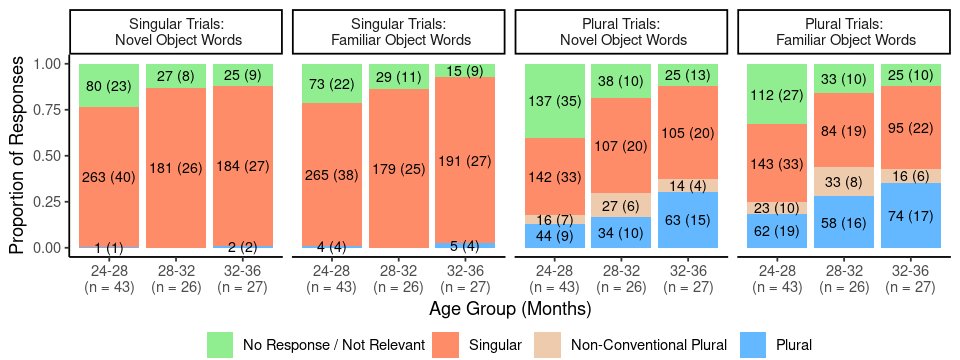

In [298]:
code_props$s_pl_by_novelty = paste0(code_props$s_pl,":\n ", code_props$novelty)
code_props$s_pl_by_novelty = factor(code_props$s_pl_by_novelty)
code_props$s_pl_by_novelty = factor(code_props$s_pl_by_novelty, levels = rev(levels(code_props$s_pl_by_novelty)))

options(repr.plot.width=8, repr.plot.height=3)
ggplot(code_props) + geom_bar(
aes(x=age_group_label, y=prop, fill=code, label=count),
stat="identity", position="stack"
) + facet_wrap(~s_pl_by_novelty, nrow=1) + xlab('Age Group (Months)') + ylab('Proportion of Responses'
) + theme_classic() + scale_fill_manual(values = rep(c("palegreen2", 
 "salmon1", "peachpuff2","steelblue1"), 2)
) + geom_text(size=3, aes(x=age_group_label, y=prop, fill=code, label=label),
          position = position_stack(vjust = 0.5)) + theme(legend.position="bottom",
    legend.title = element_blank(), legend.direction='vertical', legend.margin=margin(0,0,0,0),
        legend.box.margin=margin(-10,-5,-5,-5)) + guides(fill=guide_legend(ncol=4))
ggsave('figures/production_props.pdf', height=2.5, width=8)

In [299]:
# expect ~400 in each category
sum(subset(code_props, s_pl == 'Plural Trials' & novelty == 'Novel Object Words')$count)

[1] 752

In [ ]:
#  [] try to add the number of kids (omitting the smallest ones) in parentheticals
# [ ] may need to nudge these up

In [300]:
length(unique(subset(children_in_age_range, code %in% c(7,8) & type =='child')$id))
length(unique(subset(children_in_age_range, code %in% c(1:8)  & type =='child')$id))

[1] 57

[1] 96

In [301]:
aggregate(count ~ participant_name, subset(code_counts_with_age, code %in% c(7,8)
                                          & s_pl == 'plural'), sum)

participant_name,count
<chr>,<int>
13badd8d-0051-49d4-80a7-1d61a1ec2cce,2
151aafac-e33a-439b-9af3-b6349946d18a,1
1e04539d-c09d-4f71-96a4-5e01bb073d67,3
1ecda138-4c67-4fc6-b771-b227aa216456,16
217a8227-5356-4860-80ff-8c6dac5bbce3,1
222b347f-417e-450b-b108-6f871872f9e8,13
47b41e86-dc92-4042-942c-a1aca67cee7b,11
7dc30b41-8f08-466d-b342-7da585ba84eb,2
91fe4cd9-4225-4866-8766-da0bd1bb3f0c,13


In [302]:
nrow(subset(aggregate(count ~ participant_name, subset(children_in_age_range, code %in% c(7,8)
                                          & s_pl == 'plural'), sum), count > 8)) 

[1] 16

In [303]:
# drop backe to p_coded 
p_coded_incl = subset(p_coded, child %in% subset(subject_info, in_study)$participant_name)
names(p_coded_incl)

[1] "child"                "Lemma"                "itemId"              
 [4] "Singular.description" "Singular.Code"        "Plural.Description"  
 [7] "Plural.Code"          "Comments"             "X"                   
[10] "novel_id"             "background_context"   "vowel_carrier"       
[13] "full_carrier"         "s_carrier"            "s_punct"             
[16] "s_wav_index"          "s_sentence"           "pl_form"             
[19] "pl_carrier"           "pl_punct"             "pl_wav_index"        
[22] "pl_sentence"          "novelty"              "voicing"             
[25] "simple_pl_stim"       "simple_s_stim"        "animacyStatus"       
[28] "test_index"           "trial_index"          "Trial"               
[31] "Practice"             "NovelColor"           "book"                
[34] "age_in_months"        "s_success"            "pl_success"          
[37] "age_in_months_c"

In [304]:
nProducingAPlural = length(unique(subset(p_coded_incl, Plural.Code %in% c(7,8))$child))
nProducingAPlural
tvc = update_texvar_cache(tvc, 'nProducingAPlural', nProducingAPlural)

[1] 53

In [305]:
# Number of participants with production data
storybookNwithProductions = length(unique(p_coded_incl$child))
storybookNwithProductions
tvc = update_texvar_cache(tvc, 'storybookNwithProductions', storybookNwithProductions)

[1] 95

In [306]:
# Number that produced one or more novel plurals
nProducingNovelPlurals = length(unique(subset(p_coded_incl, Plural.Code %in% c(7,8) & novelty == 'novel' )$child))
tvc = update_texvar_cache(tvc, 'nProducingNovelPlurals', nProducingNovelPlurals)

writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [307]:
# Number that produced one or more novel singulars
nNovelSingulars = length(unique(subset(p_coded_incl, Singular.Code %in% c(5) & novelty == 'novel' )$child))
nNovelSingulars
tvc = update_texvar_cache(tvc, 'nNovelSingulars', nNovelSingulars)

[1] 92

In [308]:
# Number that produced non-conventional plurals
nNonconventionalPlurals = length(unique(subset(p_coded_incl, Plural.Code %in% c(6) & novelty == 'novel' )$child))
nNonconventionalPlurals
tvc = update_texvar_cache(tvc, 'nNonconventionalPlurals', nNonconventionalPlurals)

[1] 16

In [309]:
names(subject_info)

[1] "participant_name"    "id"                  "include_eyetracking"
 [4] "include_storybook"   "filename"            "age_in_days"        
 [7] "gender"              "type"                "expt_version"       
[10] "group"               "order"               "comment"            
[13] "main_coder"          "main_validated"      "double_coder"       
[16] "double_validated"    "comments"            "trial_order"        
[19] "age_in_months"       "ran_participant"     "in_study"           
[22] "broad_score"         "narrow_score"        "age_group"

[1] 53

Warning message:
“Ignoring unknown parameters: yintercept”


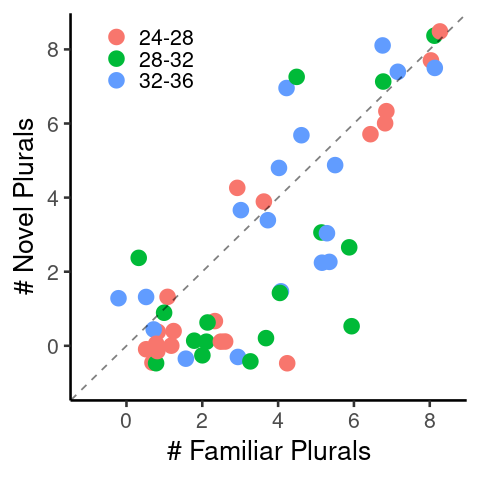

In [310]:
fam = aggregate(Plural.Code ~ child, subset(p_coded_incl, Plural.Code %in% c(7,8) & novelty == 'familiar'),
          length)
names(fam) = c('child','fam_pl')
nov = aggregate(Plural.Code ~ child, subset(p_coded_incl, Plural.Code %in% c(7,8) & novelty == 'novel'),
          length)
names(nov) = c('child','nov_pl')
combined = merge(fam, nov, all=T)
combined = merge(combined, subject_info[,c('participant_name','age_in_months','age_group')],
     by.x='child', by.y='participant_name')
nrow(combined)

combined[is.na(combined)] = 0
options(repr.plot.width=4, repr.plot.height=4)
ggplot(combined) + geom_jitter(aes(x=fam_pl, y=nov_pl, color=factor(age_group)
), width=.5, height=.5, size=4) + theme_classic(base_size=16
) + xlab('# Familiar Plurals') + ylab('# Novel Plurals') + coord_cartesian(xlim=c(-1,8.5),
    ylim=c(-1,8.5)) + geom_abline(yintercept=0, slope=1, linetype = 'dashed', alpha=.5
) + theme(
    legend.key.size = unit(.4, "cm"),
    legend.position = c(.2,.9), 
    legend.background = element_rect(fill="white", linetype="solid", 
                                  colour ="white"),
    legend.title=element_blank()
    )

ggsave('figures/familiar_vs_novel_plurals.pdf', width = 4, height=4)

In [311]:
numChildrenWithSingPl = nrow(combined)
tvc = update_texvar_cache(tvc, 'numChildrenWithSingPl', numChildrenWithSingPl)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [312]:
fam_nov_cor = cor.test(combined$fam_pl, combined$nov_pl, method='spearman')

Warning message in cor.test.default(combined$fam_pl, combined$nov_pl, method = "spearman"):
“Cannot compute exact p-value with ties”


In [313]:
fam_nov_cor$estimate

rho 
0.7642068

In [314]:
fam_nov_cor$p.value

[1] 2.777882e-11

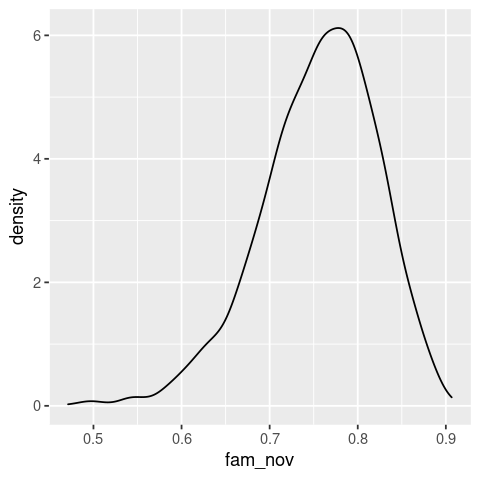

In [315]:
fam_nov = spearboot(combined, 'fam_pl', 'nov_pl', cor_method='spearman' )
ggplot(data.frame(fam_nov= t(fam_nov))) + geom_density(aes(x=fam_nov))

In [316]:
fam_nov_cor_boot_ci = quantile(t(fam_nov), c(0.025, 0.975))
fam_nov_cor_boot_ci[['2.5%']]
fam_nov_cor_boot_ci[['97.5%']]

[1] 0.6098998

[1] 0.8669102

In [317]:
tvc = update_texvar_cache(tvc, 'famNovCor', fam_nov_cor$estimate, digits=3)
tvc = update_texvar_cache(tvc, 'famNovCorP', fam_nov_cor$p.value, digits=3)
tvc = update_texvar_cache(tvc, 'famNovCorUpper', fam_nov_cor_boot_ci[['97.5%']], digits=3)
tvc = update_texvar_cache(tvc, 'famNovCorLower', fam_nov_cor_boot_ci[['2.5%']], digits=3)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [318]:
numProducingHalfNovelPlurals = nrow(subset(nov, nov_pl >= 4))
tvc = update_texvar_cache(tvc, 'numProducingHalfNovelPlurals', numProducingHalfNovelPlurals)
numProducingHalfFamiliarPlurals= nrow(subset(fam, fam_pl>= 4))
tvc = update_texvar_cache(tvc, 'numProducingHalfFamiliarPlurals', numProducingHalfFamiliarPlurals)
combined$total_pl = combined$nov_pl + combined$fam_pl
subset(combined, total_pl > 8)

,child,fam_pl,nov_pl,age_in_months,age_group,total_pl
,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
4,1ecda138-4c67-4fc6-b771-b227aa216456,8,8,30.42623,28-32,16
6,222b347f-417e-450b-b108-6f871872f9e8,7,6,27.73770,24-28,13
7,47b41e86-dc92-4042-942c-a1aca67cee7b,6,5,32.72131,32-36,11
9,91fe4cd9-4225-4866-8766-da0bd1bb3f0c,7,6,24.68852,24-28,13
10,983f28e8-40ac-4226-9968-47562ab5c8de,6,6,26.91803,24-28,12
13,d91625e7-2193-4a1b-8685-bd349c14bfc3,7,7,31.47541,28-32,14
14,e81e9308-473f-4394-afc5-d57b9d36e172,8,8,26.03279,24-28,16
19,pl101,8,8,27.08197,24-28,16
22,pl14,4,5,34.65574,32-36,9


In [319]:
nrow(subset(combined, nov_pl > 0))
nrow(combined)

[1] 34

[1] 53

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



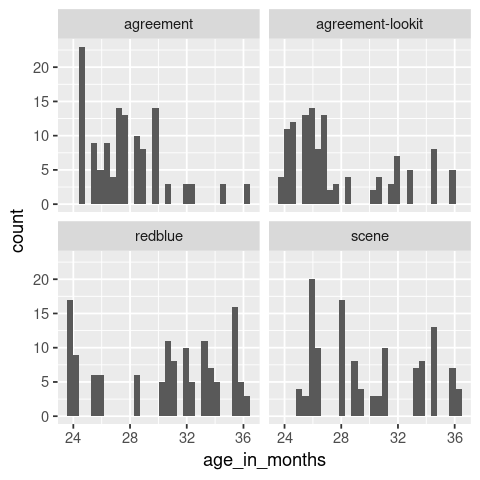

In [320]:
ggplot(subset(code_counts_with_age,age_in_months > 20 & age_in_months < 40 )
      ) + geom_histogram(aes(x=age_in_months)) + facet_wrap(~expt_version)

In [321]:
subj_scores = aggregate(broad_score ~ participant_name + expt_version, 
    subset(code_counts_with_age,age_in_months > 20 & age_in_months < 40),  unique)
print(nrow(subj_scores))
wilcox.test(subj_scores$broad_score~subj_scores$expt_version)
# only 22 with defined narrow scores

[1] 92


ERROR: Error in wilcox.test.formula(subj_scores$broad_score ~ subj_scores$expt_version): grouping factor must have exactly 2 levels


This also provides evidence that we can combine across production tasks in redblue and background versions

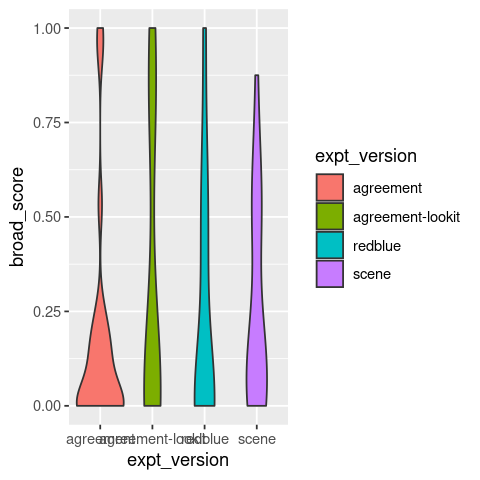

In [322]:
ggplot(subj_scores) + geom_violin(aes(x=expt_version, y=broad_score, fill=expt_version))

In [ ]:
# can combine, but marginal. Narrow score is the correct one.

Compare with existing studies: 

- Zapf and Smith (2007):
- Zapf and Ettlinger (2011): for 22-35 months (m=25.8): 52% correct plurals; 33% singulars, remainder are non-answers
Experimenter says "Can you tell Teddy to get ____" and point to the singulars or the plurals. Common familiar nouns. ****Teddy bear picks up things or not, i.e. there is reinforcement learning.****


# Inter-Annotator Agreement on the Storybook Task

In [ ]:
p_coded$Singular.Code.Downsampled = sapply(as.character(p_coded$Singular.Code), function(x){
    remap[[x]]
})
p_coded$Plural.Code.Downsampled = unlist(sapply(as.character(p_coded$Plural.Code), function(x){
    remap[[x]]
}))

In [ ]:
p_coded_check = subset(read.csv('productions_coded_check.csv', stringsAsFactors=F), !(child %in% c(
'oddParticipant', 'evenParticipant')) & !(itemId %in% c('p1','p2','p3','p4'))) 
p_coded_check$X = NULL
remap_check = list()
remap_check[['No Data']] = 'No Data'
remap_check[['singular']] = 'Singular'
remap_check[['no response / non-relevant']] = 'No Response / Not Relevant'
remap_check[['non-conventional plural']] = 'Non-Conventional Plural'
remap_check[['plural']] = 'Plural'
remap_check[['']] = ''

p_coded_check$Singular.Code = sapply(as.character(p_coded_check$Singular.Code),
    function(x){
    remap_check[[x]]
})
p_coded_check$Plural.Code = sapply(as.character(p_coded_check$Plural.Code), function(x){
    remap_check[[x]]
})
nrow(p_coded_check)

In [ ]:
# From my downsampling of the codes
# remap[['0']] = 'No Data'
# remap[['1']] = 'No Response / Not Relevant'
# remap[['2']] = 'No Response / Not Relevant'
# remap[['3']] = 'No Response / Not Relevant'
# remap[['4']] = 'No Response / Not Relevant'
# remap[['5']] = 'Singular'
# remap[['6']] = 'Non-Conventional Plural'
# remap[['7']] = 'Plural'
# remap[['8']] = 'Plural'

In [ ]:
p_coded_both = as.data.frame(merge(
    p_coded_check, p_coded[,c('child','Lemma','Singular.Code.Downsampled',
                                'Plural.Code.Downsampled')]),
    by = c('child','Lemma'))
p_coded_both$Singular.Code.Downsampled = as.character(p_coded_both$Singular.Code.Downsampled)

In [ ]:
nrow(subset(p_coded, child %in% unique(p_coded_check$child))) # expect 400

In [ ]:
length(unique(p_coded_both$child))
nrow(p_coded_both)

In [ ]:
library('irr')

In [ ]:
p_coded_both[,c('Singular.Code','Singular.Code.Downsampled')]


In [ ]:
sing_kappa = kappa2(p_coded_both[,c('Singular.Code','Singular.Code.Downsampled')])
sing_kappa

In [ ]:
pl_kappa = kappa2(p_coded_both[,c('Plural.Code','Plural.Code.Downsampled')])
pl_kappa

In [ ]:
tvc = update_texvar_cache(tvc, 'kappaPlurals', pl_kappa$value)
tvc = update_texvar_cache(tvc, 'kappaSingulars', sing_kappa$value)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [ ]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(p_coded_both, aes(x=Singular.Code, y=Singular.Code.Downsampled)) + stat_bin2d(
) + stat_bin2d(geom = "text", aes(label = ..count..), binwidth = 1, color='white'
)  + ylab('Stephan') + xlab('Jess')

In [ ]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(p_coded_both, aes(x=Plural.Code, y=Plural.Code.Downsampled)) + stat_bin2d(
) + stat_bin2d(geom = "text", aes(label = ..count..), binwidth = 1, color='white'
)  + ylab('Stephan') + xlab('Jess')

# Vocabulary vs. Plural Knowledge

In [ ]:
# pull in CDI scores

# Response Time When Looking at Distractor

In [ ]:
metadata_cols = c('animacystatus', 'background_context','distractorimage',
'distractorloc', 'expt_index', 'full_carrier', 'novel_id', 'novelcolor',
'novelty', 'order', 'pl_carrier', 'pl_form', 'pl_punct', 'pl_sentence',
'pl_wav_index', 'practice', 's_carrier', 's_form', 's_punct',
's_sentence', 's_wav_index', 'simple_pl_stim', 'simple_s_stim', 'target',
'targetimage', 'targetloc', 'targetside', 'test_index', 'trial', 'voicing', 'vowel_carrier',
'RECORDING_SESSION_LABEL')

In [ ]:
names(ed_df)

In [ ]:
fixreports = split(ed_df, ed_df$filename)

In [ ]:
source('PLEARN_analysis_helper.R')
test_df = do.call('rbind',lapply(fixreports, function(fixreport){
    getParticipantRTs(380, fixreport, label_colname="CURRENT_FIX_INTEREST_AREA_LABEL", metadata_cols, include_non_roi_label=T)
})) 

In [ ]:
# 10/10/19: this is failing because of an edge case where we don't see any fixations before disambiguation

In [ ]:
getRTComparisonPlot = function(test_df, split_var, facet_var = NULL){
    
    agg_equation = paste("rt ~", split_var)
    if (!is.null(facet_var)){
        agg_equation = paste(agg_equation, "+", facet_var)
    }
    summary_df = do.call(data.frame, aggregate(as.formula(agg_equation), data = test_df, FUN = function(x)
        c(mean = mean(x), sd = sd(x))))
    print(names(summary_df))                   
    
    options(repr.plot.width=4, repr.plot.height=4)
    p1 = ggplot(test_df) + geom_violin(mapping=aes(y=rt, x=factor(test_df[[split_var
]]), colour=factor(test_df[[split_var]]))) + theme_bw(
) + geom_errorbar(data = summary_df, mapping=aes(x=factor(summary_df[[split_var
]]), ymin =  rt.mean - rt.sd, ymax = rt.mean + rt.sd), width = 0.1, alpha=.5) + geom_errorbar(data = summary_df, mapping=aes(x=factor(summary_df[[split_var
]]), ymin =  rt.mean, ymax = rt.mean)) + theme_bw(
) + geom_hline(yintercept=0, colour='black', linetype='dashed'
) + geom_hline(yintercept=367, colour='forestgreen') + coord_flip(
ylim= c(0,2000)) + xlab(split_var) + ylab(''
) + theme(legend.position="none")
    
    if (!is.null(facet_var)){
        options(repr.plot.width=4, repr.plot.height=8)
        p1 = p1 + facet_wrap(as.formula(paste('~', facet_var, sep='')), ncol=1)
    }
    print(p1)
                                               
    p2 = ggplot(test_df) + geom_histogram(mapping=aes(x=rt, fill=factor(test_df[[split_var]]))
    ) + theme_bw() + geom_errorbarh(data = summary_df, 
    mapping=aes(y=factor(summary_df[[split_var]]), xmin =  rt.mean - rt.sd, xmax = rt.mean + rt.sd),
    width = 0.1, alpha=.5) + geom_errorbarh(data = summary_df, mapping=aes(y=factor(summary_df[[split_var
    ]]), xmin =  rt.mean, xmax = rt.mean)) + theme_bw() + geom_vline(xintercept=0, 
    colour='black', linetype='dashed') + geom_vline(xintercept=367, colour='forestgreen'
    ) + coord_cartesian(xlim= c(0,2000)) + theme(legend.position="none")
    
    if (!is.null(facet_var)){
        options(repr.plot.width=4, repr.plot.height=8)
        p2 = p2 + facet_wrap(as.formula(paste('~', facet_var, '+', split_var, sep='')), ncol=1)
    } else {
        p2 = p2 + facet_wrap(as.formula(paste('~', split_var, sep='')), ncol=1)
    }
    #print(p2)                                  
                                               
                                               
}

In [ ]:
names(test_df)

In [ ]:
getRTComparisonPlot(test_df, split_var = 'RECORDING_SESSION_LABEL', facet_var='target')

In [ ]:
getRTComparisonPlot(test_df, split_var = 'target')

In [ ]:
getRTComparisonPlot(test_df, split_var = 'target', facet_var = 'RECORDING_SESSION_LABEL')

In [ ]:
getRTComparisonPlot(test_df,split_var = 'voicing', facet_var='target')

In [ ]:
getRTComparisonPlot(test_df,split_var = 'novelty', facet_var='target')

In [ ]:
getRTComparisonPlot(test_df,split_var = 'animacystatus', facet_var='target')

In [ ]:
names(test_df)

In [ ]:
library('lme4')
lm = lmer(rt ~ novelty + voicing + animacystatus + 
    (novelty + voicing + animacystatus | RECORDING_SESSION_LABEL) +(1|s_form), data=
 test_df, )
summary(lm)

# Preference Before Disambiguation

In [ ]:
beforeafter_disambig_df = subset(ed_df, 
    CURRENT_FIX_INTEREST_AREA_LABEL %in% c('TARGET','DISTRACTOR')) 
beforeafter_disambig_df$looking_at_plural = 0
beforeafter_disambig_df$looking_at_plural[
    beforeafter_disambig_df$CURRENT_FIX_INTEREST_AREA_LABEL == 'TARGET' & 
    beforeafter_disambig_df$target == 'pl'] = 1
beforeafter_disambig_df$looking_at_plural[
    beforeafter_disambig_df$CURRENT_FIX_INTEREST_AREA_LABEL == 'DISTRACTOR' & 
    beforeafter_disambig_df$target == 's'] = 1
beforeafter_disambig_df$beforeafter = 'After Disambiguation'
beforeafter_disambig_df$beforeafter[beforeafter_disambig_df$Time < 367] = 'Before Disambiguation'
beforeafter_disambig_preference = aggregate(looking_at_plural ~ participant_name +
    type + beforeafter + TRIAL_INDEX, 
    beforeafter_disambig_df, mean)

beforeafter_disambig_by_subject = do.call(data.frame, aggregate(looking_at_plural ~ participant_name + type +  beforeafter, beforeafter_disambig_preference, FUN = function(x){c(mean=mean(x), sd = sd(x))}))                                       

print(beforeafter_disambig_by_subject)

In [ ]:
beforeafter_disambig_by_subject$looking_at_plural_low = 
    beforeafter_disambig_by_subject$looking_at_plural.mean - beforeafter_disambig_by_subject$looking_at_plural.sd
beforeafter_disambig_by_subject$looking_at_plural_high = 
    beforeafter_disambig_by_subject$looking_at_plural.mean + beforeafter_disambig_by_subject$looking_at_plural.sd

In [ ]:
#options(repr.plot.width=4, repr.plot.height=4)
ggplot(subset(beforeafter_disambig_by_subject, beforeafter == "Before Disambiguation" &
type == 'adult')) + geom_errorbar(aes(x=participant_name, ymin= looking_at_plural_low,
 ymax= looking_at_plural_high), color='red') + geom_point(aes(x=participant_name, 
y=looking_at_plural.mean)) + theme_classic() + geom_hline(yintercept=.5, linetype = 'dashed'
) + xlab('Participant') + ylab('Mean Proportion Looks to Plural\n Before Disambiguation (SD)'
) + theme(axis.text.x = element_text(angle = 90, hjust = 1)) + facet_wrap(~type)

In [ ]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(subset(beforeafter_disambig_by_subject, beforeafter == "Before Disambiguation" &
type == 'child')) + geom_errorbar(aes(x=participant_name, ymin= looking_at_plural_low,
 ymax= looking_at_plural_high), color='red') + geom_point(aes(x=participant_name, 
y=looking_at_plural.mean)) + theme_classic() + geom_hline(yintercept=.5, linetype = 'dashed'
) + xlab('Participant') + ylab('Mean Proportion Looks to Plural\n Before Disambiguation (SD)'
) + theme(axis.text.x = element_text(angle = 90, hjust = 1)) + facet_wrap(~type)

In [ ]:
# should the last fix before disambig be excluded
#[X] Confirm that 0 is the point of disambig for everyone
#[X] propagate the information about the trials
#[X] Make sure that my ordering is doing the right thing
#[X] how to account for the 200 ms exclusion
#[X] have a bit of a buffer on either side of 0 in case there’s an NA instead of a 0/1 in that exact timebin
#    -- so far this is just looking backwards
#[ ] need to recompute wrt the beginning of the /s/ or /z/ segment, not the end

# Experimental Visualizations + Analyses 

## Binomial Test for Receptive Knowledge

In [ ]:
# requires updating since refactoring

In [ ]:
pl06_fixbins$is_looking_at_target  = as.numeric(pl06_fixbins$CURRENT_FIX_INTEREST_AREA_LABEL == 'TARGET')

In [ ]:
rlist = getPlotForMethod(fixbin_dfs, adult_fixbin_dfs, 'none')
options(repr.plot.width=10, repr.plot.height=5)
print(rlist$p1)
ggsave('figures/binomialTest_nopreprocessing.pdf', width=20, height=10)

In [ ]:
print(rlist$p2)

False negative rate around .1 on 2-way contrasts when halfway between adult-like knowledge and zero knowledge

False positve rate of around .02 on 1-way contrasts when zero-knowledge

In [ ]:
# takes a long time to run because of the bootstrapping
sim_yoked = getPlotForMethod(fixbin_dfs,adult_fixbin_dfs, 'yoked')
options(repr.plot.width=10, repr.plot.height=5)
print(sim_yoked$p1)
ggsave('figures/binomialTest_yoked.pdf', width=20, height=10)

In [ ]:
sim_yoked$p2

In [ ]:
# takes a long time to run because of the bootstrapping
sim_preceding = getPlotForMethod(fixbin_dfs,adult_fixbin_dfs, 'preceding')
options(repr.plot.width=10, repr.plot.height=5)
print(sim_preceding$p1)
ggsave('figures/binomialTest_preceding.pdf', width=20, height=10)

In [ ]:
sim_preceding$p2

## Gaze Stickiness Plot

In [323]:
fixreport_path = 'results/smflip3_fixreport.txt'
participant_name = gsub('.txt','',tail(strsplit(fixreport_path, '/')[[1]]))[2]

In [327]:
gaze = blabr::fixations_report(fixreport_path)
gaze = merge(gaze, bg_audio_timings[,c('audiotarget','disambig_time')])
gaze$CURRENT_FIX_END = gaze$CURRENT_FIX_END - gaze$disambig_time
gaze$CURRENT_FIX_START = gaze$CURRENT_FIX_START - gaze$disambig_time

In [328]:
fixbins = binifyFixations(gaze, keepCols=c("RECORDING_SESSION_LABEL",
"CURRENT_FIX_INTEREST_AREA_LABEL",
"RT",
"expt_index",
"target",
"s_form",
"novelty",
"animacystatus",
"voicing"))
subset(fixbins, Time==3200)

,timeBin,FixationID,RECORDING_SESSION_LABEL,CURRENT_FIX_INTEREST_AREA_LABEL,RT,expt_index,target,s_form,novelty,animacystatus,voicing,Time
,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
315,160,15,flipsm,DISTRACTOR,-1,27,s,mip,novel,inanimate,voiceless,3200
773,160,34,flipsm,TARGET,-1,5,pl,gip,novel,animate,voiceless,3200
1285,160,54,flipsm,TARGET,-1,26,pl,dup,novel,animate,voiceless,3200
1760,160,74,flipsm,DISTRACTOR,-1,18,pl,nop,novel,inanimate,voiceless,3200
2236,160,89,flipsm,TARGET,-1,20,s,kib,novel,animate,voiced,3200
3655,160,155,flipsm,TARGET,-1,12,pl,kib,novel,animate,voiced,3200
4122,160,175,flipsm,DISTRACTOR,-1,29,pl,deg,novel,animate,voiced,3200
4588,160,193,flipsm,TARGET,-1,9,pl,teb,novel,inanimate,voiced,3200
5038,160,212,flipsm,TARGET,-1,15,pl,pib,novel,inanimate,voiced,3200


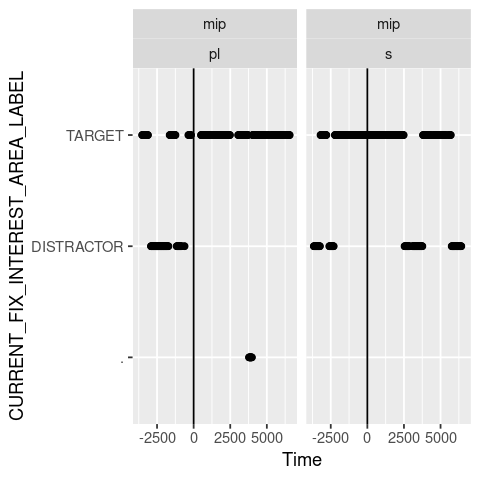

In [329]:
ggplot(subset(fixbins, s_form =='mip')) + geom_point(aes(x=Time, y=CURRENT_FIX_INTEREST_AREA_LABEL)
) + facet_wrap(~s_form * target) + geom_vline(xintercept=0,
	colour='black')

# Is there problem with the distribution of ages?

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message:
“Removed 24 rows containing non-finite values (stat_bin).”


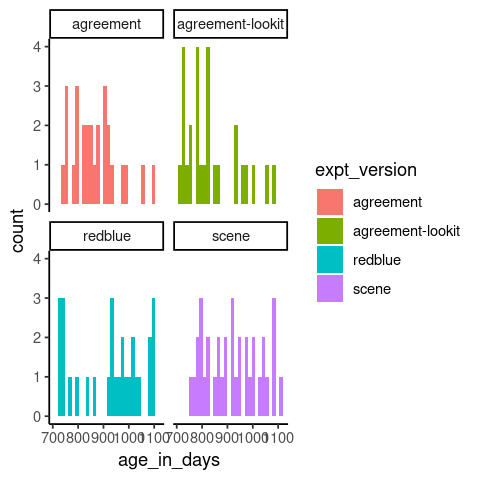

In [331]:
ggplot(subset(subject_info, !is.na(expt_version))) + geom_histogram(aes(x=age_in_days, fill=expt_version))+ facet_wrap(~expt_version) + theme_classic()

In [332]:
names(ed_df)

[1] "participant_name"                "filename"                       
 [3] "expt_version"                    "type"                           
 [5] "expt_index"                      "timeBin"                        
 [7] "FixationID"                      "CURRENT_FIX_START"              
 [9] "CURRENT_FIX_END"                 "TRIAL_INDEX"                    
[11] "CURRENT_FIX_INDEX"               "RECORDING_SESSION_LABEL"        
[13] "CURRENT_FIX_INTEREST_AREA_LABEL" "RT"                             
[15] "target"                          "s_form"                         
[17] "novelty"                         "animacystatus"                  
[19] "voicing"                         "practice"                       
[21] "Time"                            "Nonset"                         
[23] "looks_to_t"                      "looks_to_d"                     
[25] "looks_to_td"                     "exclude_trial"                  
[27] "exclude_subject"                 "label_at_onset"                 
[29] "time_to_last_nonna"              "track_loss_at_0"                
[31] "session_id"                      "AudioTarget"                    
[33] "ms"                              "original_frame_index"           
[35] "frame_index"                     "label"                          
[37] "trial"                           "start_time_ms"                  
[39] "normalized_ms"                   "frame_id"                       
[41] "seconds_recording_before_stim"   "order.x"                        
[43] "normal_or_calibration"           "novel_id"                       
[45] "background_context"              "vowel_carrier"                  
[47] "full_carrier"                    "s_carrier"                      
[49] "s_punct"                         "s_wav_index"                    
[51] "s_sentence"                      "pl_form"                        
[53] "pl_carrier"                      "pl_punct"                       
[55] "pl_wav_index"                    "pl_sentence"                    
[57] "simple_pl_stim"                  "simple_s_stim"                  
[59] "animacyStatus"                   "Trial"                          
[61] "Practice"                        "test_index"                     
[63] "TargetSide"                      "trial_index"                    
[65] "NovelColor"                      "order.y"                        
[67] "TargetLoc"                       "DistractorLoc"                  
[69] "TargetImage"                     "DistractorImage"                
[71] "disambig_time"                   "TimeBin"                        
[73] "cfial_bin"                       "index"                          
[75] "id"                              "include_eyetracking"            
[77] "include_storybook"               "age_in_days"                    
[79] "gender"                          "group"                          
[81] "order"                           "comment"                        
[83] "main_coder"                      "main_validated"                 
[85] "double_coder"                    "double_validated"               
[87] "comments"                        "trial_order"                    
[89] "age_in_months"                   "ran_participant"                
[91] "in_study"                        "broad_score"                    
[93] "narrow_score"                    "name_trial"                     
[95] "first3"

In [333]:
age_per_kept_subj = aggregate(age_in_days ~ expt_version +  participant_name, subset(ed_df, include_eyetracking & !exclude_subject), unique)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



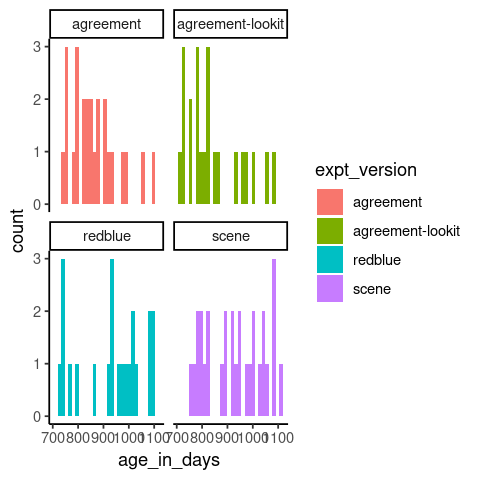

In [334]:
ggplot(age_per_kept_subj) + geom_histogram(aes(x=age_in_days, fill=expt_version))+ facet_wrap(~expt_version) + theme_classic()